<a href="https://colab.research.google.com/github/lapatradaa/shap/blob/main/SHAP_multi_Age.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#DATA

##เรียกใช้ CSV

In [1]:
import pandas as pd
import shutil

In [2]:
#เชื่อม google drive
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
dt_train = pd.read_csv (r'/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Model/Multi_task(Age)(7-25)/Table_train_Predict.csv')
dt_train

,Unnamed: 0,Age(year),Gender,Folder_type,Folder_name,Path_Name,Filename,Fold,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int
0,0,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V1.jpg,2,0,Female,7.107492,7.0,0.000003,Female,0.0
1,1,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV1.jpg,4,0,Female,7.020138,7.0,0.000025,Female,0.0
2,2,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V2.jpg,10,0,Female,6.975561,7.0,0.000808,Female,0.0
3,3,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV2.jpg,9,0,Female,6.938187,7.0,0.000107,Female,0.0
4,4,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V3.jpg,10,0,Female,6.916692,7.0,0.000014,Female,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4184,4184,25,M,Normal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J375.jpg,3,1,Male,25.299234,25.0,0.999988,Male,1.0
4185,4185,25,M,Normal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J437.jpg,5,1,Male,24.729193,25.0,0.999987,Male,1.0
4186,4186,25,M,Normal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J480.jpg,5,1,Male,24.564425,25.0,1.000000,Male,1.0
4187,4187,25,M,Normal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J491.jpg,6,1,Male,24.113144,24.0,1.000000,Male,1.0


In [4]:
df = dt_train.drop(dt_train.columns[0], axis=1)
df

,Age(year),Gender,Folder_type,Folder_name,Path_Name,Filename,Fold,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int
0,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V1.jpg,2,0,Female,7.107492,7.0,0.000003,Female,0.0
1,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV1.jpg,4,0,Female,7.020138,7.0,0.000025,Female,0.0
2,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V2.jpg,10,0,Female,6.975561,7.0,0.000808,Female,0.0
3,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV2.jpg,9,0,Female,6.938187,7.0,0.000107,Female,0.0
4,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V3.jpg,10,0,Female,6.916692,7.0,0.000014,Female,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4184,25,M,Normal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J375.jpg,3,1,Male,25.299234,25.0,0.999988,Male,1.0
4185,25,M,Normal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J437.jpg,5,1,Male,24.729193,25.0,0.999987,Male,1.0
4186,25,M,Normal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J480.jpg,5,1,Male,24.564425,25.0,1.000000,Male,1.0
4187,25,M,Normal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J491.jpg,6,1,Male,24.113144,24.0,1.000000,Male,1.0


In [5]:
# Get unique age values
unique_ages = dt_train['Age(year)'].unique()

# Iterate through unique ages and calculate shape for 'M' gender
for age in unique_ages:
    shape = dt_train[(dt_train['Age(year)'] == age) & (dt_train['Gender'] == 'M')].shape
    print(f"Age {age}: {shape}")

# Get unique age values
unique_ages = dt_train['Age(year)'].unique()

# Iterate through unique ages and calculate shape for 'F' gender
for age in unique_ages:
    shape = dt_train[(dt_train['Age(year)'] == age) & (dt_train['Gender'] == 'F')].shape
    print(f"Age {age}: {shape}")

Age 7: (111, 15)
Age 8: (116, 15)
Age 9: (122, 15)
Age 10: (114, 15)
Age 11: (114, 15)
Age 12: (119, 15)
Age 13: (106, 15)
Age 14: (110, 15)
Age 15: (110, 15)
Age 16: (112, 15)
Age 17: (107, 15)
Age 18: (104, 15)
Age 19: (107, 15)
Age 20: (105, 15)
Age 21: (107, 15)
Age 22: (97, 15)
Age 23: (108, 15)
Age 24: (104, 15)
Age 25: (96, 15)
Age 7: (114, 15)
Age 8: (116, 15)
Age 9: (120, 15)
Age 10: (116, 15)
Age 11: (117, 15)
Age 12: (117, 15)
Age 13: (108, 15)
Age 14: (113, 15)
Age 15: (117, 15)
Age 16: (118, 15)
Age 17: (112, 15)
Age 18: (128, 15)
Age 19: (115, 15)
Age 20: (99, 15)
Age 21: (100, 15)
Age 22: (105, 15)
Age 23: (101, 15)
Age 24: (91, 15)
Age 25: (113, 15)


In [6]:
import pandas as pd
import random

# Sample DataFrame (replace this with your actual DataFrame)
data = {
    'Age(year)': dt_train['Age(year)'],
    'Gender': dt_train['Gender'],
    'Folder_type': dt_train['Folder_type'],
    'Folder_name': dt_train['Folder_name'],
    'Path_Name': dt_train['Path_Name'],
    'Filename': dt_train['Filename'],
}

df = pd.DataFrame(data)

# Calculate the desired number of rows per unique age
desired_per_age = 2660 // (25 - 7 + 1)

# Initialize a list to store selected rows
selected_rows = []

# Iterate through unique age values
for age in range(7, 26):
    # Get all rows with the current age
    age_rows = df[df['Age(year)'] == age]

    # Randomly shuffle the rows for this age
    age_rows = age_rows.sample(frac=1, random_state=42)

    # Determine the number of rows to select for each gender
    rows_per_gender = desired_per_age // 2

    # Select rows for both "Male" and "Female" genders
    selected_male_rows = age_rows[age_rows['Gender'] == 'M'].head(rows_per_gender)
    selected_female_rows = age_rows[age_rows['Gender'] == 'F'].head(rows_per_gender)

    # Append the selected rows to the list
    selected_rows.extend([selected_male_rows, selected_female_rows])

# Concatenate the selected rows for each age into a final DataFrame
selected_dft = pd.concat(selected_rows)

# Now, selected_df contains 950 rows with an approximately even distribution of ages from 7 to 25
# and an equal number of "Male" and "Female" samples for each age.


In [7]:
selected_dft

,Age(year),Gender,Folder_type,Folder_name,Path_Name,Filename
184,7,M,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,VV116.jpg
120,7,M,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,VV13.jpg
207,7,M,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipVV244.jpg
148,7,M,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,VV50.jpg
214,7,M,Normal,Lt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipVV28.jpg
...,...,...,...,...,...,...
4050,25,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J245.jpg
4044,25,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J218.jpg
4024,25,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J148.jpg
4020,25,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J144.jpg


In [9]:
selected_dft.to_csv('/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Model/Multi_task(Age)(7-25)/Bg_train.csv')  # Setting index=False to avoid saving the row numbers as a column

PermissionError: [Errno 1] Operation not permitted: '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Model/Multi_task(Age)(7-25)/Bg_train.csv'

In [11]:
# Get unique age values
unique_ages = selected_dft['Age(year)'].unique()

# Iterate through unique ages and calculate shape for 'M' gender
for age in unique_ages:
    shape = selected_dft[(selected_dft['Age(year)'] == age) & (selected_dft['Gender'] == 'M')].shape
    print(f"Age {age}: {shape}")

# Get unique age values
unique_ages = selected_dft['Age(year)'].unique()

# Iterate through unique ages and calculate shape for 'F' gender
for age in unique_ages:
    shape = selected_dft[(selected_dft['Age(year)'] == age) & (selected_dft['Gender'] == 'F')].shape
    print(f"Age {age}: {shape}")

Age 7: (70, 6)
Age 8: (70, 6)
Age 9: (70, 6)
Age 10: (70, 6)
Age 11: (70, 6)
Age 12: (70, 6)
Age 13: (70, 6)
Age 14: (70, 6)
Age 15: (70, 6)
Age 16: (70, 6)
Age 17: (70, 6)
Age 18: (70, 6)
Age 19: (70, 6)
Age 20: (70, 6)
Age 21: (70, 6)
Age 22: (70, 6)
Age 23: (70, 6)
Age 24: (70, 6)
Age 25: (70, 6)
Age 7: (70, 6)
Age 8: (70, 6)
Age 9: (70, 6)
Age 10: (70, 6)
Age 11: (70, 6)
Age 12: (70, 6)
Age 13: (70, 6)
Age 14: (70, 6)
Age 15: (70, 6)
Age 16: (70, 6)
Age 17: (70, 6)
Age 18: (70, 6)
Age 19: (70, 6)
Age 20: (70, 6)
Age 21: (70, 6)
Age 22: (70, 6)
Age 23: (70, 6)
Age 24: (70, 6)
Age 25: (70, 6)


##test

###อายุ

In [12]:
df_test_age = pd.read_csv (r'/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Model/Multi_task(Age)(7-25)/Table_test_Predict.csv')
df_test_age = df_test_age.iloc[:,1:]
print(df_test_age.shape)
df_test_age

(943, 13)


,Age(year),Gender,Folder_type,Folder_name,Path_Name,Filename,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int
0,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V69.jpg,0,Female,7.423399,7.0,5.141945e-03,Female,0.0
1,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV69.jpg,0,Female,7.415316,7.0,4.618836e-02,Female,0.0
2,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V70.jpg,0,Female,7.548301,8.0,6.406498e-03,Female,0.0
3,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV70.jpg,0,Female,7.492433,7.0,2.021052e-05,Female,0.0
4,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V74.jpg,0,Female,7.343049,7.0,2.091009e-02,Female,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
938,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J132.jpg,0,Female,21.686228,22.0,1.800820e-05,Female,0.0
939,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J145.jpg,0,Female,21.118502,21.0,1.193671e-01,Female,0.0
940,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J149.jpg,0,Female,19.639433,20.0,1.212668e-03,Female,0.0
941,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J158.jpg,0,Female,21.359797,21.0,3.044503e-09,Female,0.0


In [13]:
df_test_age['Age_predict_int'] = df_test_age['Age_predict_int'].astype(int)
df_test_age

,Age(year),Gender,Folder_type,Folder_name,Path_Name,Filename,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int
0,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V69.jpg,0,Female,7.423399,7,5.141945e-03,Female,0.0
1,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV69.jpg,0,Female,7.415316,7,4.618836e-02,Female,0.0
2,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V70.jpg,0,Female,7.548301,8,6.406498e-03,Female,0.0
3,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV70.jpg,0,Female,7.492433,7,2.021052e-05,Female,0.0
4,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V74.jpg,0,Female,7.343049,7,2.091009e-02,Female,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
938,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J132.jpg,0,Female,21.686228,22,1.800820e-05,Female,0.0
939,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J145.jpg,0,Female,21.118502,21,1.193671e-01,Female,0.0
940,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J149.jpg,0,Female,19.639433,20,1.212668e-03,Female,0.0
941,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J158.jpg,0,Female,21.359797,21,3.044503e-09,Female,0.0


In [14]:
e = df_test_age[df_test_age['Age(year)'] == df_test_age['Age_predict_int']]
e

,Age(year),Gender,Folder_type,Folder_name,Path_Name,Filename,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int
0,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V69.jpg,0,Female,7.423399,7,0.005142,Female,0.0
1,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV69.jpg,0,Female,7.415316,7,0.046188,Female,0.0
3,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV70.jpg,0,Female,7.492433,7,0.000020,Female,0.0
4,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V74.jpg,0,Female,7.343049,7,0.020910,Female,0.0
5,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV74.jpg,0,Female,7.095627,7,0.003455,Female,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
921,12,M,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,OO98.jpg,1,Male,12.105593,12,0.044166,Female,0.0
922,14,F,Abnormal,Lt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipY95.jpg,0,Female,14.101776,14,0.000650,Female,0.0
923,14,F,Abnormal,Lt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipY187.jpg,0,Female,13.616200,14,0.978944,Male,1.0
924,14,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,Y100.jpg,0,Female,14.041607,14,0.000008,Female,0.0


In [15]:
e = e.sort_values(by='Age(year)', kind='mergesort')
e

,Age(year),Gender,Folder_type,Folder_name,Path_Name,Filename,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int
0,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V69.jpg,0,Female,7.423399,7,0.005142,Female,0.0
1,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV69.jpg,0,Female,7.415316,7,0.046188,Female,0.0
3,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV70.jpg,0,Female,7.492433,7,0.000020,Female,0.0
4,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V74.jpg,0,Female,7.343049,7,0.020910,Female,0.0
5,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV74.jpg,0,Female,7.095627,7,0.003455,Female,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
760,22,M,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipU422.jpg,1,Male,22.010904,22,0.999999,Male,1.0
765,22,M,Normal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,U292.jpg,1,Male,21.844440,22,0.999998,Male,1.0
809,23,M,Normal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,E356.jpg,1,Male,22.836693,23,0.999958,Male,1.0
880,25,F,Normal,Lt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipJ71.jpg,0,Female,24.869873,25,1.000000,Male,1.0


In [16]:
e['Age(year)'].unique()

array([ 7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23,
       25])

In [17]:
selected_test = e
selected_test

,Age(year),Gender,Folder_type,Folder_name,Path_Name,Filename,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int
0,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V69.jpg,0,Female,7.423399,7,0.005142,Female,0.0
1,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV69.jpg,0,Female,7.415316,7,0.046188,Female,0.0
3,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV70.jpg,0,Female,7.492433,7,0.000020,Female,0.0
4,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V74.jpg,0,Female,7.343049,7,0.020910,Female,0.0
5,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV74.jpg,0,Female,7.095627,7,0.003455,Female,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
760,22,M,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipU422.jpg,1,Male,22.010904,22,0.999999,Male,1.0
765,22,M,Normal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,U292.jpg,1,Male,21.844440,22,0.999998,Male,1.0
809,23,M,Normal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,E356.jpg,1,Male,22.836693,23,0.999958,Male,1.0
880,25,F,Normal,Lt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipJ71.jpg,0,Female,24.869873,25,1.000000,Male,1.0


#Create background data

In [18]:
import pandas as pd
import numpy as np
import torch
from tensorflow.keras.preprocessing.image import load_img, img_to_array

In [19]:
sdf_train = selected_dft.sort_values(by='Age(year)', kind='mergesort')
sdf_train

,Age(year),Gender,Folder_type,Folder_name,Path_Name,Filename
184,7,M,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,VV116.jpg
120,7,M,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,VV13.jpg
207,7,M,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipVV244.jpg
148,7,M,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,VV50.jpg
214,7,M,Normal,Lt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipVV28.jpg
...,...,...,...,...,...,...
4050,25,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J245.jpg
4044,25,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J218.jpg
4024,25,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J148.jpg
4020,25,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J144.jpg


In [20]:
sdf_train['Age(year)'].unique()

array([ 7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23,
       24, 25])

**sdf_test**

In [21]:
print(selected_test.shape)
selected_test.head()

(291, 13)


,Age(year),Gender,Folder_type,Folder_name,Path_Name,Filename,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int
0,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V69.jpg,0,Female,7.423399,7,0.005142,Female,0.0
1,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV69.jpg,0,Female,7.415316,7,0.046188,Female,0.0
3,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV70.jpg,0,Female,7.492433,7,0.000020,Female,0.0
4,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V74.jpg,0,Female,7.343049,7,0.020910,Female,0.0
5,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV74.jpg,0,Female,7.095627,7,0.003455,Female,0.0


In [22]:
sdf_test = selected_test.sort_values(by='Age(year)', kind='mergesort')
sdf_test

,Age(year),Gender,Folder_type,Folder_name,Path_Name,Filename,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int
0,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V69.jpg,0,Female,7.423399,7,0.005142,Female,0.0
1,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV69.jpg,0,Female,7.415316,7,0.046188,Female,0.0
3,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV70.jpg,0,Female,7.492433,7,0.000020,Female,0.0
4,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V74.jpg,0,Female,7.343049,7,0.020910,Female,0.0
5,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV74.jpg,0,Female,7.095627,7,0.003455,Female,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
760,22,M,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipU422.jpg,1,Male,22.010904,22,0.999999,Male,1.0
765,22,M,Normal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,U292.jpg,1,Male,21.844440,22,0.999998,Male,1.0
809,23,M,Normal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,E356.jpg,1,Male,22.836693,23,0.999958,Male,1.0
880,25,F,Normal,Lt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipJ71.jpg,0,Female,24.869873,25,1.000000,Male,1.0


In [23]:
sdf_test['Age(year)'].unique()

array([ 7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23,
       25])

In [24]:
def process_input(dt_train):
    # Initialize an empty list to store background data
    background_data = []

    # Ensure 'Path_Name' column exists in the DataFrame
    if 'Path_Name' not in dt_train.columns:
        raise ValueError("The 'Path_Name' column does not exist in the DataFrame.")

    # Loop to preprocess and create the background data
    for i in range(len(dt_train)):
        print(f"Processing image {i+1}/{len(dt_train)}")
        # Get the image path from the DataFrame
        image_path = dt_train['Path_Name'].iloc[i]  # Use .iloc to access rows by integer index
        # Load and preprocess the image
        image = load_img(image_path, target_size=(224, 224))  # Adjust target_size
        preprocessed_image = img_to_array(image) / 255.0  # Normalize pixel values

        # Add the preprocessed image to the background_data list
        background_data.append(preprocessed_image)

    return background_data


In [25]:
background_train = process_input(sdf_train)

Processing image 1/2660
Processing image 2/2660
Processing image 3/2660
Processing image 4/2660
Processing image 5/2660
Processing image 6/2660
Processing image 7/2660
Processing image 8/2660
Processing image 9/2660
Processing image 10/2660
Processing image 11/2660
Processing image 12/2660
Processing image 13/2660
Processing image 14/2660
Processing image 15/2660
Processing image 16/2660
Processing image 17/2660
Processing image 18/2660
Processing image 19/2660
Processing image 20/2660
Processing image 21/2660
Processing image 22/2660
Processing image 23/2660
Processing image 24/2660
Processing image 25/2660
Processing image 26/2660
Processing image 27/2660
Processing image 28/2660
Processing image 29/2660
Processing image 30/2660
Processing image 31/2660
Processing image 32/2660
Processing image 33/2660
Processing image 34/2660
Processing image 35/2660
Processing image 36/2660
Processing image 37/2660
Processing image 38/2660
Processing image 39/2660
Processing image 40/2660
Processin

In [26]:
print(type(background_train))

<class 'list'>


**background_test**

In [27]:
background_test = process_input(sdf_test)

Processing image 1/291
Processing image 2/291
Processing image 3/291
Processing image 4/291
Processing image 5/291
Processing image 6/291
Processing image 7/291
Processing image 8/291
Processing image 9/291
Processing image 10/291
Processing image 11/291
Processing image 12/291
Processing image 13/291
Processing image 14/291
Processing image 15/291
Processing image 16/291
Processing image 17/291
Processing image 18/291
Processing image 19/291
Processing image 20/291
Processing image 21/291
Processing image 22/291
Processing image 23/291
Processing image 24/291
Processing image 25/291
Processing image 26/291
Processing image 27/291
Processing image 28/291
Processing image 29/291
Processing image 30/291
Processing image 31/291
Processing image 32/291
Processing image 33/291
Processing image 34/291
Processing image 35/291
Processing image 36/291
Processing image 37/291
Processing image 38/291
Processing image 39/291
Processing image 40/291
Processing image 41/291
Processing image 42/291
P

In [28]:
print(type(background_test))

<class 'list'>


##**เปลี่ยนเป็น array**

In [29]:
background_train_array = np.array(background_train)
background_test_array = np.array(background_test)

In [30]:
len(background_train_array)
print(background_train_array.shape)
print(background_test_array.shape)

(2660, 224, 224, 3)
(291, 224, 224, 3)


#Model

## Import

In [31]:
import os
import numpy as np
import pandas as pd
#import efficientnet.tfkeras
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0

##กำหนดค่าพารามิเตอร์


In [32]:
batch_size = 16
width = 224
height = 224
epochs = 250 # รอบในการเทรน
dropout_rate = 0.2
input_shape = (height, width, 3)

## Clone Efficient

In [33]:
#ดึงข้อมูลใน Github มาใช้
import os
%cd /content
if not os.path.isdir("efficientnet_keras_transfer_learning"):
 !git clone https://github.com/Wanita-8943/efficientnet_keras_transfer_learning
%cd efficientnet_keras_transfer_learning/


/content
Cloning into 'efficientnet_keras_transfer_learning'...
remote: Enumerating objects: 1100, done.
remote: Counting objects: 100% (263/263), done.
remote: Compressing objects: 100% (142/142), done.
remote: Total 1100 (delta 133), reused 241 (delta 121), pack-reused 837
Receiving objects: 100% (1100/1100), 14.10 MiB | 9.76 MiB/s, done.
Resolving deltas: 100% (630/630), done.
/content/efficientnet_keras_transfer_learning


## Load Model

In [34]:
import sys
sys.path.append('/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Model/Multi_task(Age)(7-25)/16_Multi_8e-6_250_Unfreeze.h5')

from efficientnet.layers import Swish, DropConnect
from efficientnet.model import ConvKernalInitializer
from tensorflow.keras.utils import get_custom_objects

get_custom_objects().update({
    'ConvKernalInitializer': ConvKernalInitializer,
    'Swish': Swish,
    'DropConnect':DropConnect
})


In [35]:
from tensorflow.keras.models import load_model
model = tf.keras.models.load_model("/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Model/Multi_task(Age)(7-25)/16_Multi_8e-6_250_Unfreeze.h5")
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 112, 112, 32)         864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 112, 112, 32)         128       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 swish (Swish)               (None, 112, 112, 32)         0         ['batch_normalization[0][0

In [36]:
height = width = model.input_shape[1]
print(f"height: {height}, width: {width}")

height: 224, width: 224


In [37]:
# Check the number of output units in the final layer
num_output_units = model.layers[-1].output_shape[-1]

# Check if it's a binary classification model (2 output units) or not
if num_output_units == 2:
    print("This is a binary classification model.")
else:
    print("This is not a binary classification model.")

This is not a binary classification model.


#SHAP

In [38]:
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 538.2/538.2 kB 11.4 MB/s eta 0:00:00


In [39]:
import shap

In [40]:
print(background_test_array.shape)
print(background_test_array[[10]].shape)

(291, 224, 224, 3)
(1, 224, 224, 3)


In [41]:
model.output_names

['prediction_layer', 'prediction_layer2']

In [42]:
model.output_names[0]

'prediction_layer'

In [43]:
model.output_names[1]

'prediction_layer2'

In [44]:
import shap
import tensorflow as tf

# Create separate models for each output you want to explain
model_layer1 = tf.keras.Model(inputs=model.input, outputs=model.get_layer('prediction_layer').output)
model_layer2 = tf.keras.Model(inputs=model.input, outputs=model.get_layer('prediction_layer2').output)


In [45]:
# Define your explainer for the first output layer (prediction_layer)
explainer_layer1 = shap.GradientExplainer(model_layer1, background_train_array)

In [46]:
# Define your explainer for the second output layer (prediction_layer2)
explainer_layer2 = shap.GradientExplainer(model_layer2, background_train_array)

##test

In [47]:
sdf_test

,Age(year),Gender,Folder_type,Folder_name,Path_Name,Filename,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int
0,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V69.jpg,0,Female,7.423399,7,0.005142,Female,0.0
1,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV69.jpg,0,Female,7.415316,7,0.046188,Female,0.0
3,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV70.jpg,0,Female,7.492433,7,0.000020,Female,0.0
4,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V74.jpg,0,Female,7.343049,7,0.020910,Female,0.0
5,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV74.jpg,0,Female,7.095627,7,0.003455,Female,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
760,22,M,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipU422.jpg,1,Male,22.010904,22,0.999999,Male,1.0
765,22,M,Normal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,U292.jpg,1,Male,21.844440,22,0.999998,Male,1.0
809,23,M,Normal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,E356.jpg,1,Male,22.836693,23,0.999958,Male,1.0
880,25,F,Normal,Lt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipJ71.jpg,0,Female,24.869873,25,1.000000,Male,1.0


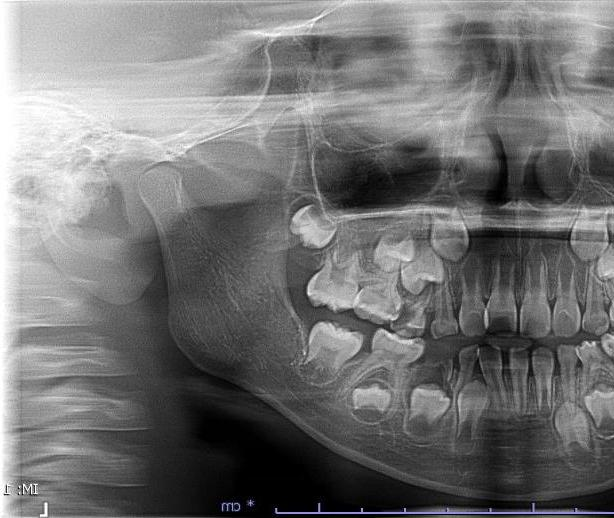

In [48]:
from PIL import Image
Image1 = Image.open('/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/F/Both/FlipV70.jpg')
Image1

In [49]:
sdf_test.reset_index().iloc[2]

index                                                                 3
Age(year)                                                             7
Gender                                                                F
Folder_type                                                      Normal
Folder_name                                                        Both
Path_Name             /content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...
Filename                                                    FlipV70.jpg
Gender_Class                                                          0
Gender_Predict                                                   Female
Age_predict                                                    7.492433
Age_predict_int                                                       7
Gender_predict                                                  0.00002
Gender_predict_str                                               Female
Gender_predict_int                                              

/usr/local/lib/python3.10/dist-packages/keras/src/backend.py:452: UserWarning: `tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
  warnings.warn(


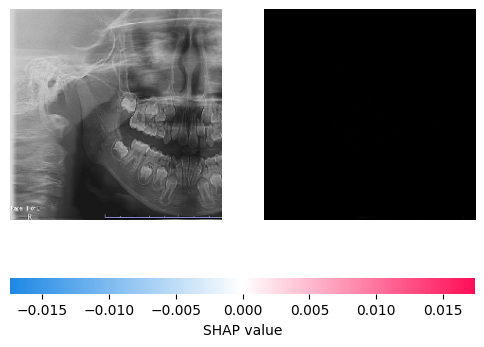

In [50]:
shap_values_F7_1 = explainer_layer1.shap_values(background_test_array[[0]])
%matplotlib inline
shap.image_plot(shap_values_F7_1, background_test_array[[0]])

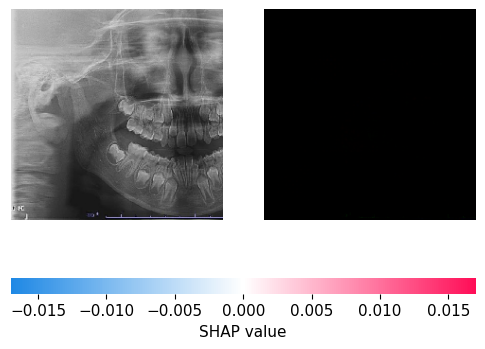

In [306]:
shap_values_F7_2 = explainer_layer1.shap_values(background_test_array[[1]])
shap.image_plot(shap_values_F7_2, background_test_array[[1]])

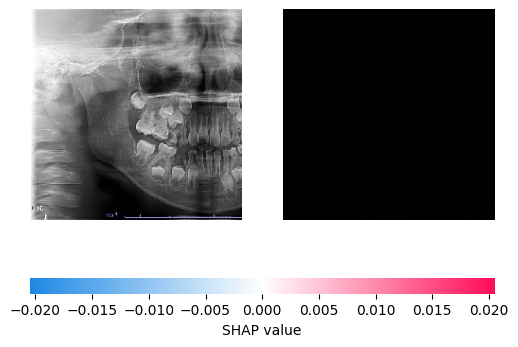

In [52]:
shap_values_F7_3 = explainer_layer1.shap_values(background_test_array[[2]])
shap.image_plot(shap_values_F7_3, background_test_array[[2]])

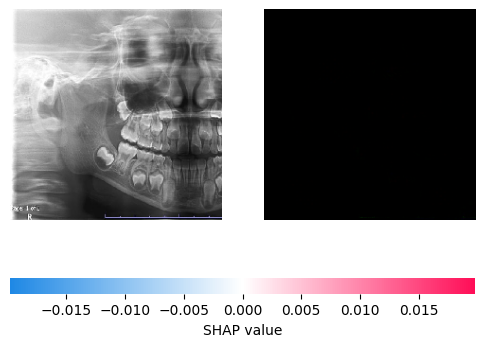

In [53]:
shap_values_M7_1 = explainer_layer1.shap_values(background_test_array[[18]])
shap.image_plot(shap_values_M7_1, background_test_array[[18]])

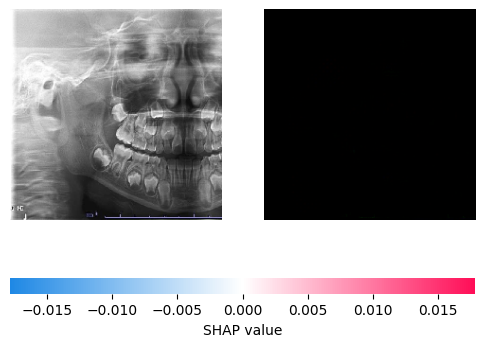

In [54]:
shap_values_M7_2 = explainer_layer1.shap_values(background_test_array[[19]])
shap.image_plot(shap_values_M7_2, background_test_array[[19]])

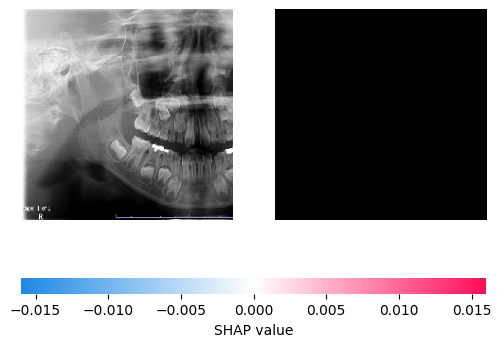

In [55]:
shap_values_M7_3 = explainer_layer1.shap_values(background_test_array[[20]])
shap.image_plot(shap_values_M7_3, background_test_array[[20]])

# percentaile

In [56]:
import numpy as np

# Assuming your data is stored in a variable named 'data'
data_F7_1= [np.array(shap_values_F7_1)]
data_F7_2 = [np.array(shap_values_F7_2)]
data_F7_3 = [np.array(shap_values_F7_3)]
data_M7_1 = [np.array(shap_values_M7_1)]
data_M7_2 = [np.array(shap_values_M7_2)]
data_M7_3 = [np.array(shap_values_M7_3)]
# Extract the array from the list
image_array_F7_1 = data_F7_1[0]
image_array_F7_2 = data_F7_2[0]
image_array_F7_3 = data_F7_3[0]
image_array_M7_1 = data_M7_1[0]
image_array_M7_2 = data_M7_2[0]
image_array_M7_3 = data_M7_3[0]

# Separate positive and negative values for each channel
positive_F7_1 =np.where(image_array_F7_1 >= 0, image_array_F7_1, 0)
negative_F7_1 = np.where(image_array_F7_1 < 0, image_array_F7_1, 0)

positive_F7_2 =np.where(image_array_F7_2 >= 0, image_array_F7_2, 0)
negative_F7_2 = np.where(image_array_F7_2 < 0, image_array_F7_2, 0)

positive_F7_3 =np.where(image_array_F7_3 >= 0, image_array_F7_3, 0)
negative_F7_3 = np.where(image_array_F7_3 < 0, image_array_F7_3, 0)

positive_M7_1 =np.where(image_array_M7_1 >= 0, image_array_M7_1, 0)
negative_M7_1 = np.where(image_array_M7_1 < 0, image_array_M7_1, 0)

positive_M7_2 =np.where(image_array_M7_2 >= 0, image_array_M7_2, 0)
negative_M7_2 = np.where(image_array_M7_2 < 0, image_array_M7_2, 0)

positive_M7_3 =np.where(image_array_M7_3 >= 0, image_array_M7_3, 0)
negative_M7_3 = np.where(image_array_M7_3 < 0, image_array_M7_3, 0)

In [57]:
negative_M7_3.shape

(1, 224, 224, 3, 1)

In [58]:
negative_aps_F7_1 =  np.abs(negative_F7_1)
negative_aps_F7_2 =  np.abs(negative_F7_2)
negative_aps_F7_3 =  np.abs(negative_F7_3)
negative_aps_M7_1 =  np.abs(negative_M7_1)
negative_aps_M7_2 =  np.abs(negative_M7_2)
negative_aps_M7_3 =  np.abs(negative_M7_3)

In [59]:
import numpy as np

# Assuming shap_values_layer1 is your NumPy array with shape (1, 224, 224, 3)
# Flatten the array for normalization and then reshape back to the original shape
#positive
flattened_array_F7_1_pos = positive_F7_1.flatten()
flattened_array_F7_2_pos = positive_F7_2.flatten()
flattened_array_F7_3_pos = positive_F7_3.flatten()
flattened_array_M7_1_pos = positive_M7_1.flatten()
flattened_array_M7_2_pos = positive_M7_2.flatten()
flattened_array_M7_3_pos = positive_M7_3.flatten()

#negative
flattened_array_F7_1_neg = negative_aps_F7_1.flatten()
flattened_array_F7_2_neg = negative_aps_F7_2.flatten()
flattened_array_F7_3_neg = negative_aps_F7_3.flatten()
flattened_array_M7_1_neg = negative_aps_M7_1.flatten()
flattened_array_M7_2_neg = negative_aps_M7_2.flatten()
flattened_array_M7_3_neg = negative_aps_M7_3.flatten()



# Min-Max normalization to scale between 0 and 1
normalized_array_F7_1_pos = (flattened_array_F7_1_pos - np.min(flattened_array_F7_1_pos)) / (np.max(flattened_array_F7_1_pos) - np.min(flattened_array_F7_1_pos))
normalized_array_F7_2_pos = (flattened_array_F7_2_pos - np.min(flattened_array_F7_2_pos)) / (np.max(flattened_array_F7_2_pos) - np.min(flattened_array_F7_2_pos))
normalized_array_F7_3_pos = (flattened_array_F7_3_pos - np.min(flattened_array_F7_3_pos)) / (np.max(flattened_array_F7_3_pos) - np.min(flattened_array_F7_3_pos))
normalized_array_M7_1_pos = (flattened_array_M7_1_pos - np.min(flattened_array_M7_1_pos)) / (np.max(flattened_array_M7_1_pos) - np.min(flattened_array_M7_1_pos))
normalized_array_M7_2_pos = (flattened_array_M7_2_pos - np.min(flattened_array_M7_2_pos)) / (np.max(flattened_array_M7_2_pos) - np.min(flattened_array_M7_2_pos))
normalized_array_M7_3_pos = (flattened_array_M7_3_pos - np.min(flattened_array_M7_3_pos)) / (np.max(flattened_array_M7_3_pos) - np.min(flattened_array_M7_3_pos))

normalized_array_F7_1_neg = (flattened_array_F7_1_neg - np.min(flattened_array_F7_1_neg)) / (np.max(flattened_array_F7_1_neg) - np.min(flattened_array_F7_1_neg))
normalized_array_F7_2_neg = (flattened_array_F7_2_neg - np.min(flattened_array_F7_2_neg)) / (np.max(flattened_array_F7_2_neg) - np.min(flattened_array_F7_2_neg))
normalized_array_F7_3_neg = (flattened_array_F7_3_neg - np.min(flattened_array_F7_3_neg)) / (np.max(flattened_array_F7_3_neg) - np.min(flattened_array_F7_3_neg))
normalized_array_M7_1_neg = (flattened_array_M7_1_neg - np.min(flattened_array_M7_1_neg)) / (np.max(flattened_array_M7_1_neg) - np.min(flattened_array_M7_1_neg))
normalized_array_M7_2_neg = (flattened_array_M7_2_neg - np.min(flattened_array_M7_2_neg)) / (np.max(flattened_array_M7_2_neg) - np.min(flattened_array_M7_2_neg))
normalized_array_M7_3_neg = (flattened_array_M7_3_neg - np.min(flattened_array_M7_3_neg)) / (np.max(flattened_array_M7_3_neg) - np.min(flattened_array_M7_3_neg))

# Reshape back to the original shape
normalized_positive_F7_1 = normalized_array_F7_1_pos.reshape(positive_F7_1.shape)
normalized_positive_F7_2 = normalized_array_F7_2_pos.reshape(positive_F7_2.shape)
normalized_positive_F7_3 = normalized_array_F7_3_pos.reshape(positive_F7_3.shape)
normalized_positive_M7_1 = normalized_array_M7_1_pos.reshape(positive_M7_1.shape)
normalized_positive_M7_2 = normalized_array_M7_2_pos.reshape(positive_M7_2.shape)
normalized_positive_M7_3 = normalized_array_M7_3_pos.reshape(positive_M7_3.shape)


normalized_negative_F7_1 = normalized_array_F7_1_neg.reshape(negative_aps_F7_1.shape)
normalized_negative_F7_2 = normalized_array_F7_2_neg.reshape(negative_aps_F7_2.shape)
normalized_negative_F7_3 = normalized_array_F7_3_neg.reshape(negative_aps_F7_3.shape)
normalized_negative_M7_1 = normalized_array_M7_1_neg.reshape(negative_aps_M7_1.shape)
normalized_negative_M7_2 = normalized_array_M7_2_neg.reshape(negative_aps_M7_2.shape)
normalized_negative_M7_3 = normalized_array_M7_3_neg.reshape(negative_aps_M7_3.shape)


# Combine the three channel images into a single grayscale image
grayscale_image_pos_F7_1 = normalized_positive_F7_1/ 3.0
grayscale_image_pos_F7_2 = normalized_positive_F7_2/ 3.0
grayscale_image_pos_F7_3 = normalized_positive_F7_3/ 3.0
grayscale_image_pos_M7_1 = normalized_positive_M7_1/ 3.0
grayscale_image_pos_M7_2 = normalized_positive_M7_2/ 3.0
grayscale_image_pos_M7_3 = normalized_positive_M7_3/ 3.0

grayscale_image_neg_F7_1 = normalized_negative_F7_1/ 3.0
grayscale_image_neg_F7_2 = normalized_negative_F7_2/ 3.0
grayscale_image_neg_F7_3 = normalized_negative_F7_3/ 3.0
grayscale_image_neg_M7_1 = normalized_negative_M7_1/ 3.0
grayscale_image_neg_M7_2 = normalized_negative_M7_2/ 3.0
grayscale_image_neg_M7_3 = normalized_negative_M7_3/ 3.0


# Assuming shap_values_layer1 is your NumPy array with shape (1,1, 224, 224, 3)
# Calculate the mean across the color channels (axis=3)
grayscale_image_F7_1_positive = np.mean(grayscale_image_pos_F7_1, axis=4)
grayscale_image_F7_2_positive = np.mean(grayscale_image_pos_F7_2, axis=4)
grayscale_image_F7_3_positive = np.mean(grayscale_image_pos_F7_3, axis=4)
grayscale_image_M7_1_positive = np.mean(grayscale_image_pos_M7_1, axis=4)
grayscale_image_M7_2_positive = np.mean(grayscale_image_pos_M7_2, axis=4)
grayscale_image_M7_3_positive = np.mean(grayscale_image_pos_M7_3, axis=4)


grayscale_image_F7_1_negative  = np.mean(grayscale_image_neg_F7_1, axis=4)
grayscale_image_F7_2_negative  = np.mean(grayscale_image_neg_F7_2, axis=4)
grayscale_image_F7_3_negative  = np.mean(grayscale_image_neg_F7_3, axis=4)
grayscale_image_M7_1_negative  = np.mean(grayscale_image_neg_M7_1, axis=4)
grayscale_image_M7_2_negative  = np.mean(grayscale_image_neg_M7_2, axis=4)
grayscale_image_M7_3_negative  = np.mean(grayscale_image_neg_M7_3, axis=4)


# Now, grayscale_image has shape (1, 224, 224)
# Remove the first dimension to get a shape of (224, 224) for plotting
grayscale_image_F7_1_positive = grayscale_image_F7_1_positive.squeeze()
grayscale_image_F7_2_positive = grayscale_image_F7_2_positive.squeeze()
grayscale_image_F7_3_positive = grayscale_image_F7_3_positive.squeeze()
grayscale_image_M7_1_positive = grayscale_image_M7_1_positive.squeeze()
grayscale_image_M7_2_positive = grayscale_image_M7_2_positive.squeeze()
grayscale_image_M7_3_positive = grayscale_image_M7_3_positive.squeeze()

grayscale_image_F7_1_negative = grayscale_image_F7_1_negative.squeeze()
grayscale_image_F7_2_negative = grayscale_image_F7_2_negative.squeeze()
grayscale_image_F7_3_negative = grayscale_image_F7_3_negative.squeeze()
grayscale_image_M7_1_negative = grayscale_image_M7_1_negative.squeeze()
grayscale_image_M7_2_negative = grayscale_image_M7_2_negative.squeeze()
grayscale_image_M7_3_negative = grayscale_image_M7_3_negative.squeeze()

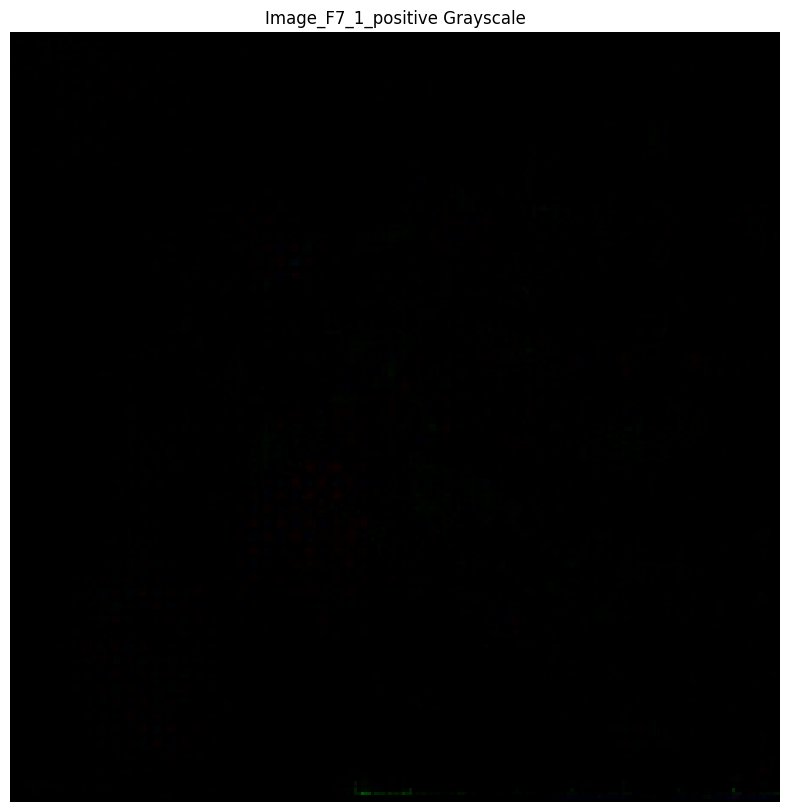

In [60]:
# # Plot the grayscale image
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 10))
plt.imshow(grayscale_image_F7_1_positive, cmap='gray', interpolation='nearest')
plt.title('Image_F7_1_positive Grayscale')
plt.axis('off')
plt.show()

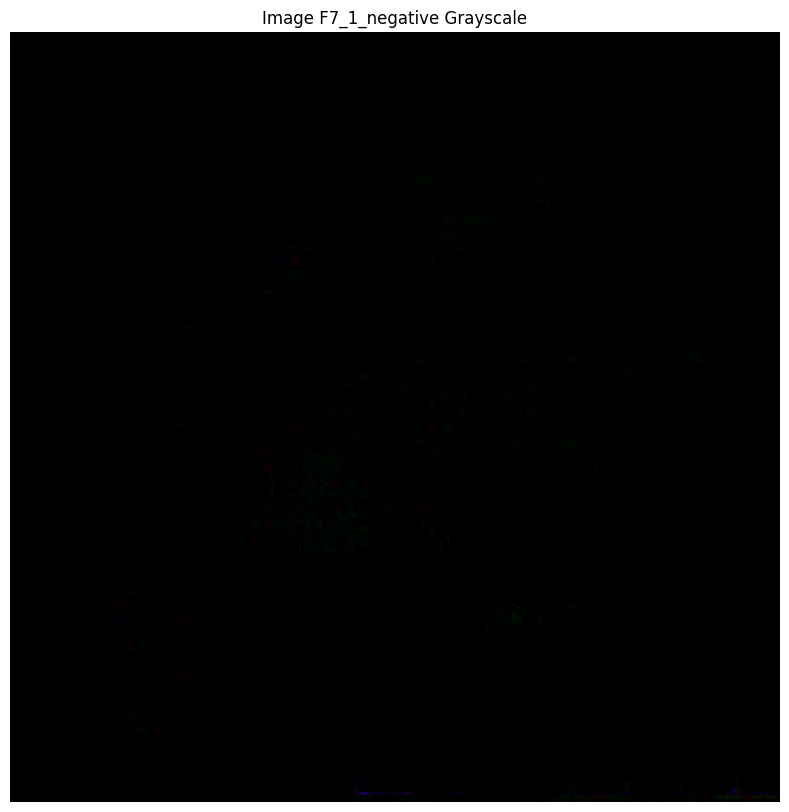

In [61]:
# # Plot the grayscale image
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 10))
plt.imshow(grayscale_image_F7_1_negative, cmap='gray', interpolation='nearest')
plt.title('Image F7_1_negative Grayscale')
plt.axis('off')
plt.show()

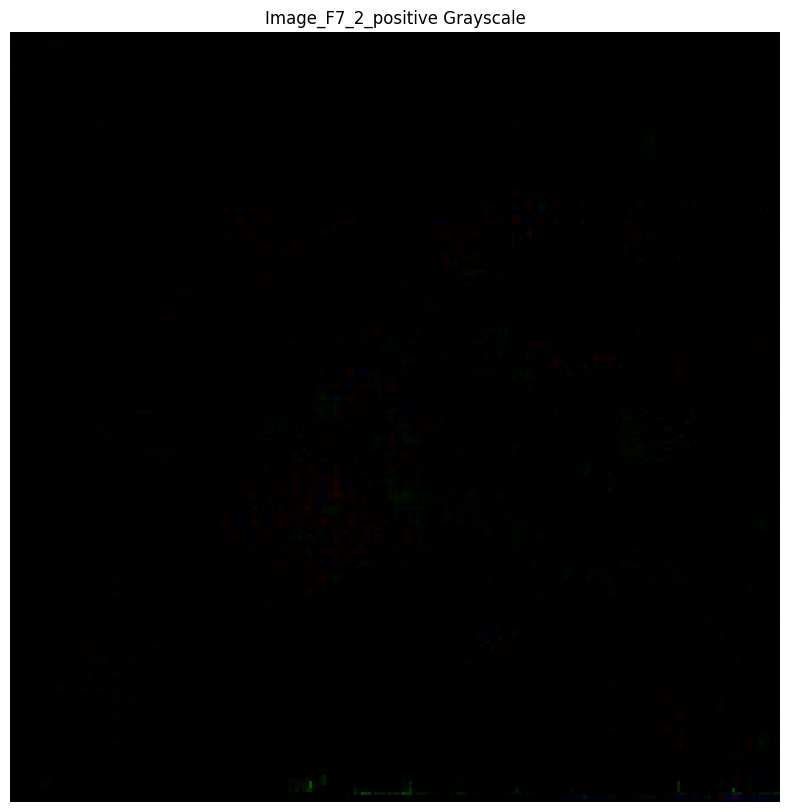

In [62]:
# # Plot the grayscale image
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 10))
plt.imshow(grayscale_image_F7_2_positive, cmap='gray', interpolation='nearest')
plt.title('Image_F7_2_positive Grayscale')
plt.axis('off')
plt.show()

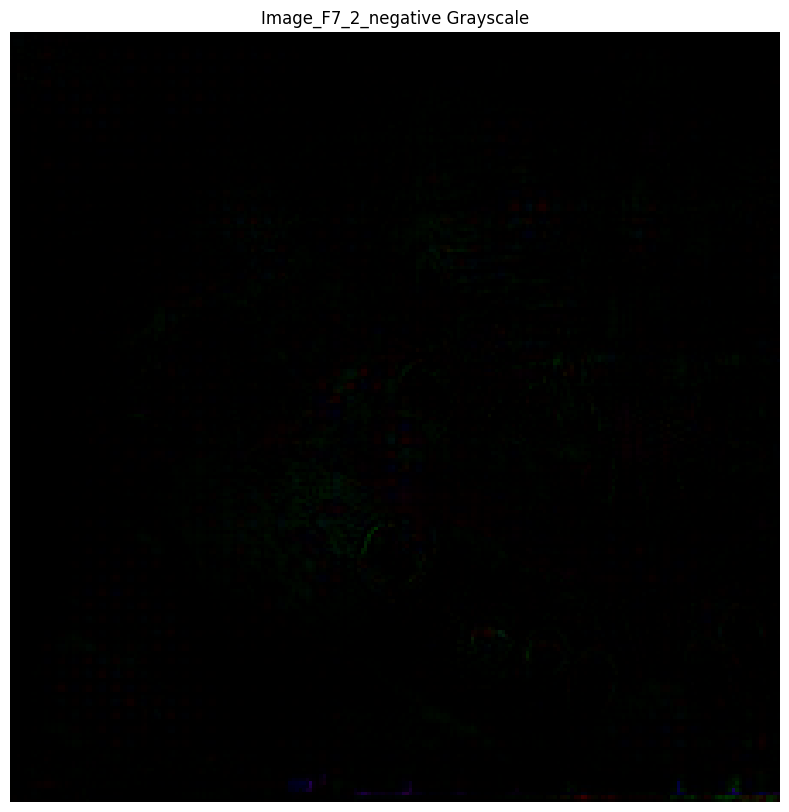

In [63]:
# # Plot the grayscale image
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 10))
plt.imshow(grayscale_image_F7_2_negative, cmap='gray', interpolation='nearest')
plt.title('Image_F7_2_negative Grayscale')
plt.axis('off')
plt.show()

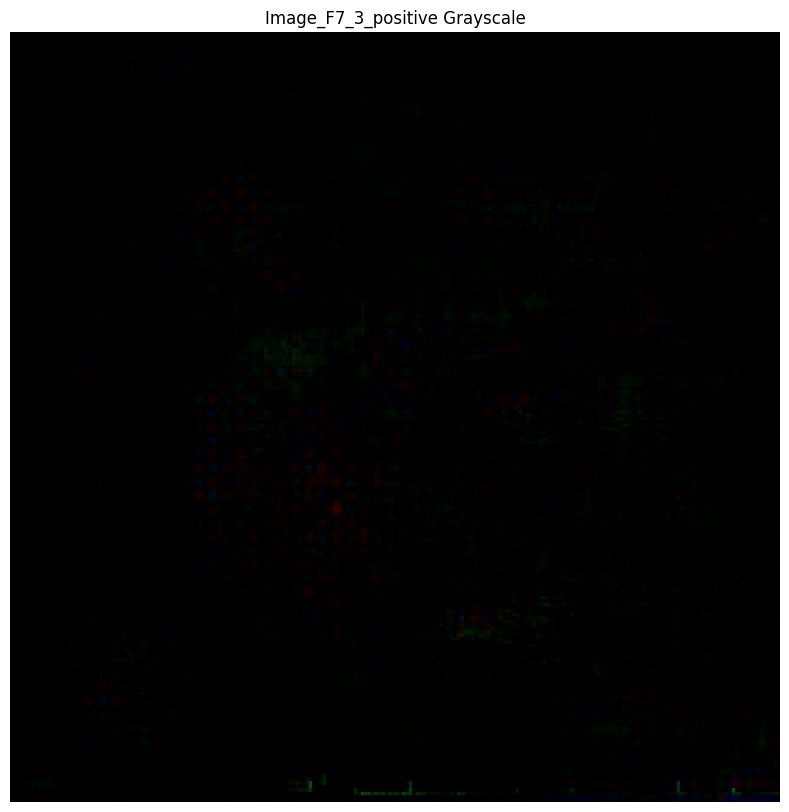

In [64]:
# # Plot the grayscale image
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 10))
plt.imshow(grayscale_image_F7_3_positive, cmap='gray', interpolation='nearest')
plt.title('Image_F7_3_positive Grayscale')
plt.axis('off')
plt.show()

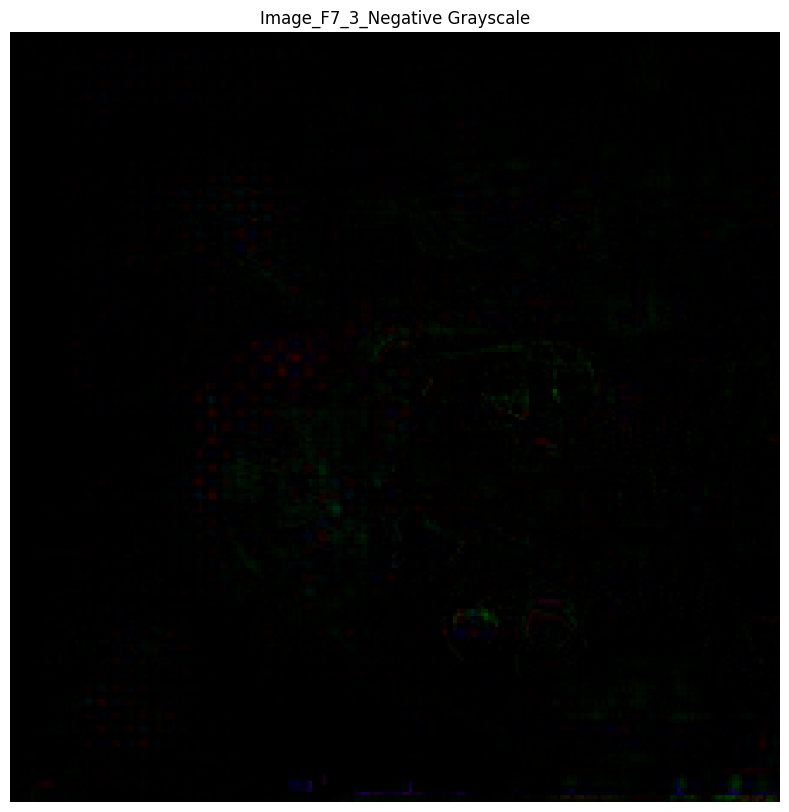

In [65]:
# # Plot the grayscale image
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 10))
plt.imshow(grayscale_image_F7_3_negative, cmap='gray', interpolation='nearest')
plt.title('Image_F7_3_Negative Grayscale')
plt.axis('off')
plt.show()

Male

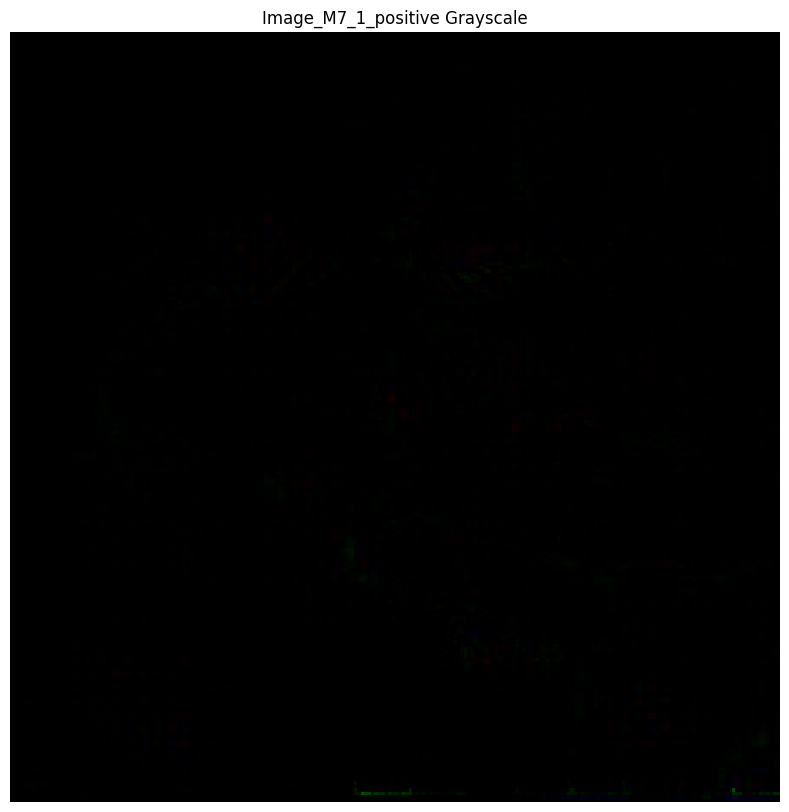

In [66]:
# # Plot the grayscale image
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 10))
plt.imshow(grayscale_image_M7_1_positive, cmap='gray', interpolation='nearest')
plt.title('Image_M7_1_positive Grayscale')
plt.axis('off')
plt.show()

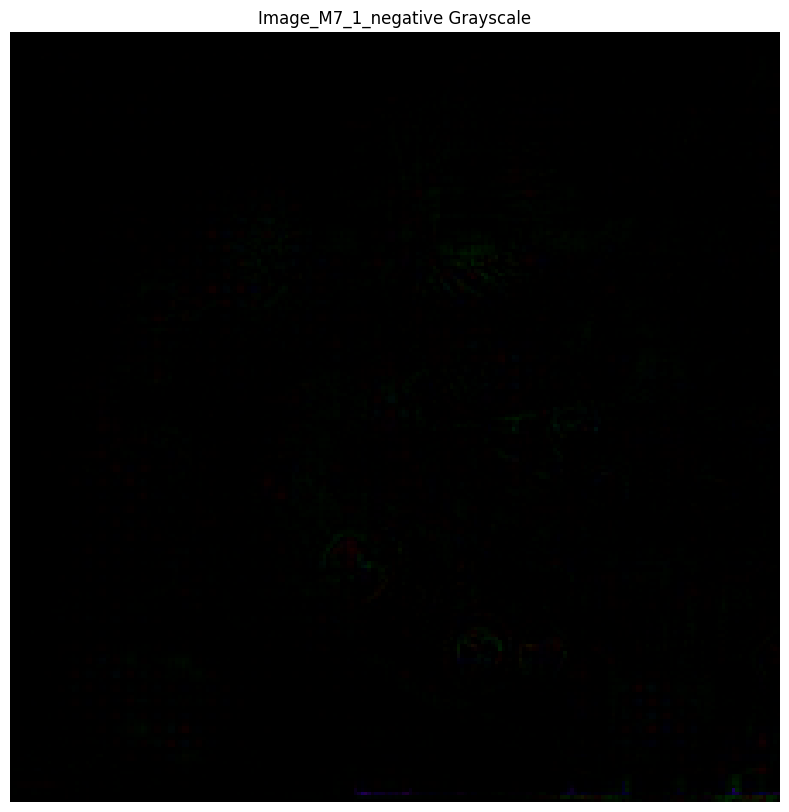

In [67]:
# # Plot the grayscale image
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 10))
plt.imshow(grayscale_image_M7_1_negative, cmap='gray', interpolation='nearest')
plt.title('Image_M7_1_negative Grayscale')
plt.axis('off')
plt.show()

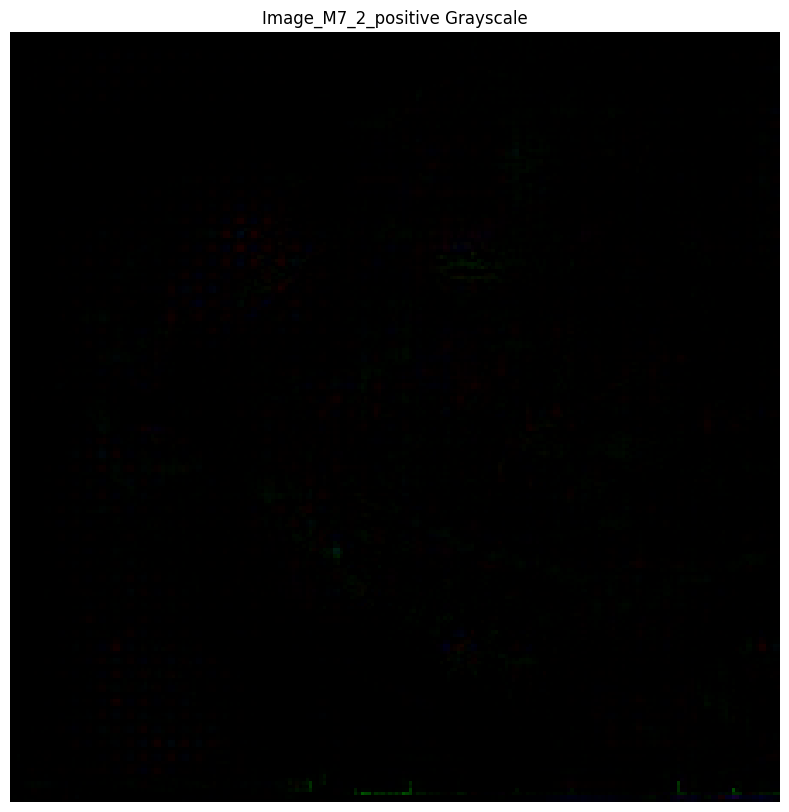

In [68]:
# # Plot the grayscale image
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 10))
plt.imshow(grayscale_image_M7_2_positive, cmap='gray', interpolation='nearest')
plt.title('Image_M7_2_positive Grayscale')
plt.axis('off')
plt.show()

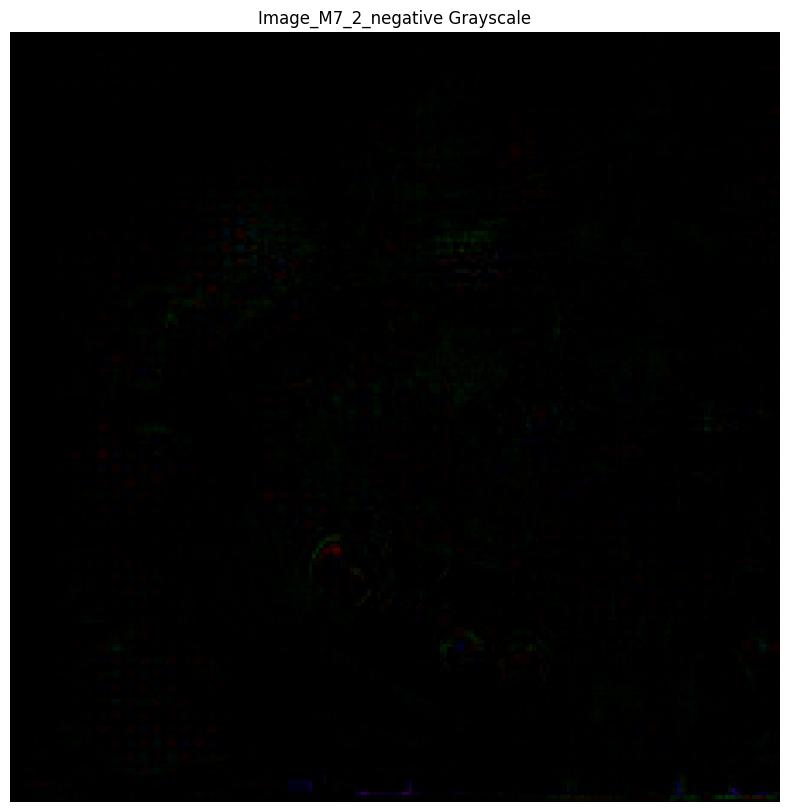

In [69]:
# # Plot the grayscale image
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 10))
plt.imshow(grayscale_image_M7_2_negative, cmap='gray', interpolation='nearest')
plt.title('Image_M7_2_negative Grayscale')
plt.axis('off')
plt.show()

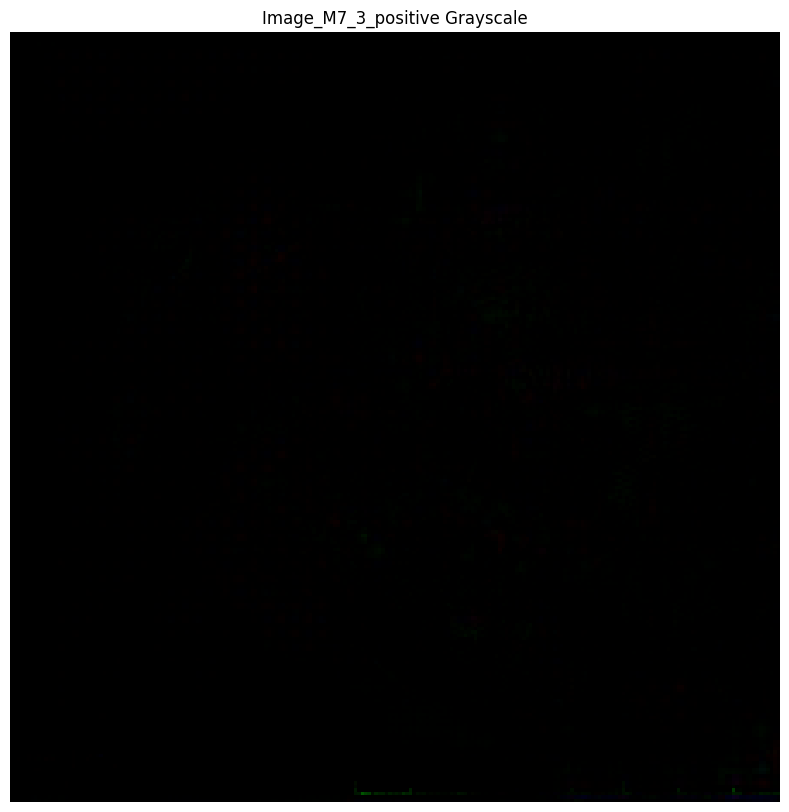

In [70]:
# # Plot the grayscale image
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 10))
plt.imshow(grayscale_image_M7_3_positive, cmap='gray', interpolation='nearest')
plt.title('Image_M7_3_positive Grayscale')
plt.axis('off')
plt.show()

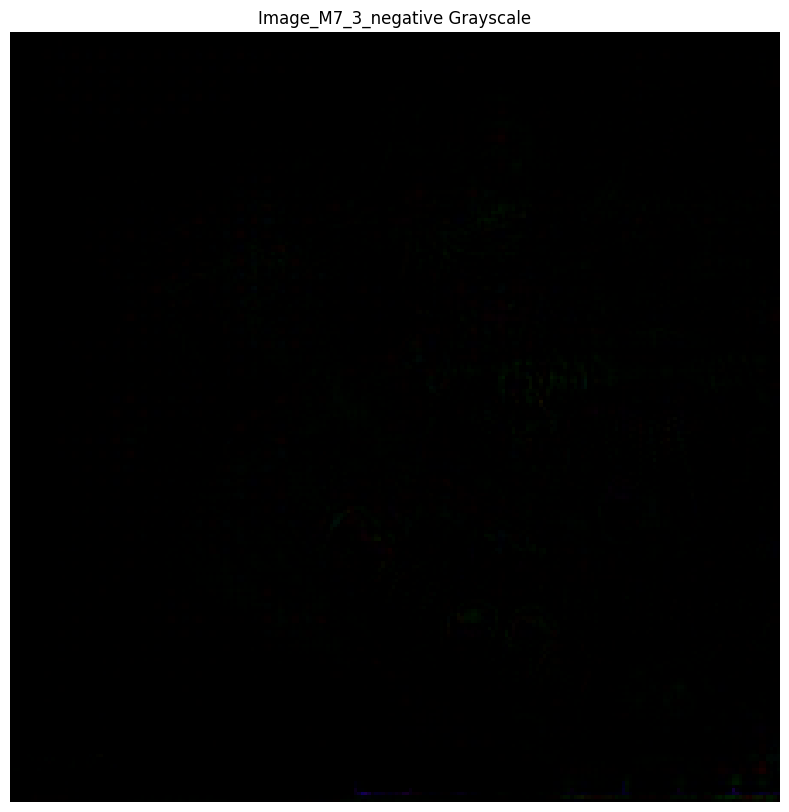

In [71]:
# # Plot the grayscale image
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 10))
plt.imshow(grayscale_image_M7_3_negative, cmap='gray', interpolation='nearest')
plt.title('Image_M7_3_negative Grayscale')
plt.axis('off')
plt.show()

percentile

In [72]:
import numpy as np

# Assuming the normalized array is already flattened and has a shape that can be reshaped into (224, 224)
# For demonstration, let's create a dummy array that represents a flattened version of the grayscale image
# This would normally be your flattened_array or a specific channel if it's a color image

# Find the 95th percentile
#pos
percentile_95_F7_1_pos = np.percentile(grayscale_image_F7_1_positive, 95)
percentile_95_F7_2_pos = np.percentile(grayscale_image_F7_2_positive, 95)
percentile_95_F7_3_pos = np.percentile(grayscale_image_F7_3_positive, 95)
percentile_95_M7_1_pos = np.percentile(grayscale_image_M7_1_positive, 95)
percentile_95_M7_2_pos = np.percentile(grayscale_image_M7_2_positive, 95)
percentile_95_M7_3_pos = np.percentile(grayscale_image_M7_3_positive, 95)

#neg
percentile_95_F7_1_neg = np.percentile(grayscale_image_F7_1_negative, 95)
percentile_95_F7_2_neg = np.percentile(grayscale_image_F7_2_negative, 95)
percentile_95_F7_3_neg = np.percentile(grayscale_image_F7_3_negative, 95)
percentile_95_M7_1_neg = np.percentile(grayscale_image_M7_1_negative, 95)
percentile_95_M7_2_neg = np.percentile(grayscale_image_M7_2_negative, 95)
percentile_95_M7_3_neg = np.percentile(grayscale_image_M7_3_negative, 95)

In [73]:
import numpy as np

# Assuming grayscale_image_negative is your array
#pos
grayscale_thresholded_F7_1_pos = grayscale_image_F7_1_positive
grayscale_thresholded_F7_2_pos = grayscale_image_F7_2_positive
grayscale_thresholded_F7_3_pos = grayscale_image_F7_3_positive
grayscale_thresholded_M7_1_pos = grayscale_image_M7_1_positive
grayscale_thresholded_M7_2_pos = grayscale_image_M7_2_positive
grayscale_thresholded_M7_3_pos = grayscale_image_M7_3_positive

#neg
grayscale_thresholded_F7_1_neg = grayscale_image_F7_1_negative
grayscale_thresholded_F7_2_neg = grayscale_image_F7_2_negative
grayscale_thresholded_F7_3_neg = grayscale_image_F7_3_negative
grayscale_thresholded_M7_1_neg = grayscale_image_M7_1_negative
grayscale_thresholded_M7_2_neg = grayscale_image_M7_2_negative
grayscale_thresholded_M7_3_neg = grayscale_image_M7_3_negative

# Replace values less than 0.0152 with 0
grayscale_thresholded_F7_1_pos[grayscale_thresholded_F7_1_pos < percentile_95_F7_1_pos] = 0
grayscale_thresholded_F7_2_pos[grayscale_thresholded_F7_2_pos < percentile_95_F7_2_pos] = 0
grayscale_thresholded_F7_3_pos[grayscale_thresholded_F7_3_pos < percentile_95_F7_3_pos] = 0
grayscale_thresholded_M7_1_pos[grayscale_thresholded_M7_1_pos < percentile_95_M7_1_pos] = 0
grayscale_thresholded_M7_2_pos[grayscale_thresholded_M7_2_pos < percentile_95_M7_2_pos] = 0
grayscale_thresholded_M7_3_pos[grayscale_thresholded_M7_3_pos < percentile_95_M7_3_pos] = 0

grayscale_thresholded_F7_1_neg[grayscale_thresholded_F7_1_neg < percentile_95_F7_1_neg] = 0
grayscale_thresholded_F7_2_neg[grayscale_thresholded_F7_2_neg < percentile_95_F7_2_neg] = 0
grayscale_thresholded_F7_3_neg[grayscale_thresholded_F7_3_neg < percentile_95_F7_3_neg] = 0
grayscale_thresholded_M7_1_neg[grayscale_thresholded_M7_1_neg < percentile_95_M7_1_neg] = 0
grayscale_thresholded_M7_2_neg[grayscale_thresholded_M7_2_neg < percentile_95_M7_2_neg] = 0
grayscale_thresholded_M7_3_neg[grayscale_thresholded_M7_3_neg < percentile_95_M7_3_neg] = 0

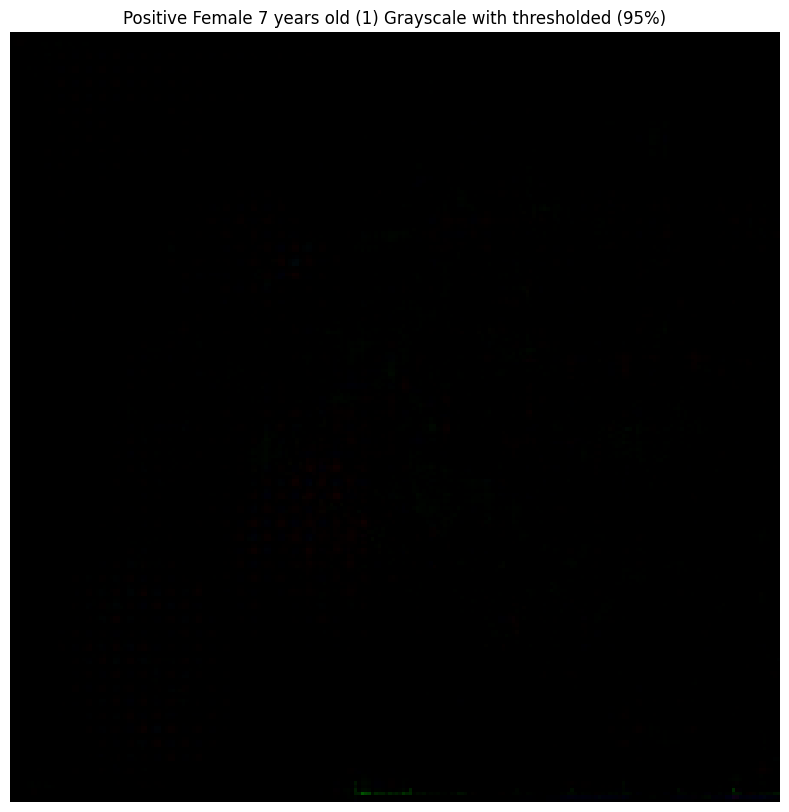

In [74]:
# # Plot the grayscale image
plt.figure(figsize=(15, 10))
plt.imshow(grayscale_thresholded_F7_1_pos, cmap='gray', interpolation='nearest')
plt.title('Positive Female 7 years old (1) Grayscale with thresholded (95%)')
plt.axis('off')
plt.show()

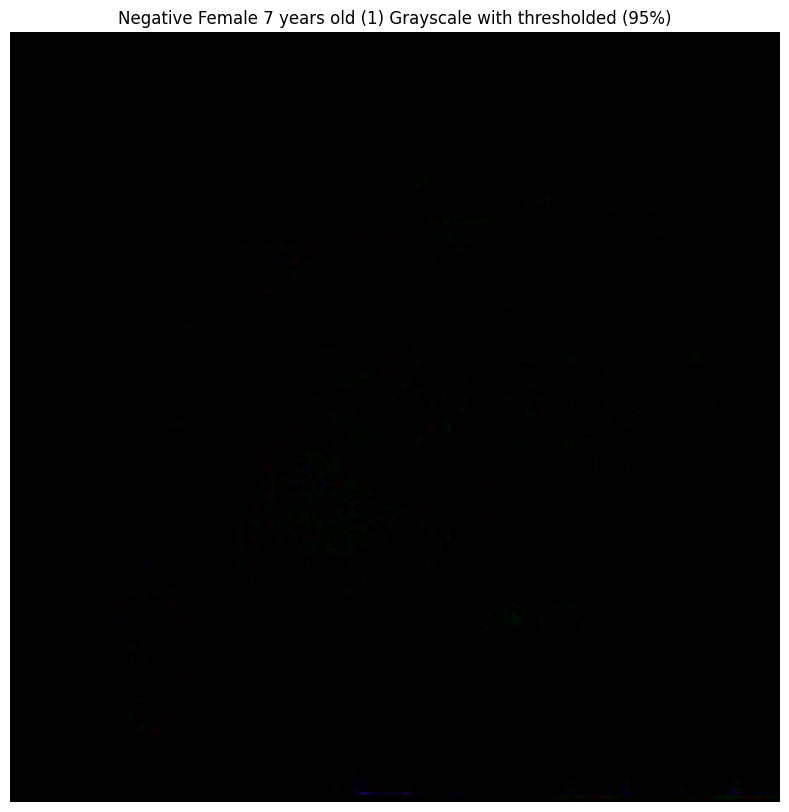

In [75]:
# # Plot the grayscale image
plt.figure(figsize=(15, 10))
plt.imshow(grayscale_thresholded_F7_1_neg, cmap='gray', interpolation='nearest')
plt.title('Negative Female 7 years old (1) Grayscale with thresholded (95%)')
plt.axis('off')
plt.show()

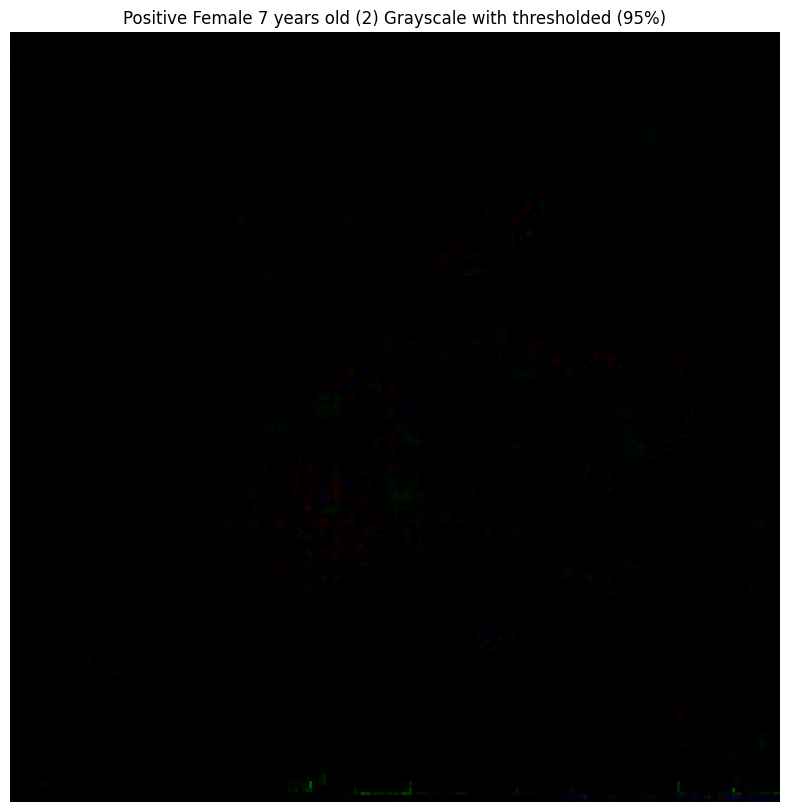

In [76]:
# # Plot the grayscale image
plt.figure(figsize=(15, 10))
plt.imshow(grayscale_thresholded_F7_2_pos, cmap='gray', interpolation='nearest')
plt.title('Positive Female 7 years old (2) Grayscale with thresholded (95%)')
plt.axis('off')
plt.show()

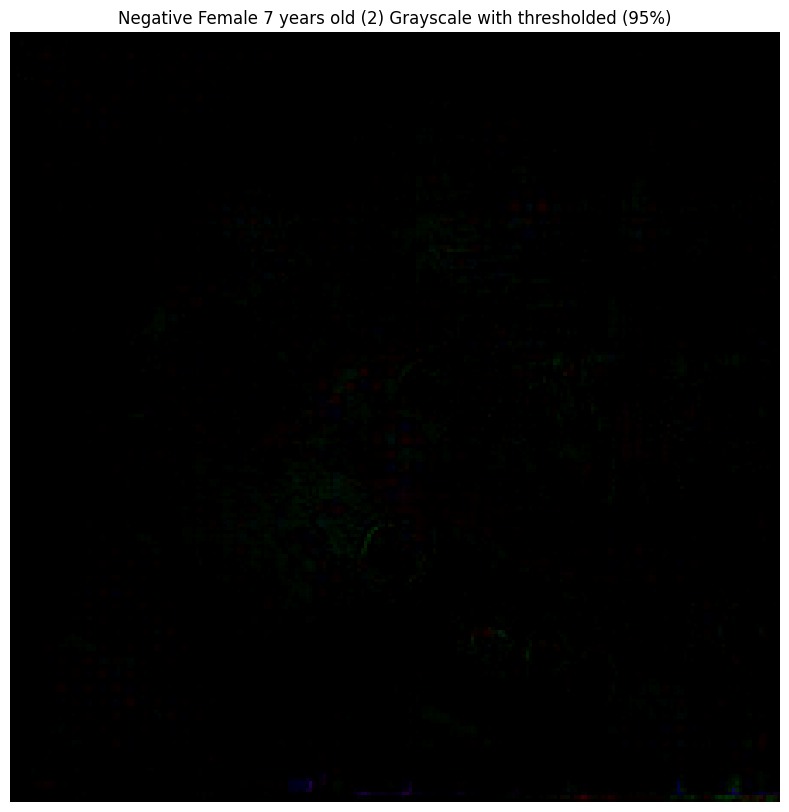

In [77]:
# # Plot the grayscale image
plt.figure(figsize=(15, 10))
plt.imshow(grayscale_thresholded_F7_2_neg, cmap='gray', interpolation='nearest')
plt.title('Negative Female 7 years old (2) Grayscale with thresholded (95%)')
plt.axis('off')
plt.show()

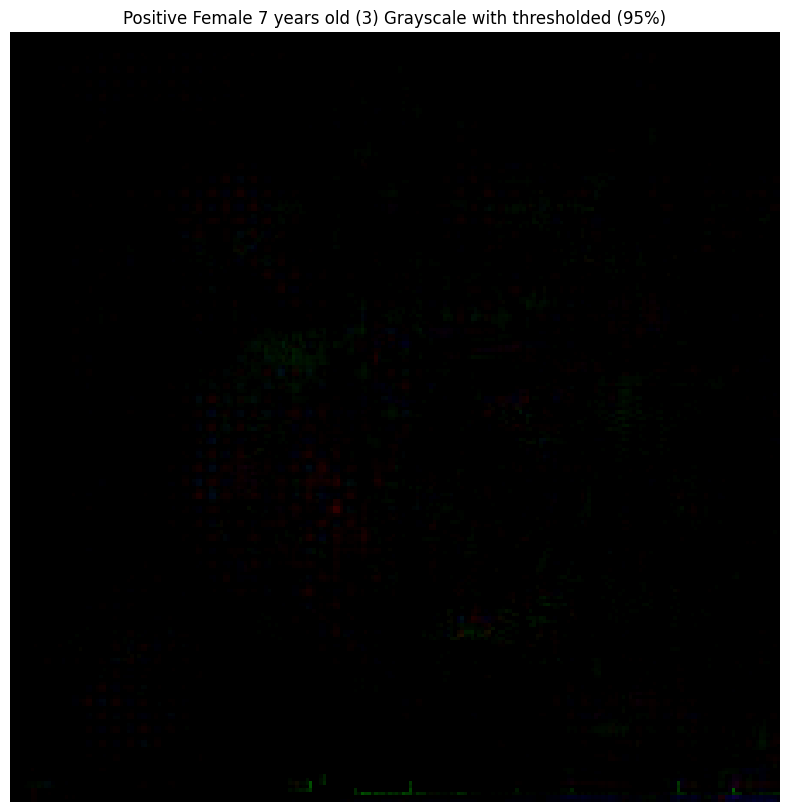

In [78]:
# # Plot the grayscale image
plt.figure(figsize=(15, 10))
plt.imshow(grayscale_thresholded_F7_3_pos, cmap='gray', interpolation='nearest')
plt.title('Positive Female 7 years old (3) Grayscale with thresholded (95%)')
plt.axis('off')
plt.show()

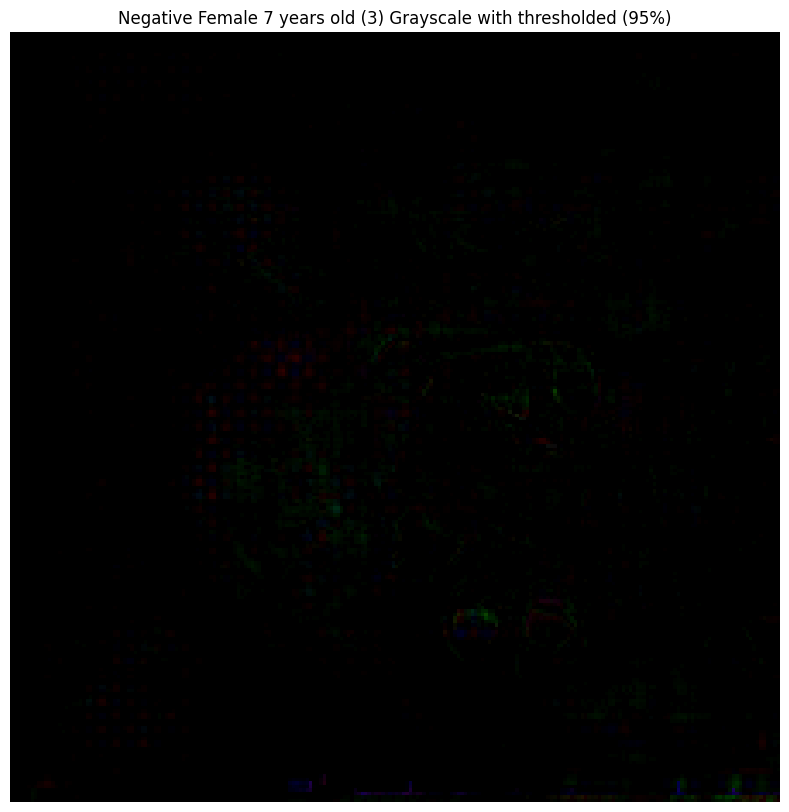

In [79]:
# # Plot the grayscale image
plt.figure(figsize=(15, 10))
plt.imshow(grayscale_thresholded_F7_3_neg, cmap='gray', interpolation='nearest')
plt.title('Negative Female 7 years old (3) Grayscale with thresholded (95%)')
plt.axis('off')
plt.show()

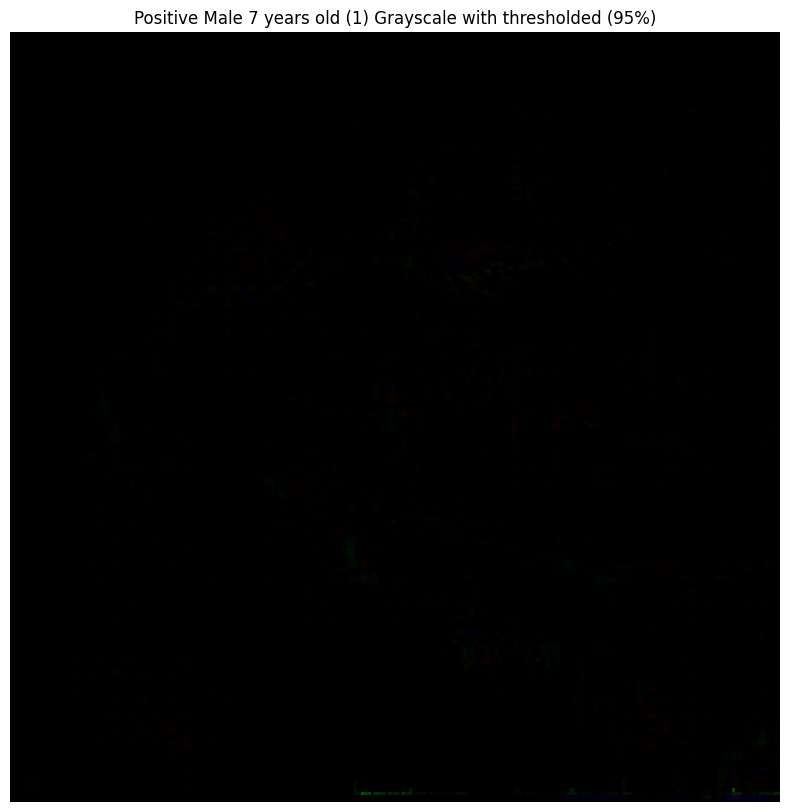

In [80]:
# # Plot the grayscale image
plt.figure(figsize=(15, 10))
plt.imshow(grayscale_thresholded_M7_1_pos, cmap='gray', interpolation='nearest')
plt.title('Positive Male 7 years old (1) Grayscale with thresholded (95%)')
plt.axis('off')
plt.show()

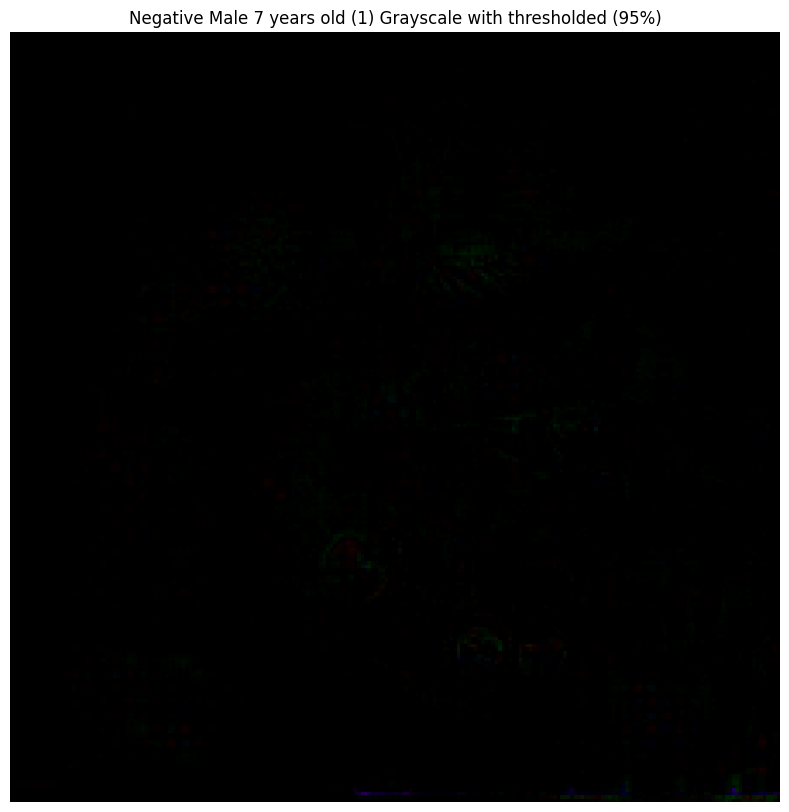

In [81]:
# # Plot the grayscale image
plt.figure(figsize=(15, 10))
plt.imshow(grayscale_thresholded_M7_1_neg, cmap='gray', interpolation='nearest')
plt.title('Negative Male 7 years old (1) Grayscale with thresholded (95%)')
plt.axis('off')
plt.show()

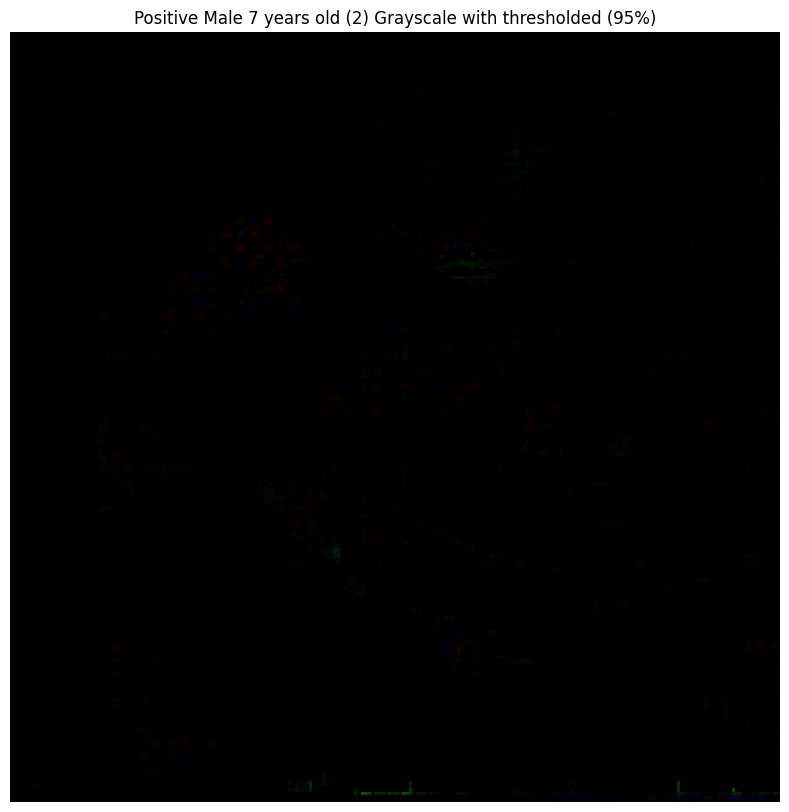

In [82]:
# # Plot the grayscale image
plt.figure(figsize=(15, 10))
plt.imshow(grayscale_thresholded_M7_2_pos, cmap='gray', interpolation='nearest')
plt.title('Positive Male 7 years old (2) Grayscale with thresholded (95%)')
plt.axis('off')
plt.show()

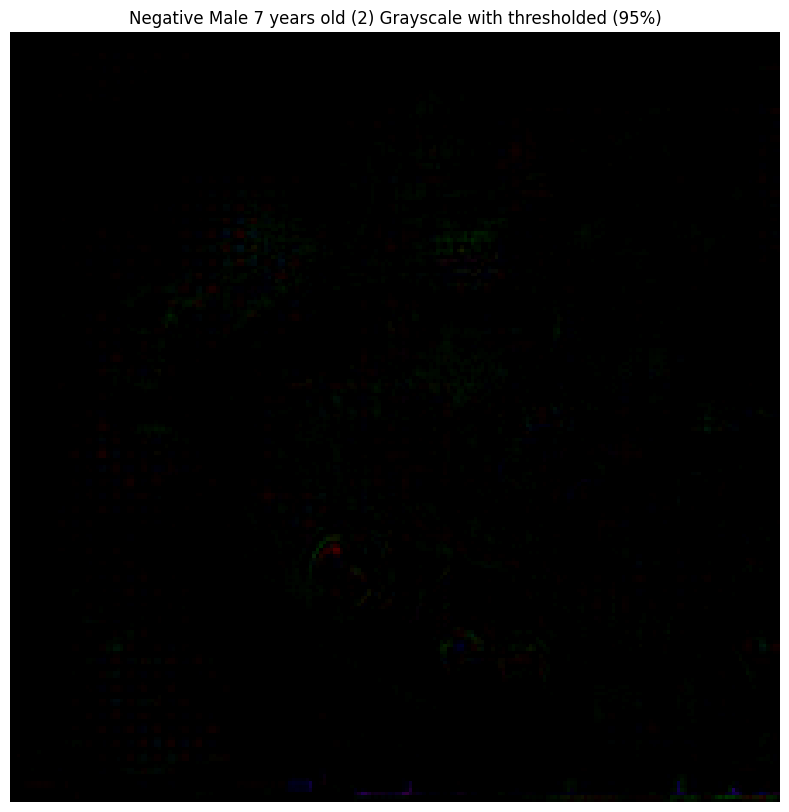

In [83]:
# # Plot the grayscale image
plt.figure(figsize=(15, 10))
plt.imshow(grayscale_thresholded_M7_2_neg, cmap='gray', interpolation='nearest')
plt.title('Negative Male 7 years old (2) Grayscale with thresholded (95%)')
plt.axis('off')
plt.show()

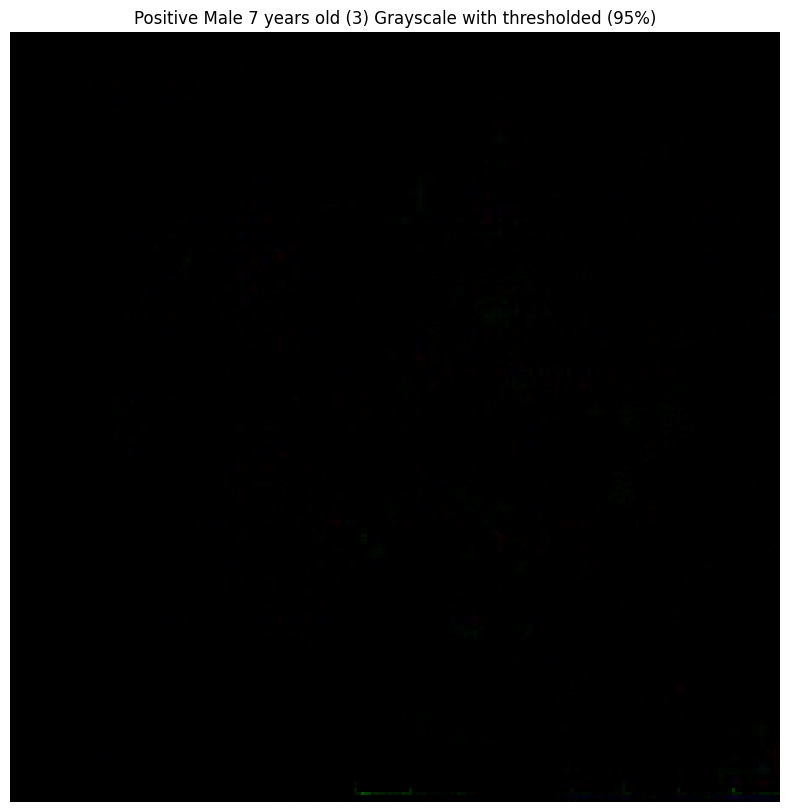

In [84]:
# # Plot the grayscale image
plt.figure(figsize=(15, 10))
plt.imshow(grayscale_thresholded_M7_3_pos, cmap='gray', interpolation='nearest')
plt.title('Positive Male 7 years old (3) Grayscale with thresholded (95%)')
plt.axis('off')
plt.show()

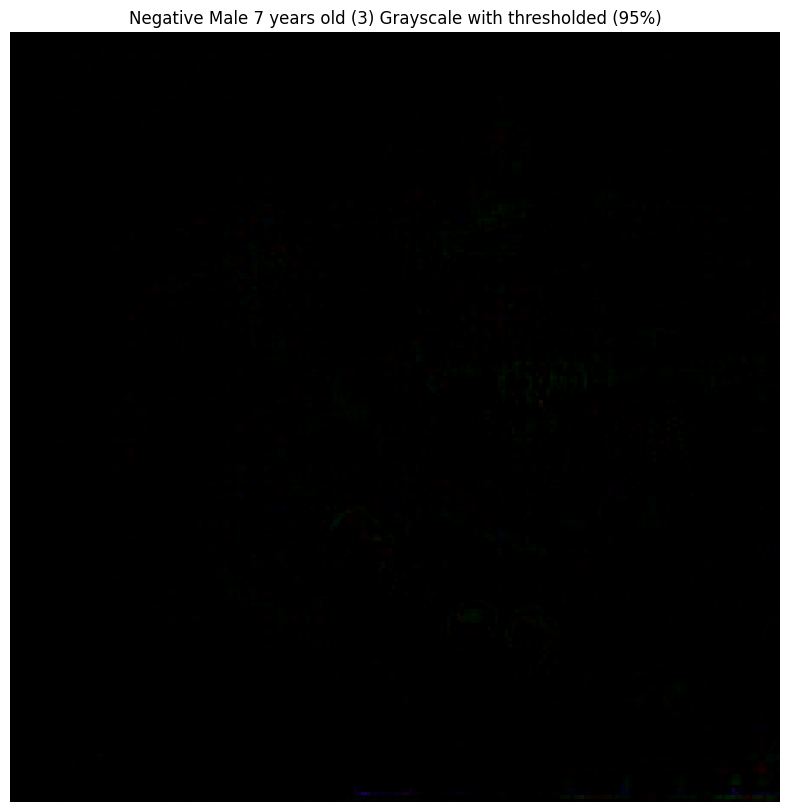

In [85]:
# # Plot the grayscale image
plt.figure(figsize=(15, 10))
plt.imshow(grayscale_thresholded_M7_3_neg, cmap='gray', interpolation='nearest')
plt.title('Negative Male 7 years old (3) Grayscale with thresholded (95%)')
plt.axis('off')
plt.show()

##yolo

In [86]:
# Replace with code to load your trained YOLO model
weights_path = '/content/gdrive/MyDrive/Tooth_Shap_GPT/papers/gpt/Yolo_v5/best.pt'

# Load YOLOv5 model from Google Drive
yolo_model = torch.hub.load('ultralytics/yolov5', 'custom', path=weights_path)

/usr/local/lib/python3.10/dist-packages/torch/hub.py:294: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip


requirements: Ultralytics requirements ['gitpython>=3.1.30', 'pillow>=10.3.0'] not found, attempting AutoUpdate...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 166.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 206.6 MB/s eta 0:00:00
  Attempting uninstall: pillow
    Found existing installation: Pillow 9.4.0
    Uninstalling Pillow-9.4.0:
      Successfully uninstalled Pillow-9.4.0

requirements: AutoUpdate success ✅ 9.6s, installed 2 packages: ['gitpython>=3.1.30', 'pillow>=10.3.0']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect



YOLOv5 🚀 2024-5-5 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7064065 parameters, 0 gradients, 15.9 GFLOPs
Adding AutoShape... 


In [87]:
from PIL import Image
image_path_F7_1 = '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/F/Both/V69.jpg'
image_path_F7_2 = '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/F/Both/FlipV69.jpg'
image_path_F7_3 = '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/F/Both/FlipV70.jpg'
image_path_M7_1 = '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/M/Both/VV85.jpg'
image_path_M7_2 = '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/M/Both/FlipVV85.jpg'
image_path_M7_3 = '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/M/Both/VV88.jpg'
ImageF7_1 = Image.open('/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/F/Both/V69.jpg')
ImageF7_2 = Image.open('/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/F/Both/FlipV69.jpg')
ImageF7_3 = Image.open('/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/F/Both/FlipV70.jpg')
ImageM7_1 = Image.open('/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/M/Both/VV85.jpg')
ImageM7_2 = Image.open('/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/M/Both/FlipVV85.jpg')
ImageM7_3 = Image.open('/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/M/Both/VV88.jpg')

In [88]:
#ภาพ1
resultsF7_1 = yolo_model(ImageF7_1)
df_F7_1 = resultsF7_1.pandas().xyxyn[0]
#ภาพ2
resultsF7_2 = yolo_model(ImageF7_2)
df_F7_2 = resultsF7_2.pandas().xyxyn[0]
#ภาพ3
resultsF7_3 = yolo_model(ImageF7_3)
df_F7_3 = resultsF7_3.pandas().xyxyn[0]
#ภาพ4
resultsM7_1 = yolo_model(ImageM7_1)
df_M7_1 = resultsM7_1.pandas().xyxyn[0]
#ภาพ5
resultsM7_2 = yolo_model(ImageM7_2)
df_M7_2 = resultsM7_2.pandas().xyxyn[0]
#ภาพ6
resultsM7_3 = yolo_model(ImageM7_3)
df_M7_3 = resultsM7_3.pandas().xyxyn[0]

WARNING ⚠️ NMS time limit 0.550s exceeded


# ทํา non maximum suppression

In [89]:
import pandas as pd

def compute_iou(boxA, boxB):
    # Determine the coordinates of the intersection rectangle
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    # Compute the area of intersection
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)

    # Compute the area of both the prediction and ground-truth rectangles
    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)

    # Compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the interesection area
    iou = interArea / float(boxAArea + boxBArea - interArea)

    return iou

def nms_per_class(df, iou_threshold=0.5):
    # Initialize an empty DataFrame to store NMS results
    df_nms = pd.DataFrame()

    # Get unique class IDs
    class_ids = df['class'].unique()

    for class_id in class_ids:
        # Filter detections by class
        df_class = df[df['class'] == class_id].copy()

        # Apply NMS
        df_class_sorted = df_class.sort_values(by='confidence', ascending=False).reset_index(drop=True)
        suppressed_indices = set()

        for i in range(len(df_class_sorted)):
            if i in suppressed_indices:
                continue

            for j in range(i+1, len(df_class_sorted)):
                if j in suppressed_indices:
                    continue

                boxA = df_class_sorted.iloc[i][['xmin', 'ymin', 'xmax', 'ymax']]
                boxB = df_class_sorted.iloc[j][['xmin', 'ymin', 'xmax', 'ymax']]

                if compute_iou(boxA, boxB) > iou_threshold:
                    suppressed_indices.add(j)

        # Filter out suppressed detections
        df_nms_class = df_class_sorted.drop(index=list(suppressed_indices)).reset_index(drop=True)

        # Append results for this class to the main DataFrame
        df_nms = pd.concat([df_nms, df_nms_class], ignore_index=True)

    return df_nms

In [90]:
df_F7_1_filtered = nms_per_class(df_F7_1,iou_threshold=0.5)
df_F7_2_filtered = nms_per_class(df_F7_2,iou_threshold=0.5)
df_F7_3_filtered = nms_per_class(df_F7_2,iou_threshold=0.5)
df_M7_1_filtered = nms_per_class(df_M7_1,iou_threshold=0.5)
df_M7_2_filtered = nms_per_class(df_M7_2,iou_threshold=0.5)
df_M7_3_filtered = nms_per_class(df_M7_3,iou_threshold=0.5)

In [91]:
# Specify your confidence threshold
#confidence_threshold = 0.7  # You can adjust this threshold as needed

# Filter predictions based on confidence threshold
#df_F7_1_filtered = df_F7_1[df_F7_1['confidence'] > confidence_threshold]
#df_F7_2_filtered = df_F7_2[df_F7_2['confidence'] > confidence_threshold]
#df_F7_3_filtered = df_F7_3[df_F7_3['confidence'] > confidence_threshold]
#df_M7_1_filtered = df_M7_1[df_M7_1['confidence'] > confidence_threshold]
#df_M7_2_filtered = df_M7_2[df_M7_2['confidence'] > confidence_threshold]
#df_M7_3_filtered = df_M7_3[df_M7_3['confidence'] > confidence_threshold]

In [92]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd
from PIL import Image
import numpy as np

def plot_bboxes_on_image(image_path, df, grayscale_image):
    # Load the original image
    img = Image.open(image_path)
    img_array = np.array(img)

    # Get the image dimensions
    image_width, image_height = img.size

    # Create figure and axes
    fig, ax = plt.subplots()

    # Display the original image
    ax.imshow(img)

    # Overlay the grayscale image with transparency
    ax.imshow(grayscale_image, cmap='Reds', alpha=0.5, extent=[0, image_width, image_height, 0])

    # Iterate over rows in the DataFrame
    for index, row in df.iterrows():
        xmin, ymin, xmax, ymax = row['xmin'], row['ymin'], row['xmax'], row['ymax']
        confidence, class_label = row['confidence'], row['name']

        # Convert coordinates to absolute values
        abs_xmin = xmin * image_width
        abs_ymin = ymin * image_height
        abs_width = (xmax - xmin) * image_width
        abs_height = (ymax - ymin) * image_height

        # Map bounding box to the grayscale image
        # Calculate the region of interest in the grayscale image
        roi_xmin = int(xmin * grayscale_image.shape[1])
        roi_ymin = int(ymin * grayscale_image.shape[0])
        roi_xmax = int(xmax * grayscale_image.shape[1])
        roi_ymax = int(ymax * grayscale_image.shape[0])

        # Extract the region of interest from the grayscale image
        roi = grayscale_image[roi_ymin:roi_ymax, roi_xmin:roi_xmax]

        # Calculate the percentage of nonzero pixels
        nonzero_percentage = np.count_nonzero(roi) / (roi.shape[0] * roi.shape[1])

        # If the percentage of nonzero pixels exceeds 10%, plot the bounding box
        if nonzero_percentage > 0.1:
            # Create a rectangle patch
            rect = patches.Rectangle(
                (abs_xmin, abs_ymin),
                abs_width,
                abs_height,
                linewidth=2,
                edgecolor='r',
                facecolor='none'  # Set facecolor to 'none' for an unfilled rectangle
            )

            # Add the rectangle to the axes
            ax.add_patch(rect)

            # Add confidence and class label as text
            text = f'{class_label}\nConfidence: {confidence:.2f}'
            plt.text(abs_xmin, abs_ymin - 10, text, color='r', fontsize=8, bbox=dict(facecolor='white', alpha=0.5))

    # Show the plot
    plt.show()

In [93]:
plot_bboxes_on_image(image_path_F7_3, df_F7_3_filtered, grayscale_thresholded_F7_3_neg)

In [94]:
df_F7_3_filtered

,xmin,ymin,xmax,ymax,confidence,class,name
0,0.444135,0.629892,0.545024,0.742825,0.948097,13,Lower Second Molar
1,0.734663,0.062007,0.903516,0.432658,0.944963,7,Nasal
2,0.491929,0.623606,0.657227,0.807584,0.941857,5,Lower First Molar
3,0.577202,0.751346,0.662775,0.857235,0.934295,6,Lower Second Premolar
4,0.701699,0.793109,0.792334,0.949812,0.924905,9,Lower Canine
5,0.539066,0.445863,0.631550,0.599740,0.923466,10,Upper First Molar
6,0.774502,0.453121,0.829649,0.670525,0.922155,17,Upper Central Incisor
7,0.648372,0.761773,0.734341,0.888781,0.920171,12,Lower First Premolar
8,0.498915,0.419650,0.589841,0.515799,0.918788,8,Upper Second Molar
9,0.609380,0.437152,0.679636,0.553289,0.913588,18,Upper Second Premolar


In [95]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd
from PIL import Image
import numpy as np

def plot_bboxes_on_image_neg(image_path, df, grayscale_image):
    # Load the original image
    img = Image.open(image_path)
    img_array = np.array(img)

    # Get the image dimensions
    image_width, image_height = img.size

    # Create figure and axes
    fig, ax = plt.subplots()

    # Display the original image
    ax.imshow(img)

    # Overlay the grayscale image with transparency
    ax.imshow(grayscale_image, cmap='Blues', alpha=0.5, extent=[0, image_width, image_height, 0])

    # Iterate over rows in the DataFrame
    for index, row in df.iterrows():
        xmin, ymin, xmax, ymax = row['xmin'], row['ymin'], row['xmax'], row['ymax']
        confidence, class_label = row['confidence'], row['class']

        # Convert coordinates to absolute values
        abs_xmin = xmin * image_width
        abs_ymin = ymin * image_height
        abs_width = (xmax - xmin) * image_width
        abs_height = (ymax - ymin) * image_height

        # Map bounding box to the grayscale image
        # Calculate the region of interest in the grayscale image
        roi_xmin = int(xmin * grayscale_image.shape[1])
        roi_ymin = int(ymin * grayscale_image.shape[0])
        roi_xmax = int(xmax * grayscale_image.shape[1])
        roi_ymax = int(ymax * grayscale_image.shape[0])

        # Extract the region of interest from the grayscale image
        roi = grayscale_image[roi_ymin:roi_ymax, roi_xmin:roi_xmax]

        # Calculate the percentage of nonzero pixels
        nonzero_percentage = np.count_nonzero(roi) / (roi.shape[0] * roi.shape[1])

        # If the percentage of nonzero pixels exceeds 10%, plot the bounding box
        if nonzero_percentage > 0.1:
            # Create a rectangle patch
            rect = patches.Rectangle(
                (abs_xmin, abs_ymin),
                abs_width,
                abs_height,
                linewidth=2,
                edgecolor='r',
                facecolor='none'  # Set facecolor to 'none' for an unfilled rectangle
            )

            # Add the rectangle to the axes
            ax.add_patch(rect)

            # Add confidence and class label as text
            #text = f'Class: {class_label}'
            #\nConfidence: {confidence:.2f}'
            #plt.text(abs_xmin, abs_ymin - 10, text, color='r', fontsize=8, bbox=dict(facecolor='white', alpha=0.5))

    # Show the plot
    plt.show()

In [96]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd
from PIL import Image
import numpy as np

def plot_bboxes_on_image_pos(image_path, df, grayscale_image):
    selected_bboxes = []

    # Load the original image
    img = Image.open(image_path)
    img_array = np.array(img)

    # Get the image dimensions
    image_width, image_height = img.size

    # Create figure and axes
    fig, ax = plt.subplots()

    # Display the original image
    ax.imshow(img)

    # Overlay the grayscale image with transparency
    ax.imshow(grayscale_image, cmap='Reds', alpha=0.5, extent=[0, image_width, image_height, 0])

    # Iterate over rows in the DataFrame
    for index, row in df.iterrows():
        xmin, ymin, xmax, ymax = row['xmin'], row['ymin'], row['xmax'], row['ymax']
        confidence, class_label,class_name = row['confidence'], row['class'],row['name']

        # Convert coordinates to absolute values
        abs_xmin = xmin * image_width
        abs_ymin = ymin * image_height
        abs_width = (xmax - xmin) * image_width
        abs_height = (ymax - ymin) * image_height

        # Map bounding box to the grayscale image
        # Calculate the region of interest in the grayscale image
        roi_xmin = int(xmin * grayscale_image.shape[1])
        roi_ymin = int(ymin * grayscale_image.shape[0])
        roi_xmax = int(xmax * grayscale_image.shape[1])
        roi_ymax = int(ymax * grayscale_image.shape[0])

        # Extract the region of interest from the grayscale image
        roi = grayscale_image[roi_ymin:roi_ymax, roi_xmin:roi_xmax]

        # Calculate the percentage of nonzero pixels
        nonzero_percentage = np.count_nonzero(roi) / (roi.shape[0] * roi.shape[1])

        # If the percentage of nonzero pixels exceeds 10%, collect the bounding box
        if nonzero_percentage > 0.1:
            # Add bounding box information to the selected_bboxes list
            selected_bboxes.append({'xmin': abs_xmin, 'ymin': abs_ymin,'xmax': abs_xmin + abs_width, 'ymax': abs_ymin + abs_height,
                                    'confidence': confidence, 'class': class_label,'name':class_name})

            # Create a rectangle patch
            rect = patches.Rectangle(
                (abs_xmin, abs_ymin),
                abs_width,
                abs_height,
                linewidth=2,
                edgecolor='r',
                facecolor='none'  # Set facecolor to 'none' for an unfilled rectangle
            )

            # Add the rectangle to the axes
            ax.add_patch(rect)
            # Add confidence and class label as text
            text = f'Class: {class_label}'
            #\nConfidence: {confidence:.2f}'
            plt.text(abs_xmin, abs_ymin - 10, text, color='black', fontsize=8, bbox=dict(facecolor='white', alpha=0.5))


    # Show the plot
    plt.show()

    return selected_bboxes

In [97]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd
from PIL import Image
import numpy as np

def plot_bboxes_on_image_neg(image_path, df, grayscale_image):
    selected_bboxes = []

    # Load the original image
    img = Image.open(image_path)
    img_array = np.array(img)

    # Get the image dimensions
    image_width, image_height = img.size

    # Create figure and axes
    fig, ax = plt.subplots()

    # Display the original image
    ax.imshow(img)

    # Overlay the grayscale image with transparency
    ax.imshow(grayscale_image, cmap='Blues', alpha=0.5, extent=[0, image_width, image_height, 0])

    # Iterate over rows in the DataFrame
    for index, row in df.iterrows():
        xmin, ymin, xmax, ymax = row['xmin'], row['ymin'], row['xmax'], row['ymax']
        confidence, class_label,class_name = row['confidence'], row['class'],row['name']

        # Convert coordinates to absolute values
        abs_xmin = xmin * image_width
        abs_ymin = ymin * image_height
        abs_width = (xmax - xmin) * image_width
        abs_height = (ymax - ymin) * image_height

        # Map bounding box to the grayscale image
        # Calculate the region of interest in the grayscale image
        roi_xmin = int(xmin * grayscale_image.shape[1])
        roi_ymin = int(ymin * grayscale_image.shape[0])
        roi_xmax = int(xmax * grayscale_image.shape[1])
        roi_ymax = int(ymax * grayscale_image.shape[0])

        # Extract the region of interest from the grayscale image
        roi = grayscale_image[roi_ymin:roi_ymax, roi_xmin:roi_xmax]

        # Calculate the percentage of nonzero pixels
        nonzero_percentage = np.count_nonzero(roi) / (roi.shape[0] * roi.shape[1])

        # If the percentage of nonzero pixels exceeds 10%, collect the bounding box#เลือกกล่องที่มีค่า shap ในกล่องมากกว่า 10% ของทั้งหมด
        if nonzero_percentage > 0.1:
            # Add bounding box information to the selected_bboxes list
            selected_bboxes.append({'xmin': abs_xmin, 'ymin': abs_ymin,'xmax': abs_xmin + abs_width, 'ymax': abs_ymin + abs_height,
                                    'confidence': confidence, 'class': class_label,'name':class_name})

            # Create a rectangle patch
            rect = patches.Rectangle(
                (abs_xmin, abs_ymin),
                abs_width,
                abs_height,
                linewidth=2,
                edgecolor='b',
                facecolor='none'  # Set facecolor to 'none' for an unfilled rectangle
            )

            # Add the rectangle to the axes
            ax.add_patch(rect)
            # Add confidence and class label as text
            text = f'Class: {class_label}'
            #\nConfidence: {confidence:.2f}'
            plt.text(abs_xmin, abs_ymin - 10, text, color='black', fontsize=8, bbox=dict(facecolor='white', alpha=0.5))


    # Show the plot
    plt.show()

    return selected_bboxes

In [98]:
selected_bboxes_F7_1_pos = plot_bboxes_on_image_pos(image_path_F7_1, df_F7_1_filtered, grayscale_thresholded_F7_1_pos)
%matplotlib inline

In [99]:
pd.DataFrame(selected_bboxes_F7_1_pos)

,xmin,ymin,xmax,ymax,confidence,class,name
0,290.441006,318.575717,347.501520,375.691668,0.949560,13,Lower Second Molar
1,317.049788,316.729318,411.156767,409.009905,0.944441,5,Lower First Molar
2,315.235370,207.320941,369.728971,261.244226,0.928218,8,Upper Second Molar
3,387.852442,210.917224,433.583892,276.388144,0.923084,18,Upper Second Premolar
4,369.278275,377.189239,415.869944,432.946804,0.921959,6,Lower Second Premolar
5,409.985911,379.973719,460.815798,450.142040,0.918067,12,Lower First Premolar
6,342.657471,223.107511,398.417739,304.233721,0.916236,10,Upper First Molar
7,442.243241,190.380302,481.506713,277.754403,0.903446,19,Upper Canine
8,203.511023,295.167587,268.920413,389.243537,0.901955,3,Mandibular angle
9,484.279613,233.741133,517.716436,341.186309,0.900649,17,Upper Central Incisor


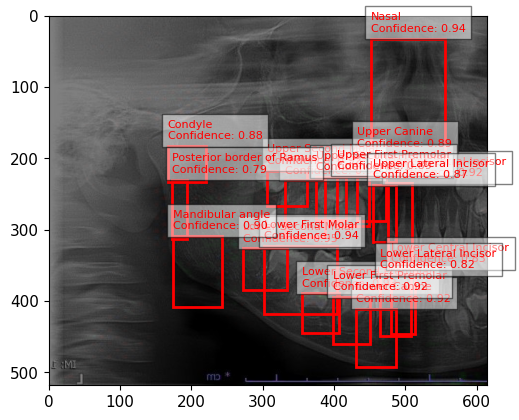

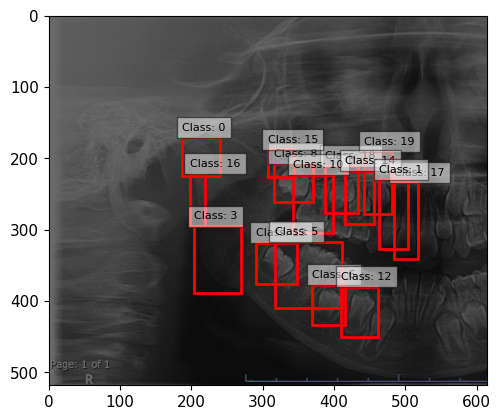

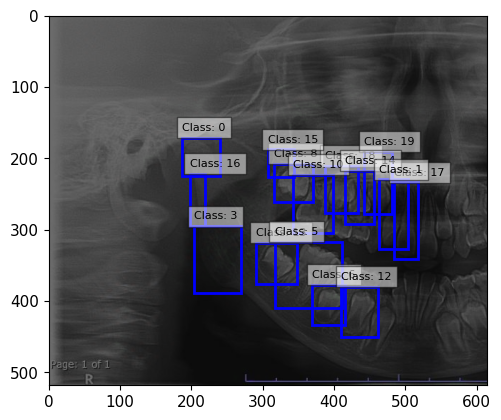

In [100]:
selected_bboxes_F7_1_neg = plot_bboxes_on_image_neg(image_path_F7_1, df_F7_1_filtered, grayscale_thresholded_F7_1_neg)

In [101]:
pd.DataFrame(selected_bboxes_F7_1_neg)

,xmin,ymin,xmax,ymax,confidence,class,name
0,290.441006,318.575717,347.501520,375.691668,0.949560,13,Lower Second Molar
1,317.049788,316.729318,411.156767,409.009905,0.944441,5,Lower First Molar
2,315.235370,207.320941,369.728971,261.244226,0.928218,8,Upper Second Molar
3,387.852442,210.917224,433.583892,276.388144,0.923084,18,Upper Second Premolar
4,369.278275,377.189239,415.869944,432.946804,0.921959,6,Lower Second Premolar
5,409.985911,379.973719,460.815798,450.142040,0.918067,12,Lower First Premolar
6,342.657471,223.107511,398.417739,304.233721,0.916236,10,Upper First Molar
7,442.243241,190.380302,481.506713,277.754403,0.903446,19,Upper Canine
8,203.511023,295.167587,268.920413,389.243537,0.901955,3,Mandibular angle
9,484.279613,233.741133,517.716436,341.186309,0.900649,17,Upper Central Incisor


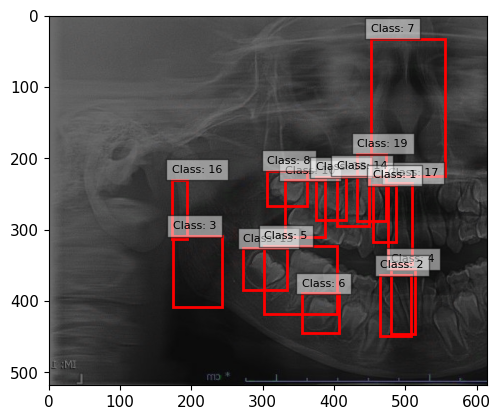

In [102]:
selected_bboxes_F7_2_pos = plot_bboxes_on_image_pos(image_path_F7_2, df_F7_2_filtered, grayscale_thresholded_F7_2_pos)

In [103]:
pd.DataFrame(selected_bboxes_F7_2_pos)

,xmin,ymin,xmax,ymax,confidence,class,name
0,272.698786,326.283959,334.644869,384.783243,0.948097,13,Lower Second Molar
1,451.083234,32.119403,554.758857,224.116945,0.944963,7,Nasal
2,302.044275,323.028138,403.537073,418.328413,0.941857,5,Lower First Molar
3,354.402115,389.197378,406.943801,444.047954,0.934295,6,Lower Second Premolar
4,330.986571,230.956930,387.771599,310.665211,0.923466,10,Upper First Molar
5,475.544215,234.716789,509.404212,347.332050,0.922155,17,Upper Central Incisor
6,306.334113,217.378926,362.162306,267.184029,0.918788,8,Upper Second Molar
7,374.159105,226.444673,417.296798,286.603577,0.913588,18,Upper Second Premolar
8,173.991753,308.951082,242.764668,407.734389,0.896737,3,Mandibular angle
9,432.724406,193.263198,472.651386,287.645275,0.890207,19,Upper Canine


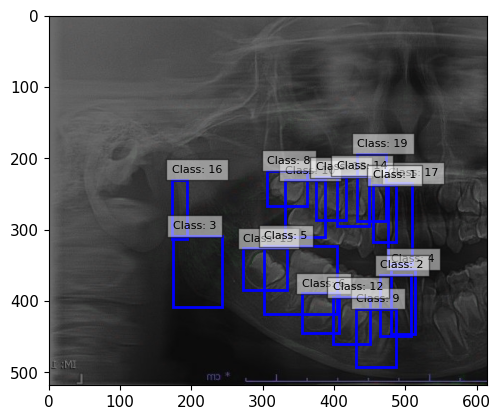

In [104]:
selected_bboxes_F7_2_neg = plot_bboxes_on_image_neg(image_path_F7_2, df_F7_2_filtered, grayscale_thresholded_F7_2_neg)

In [105]:
pd.DataFrame(selected_bboxes_F7_2_neg)

,xmin,ymin,xmax,ymax,confidence,class,name
0,272.698786,326.283959,334.644869,384.783243,0.948097,13,Lower Second Molar
1,302.044275,323.028138,403.537073,418.328413,0.941857,5,Lower First Molar
2,354.402115,389.197378,406.943801,444.047954,0.934295,6,Lower Second Premolar
3,430.843051,410.830307,486.493162,492.002706,0.924905,9,Lower Canine
4,330.986571,230.956930,387.771599,310.665211,0.923466,10,Upper First Molar
5,475.544215,234.716789,509.404212,347.332050,0.922155,17,Upper Central Incisor
6,398.100624,394.598625,450.885499,460.388626,0.920171,12,Lower First Premolar
7,306.334113,217.378926,362.162306,267.184029,0.918788,8,Upper Second Molar
8,374.159105,226.444673,417.296798,286.603577,0.913588,18,Upper Second Premolar
9,173.991753,308.951082,242.764668,407.734389,0.896737,3,Mandibular angle


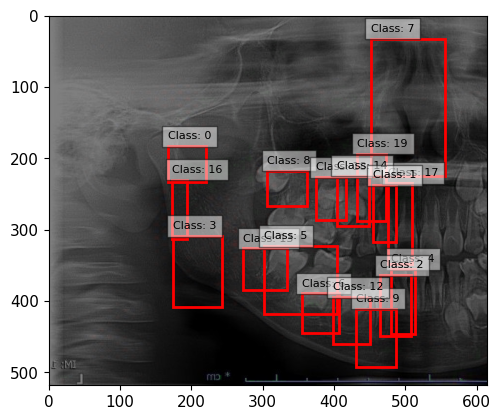

In [106]:
selected_bboxes_F7_3_pos = plot_bboxes_on_image_pos(image_path_F7_3, df_F7_3_filtered, grayscale_thresholded_F7_3_pos)

In [107]:
pd.DataFrame(selected_bboxes_F7_3_pos)

,xmin,ymin,xmax,ymax,confidence,class,name
0,272.698786,326.283959,334.644869,384.783243,0.948097,13,Lower Second Molar
1,451.083234,32.119403,554.758857,224.116945,0.944963,7,Nasal
2,302.044275,323.028138,403.537073,418.328413,0.941857,5,Lower First Molar
3,354.402115,389.197378,406.943801,444.047954,0.934295,6,Lower Second Premolar
4,430.843051,410.830307,486.493162,492.002706,0.924905,9,Lower Canine
5,475.544215,234.716789,509.404212,347.332050,0.922155,17,Upper Central Incisor
6,398.100624,394.598625,450.885499,460.388626,0.920171,12,Lower First Premolar
7,306.334113,217.378926,362.162306,267.184029,0.918788,8,Upper Second Molar
8,374.159105,226.444673,417.296798,286.603577,0.913588,18,Upper Second Premolar
9,173.991753,308.951082,242.764668,407.734389,0.896737,3,Mandibular angle


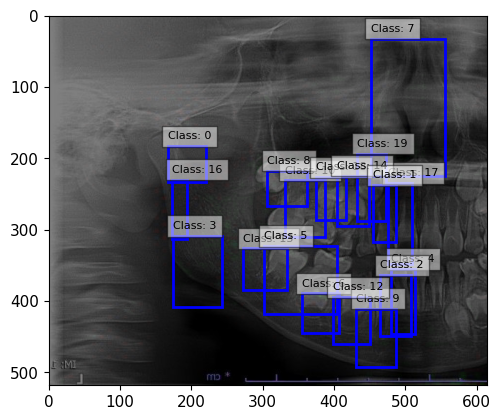

In [108]:
selected_bboxes_F7_3_neg = plot_bboxes_on_image_neg(image_path_F7_3, df_F7_3_filtered, grayscale_thresholded_F7_3_neg)

In [109]:
pd.DataFrame(selected_bboxes_F7_3_neg)

,xmin,ymin,xmax,ymax,confidence,class,name
0,272.698786,326.283959,334.644869,384.783243,0.948097,13,Lower Second Molar
1,451.083234,32.119403,554.758857,224.116945,0.944963,7,Nasal
2,302.044275,323.028138,403.537073,418.328413,0.941857,5,Lower First Molar
3,354.402115,389.197378,406.943801,444.047954,0.934295,6,Lower Second Premolar
4,430.843051,410.830307,486.493162,492.002706,0.924905,9,Lower Canine
5,330.986571,230.956930,387.771599,310.665211,0.923466,10,Upper First Molar
6,475.544215,234.716789,509.404212,347.332050,0.922155,17,Upper Central Incisor
7,398.100624,394.598625,450.885499,460.388626,0.920171,12,Lower First Premolar
8,306.334113,217.378926,362.162306,267.184029,0.918788,8,Upper Second Molar
9,374.159105,226.444673,417.296798,286.603577,0.913588,18,Upper Second Premolar


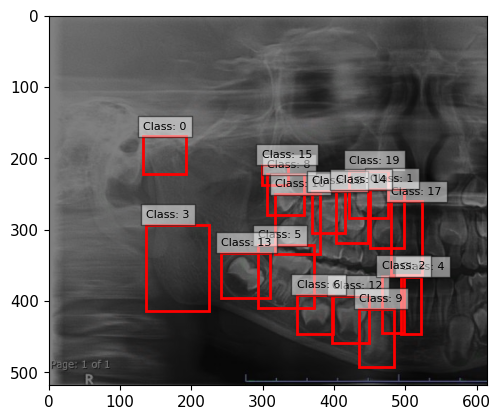

In [110]:
selected_bboxes_M7_1_pos = plot_bboxes_on_image_pos(image_path_M7_1, df_M7_1_filtered, grayscale_thresholded_M7_1_pos)

In [111]:
pd.DataFrame(selected_bboxes_M7_1_pos)

,xmin,ymin,xmax,ymax,confidence,class,name
0,293.854981,321.774820,372.020032,410.329357,0.934191,5,Lower First Molar
1,397.653076,392.299256,449.521447,458.949594,0.930489,12,Lower First Premolar
2,420.957694,217.097452,475.436619,284.053223,0.928607,19,Upper Canine
3,242.071352,332.193072,309.532200,395.292082,0.927893,13,Lower Second Molar
4,317.475634,250.097181,380.688933,333.645010,0.926933,10,Upper First Molar
5,136.735805,292.989001,224.332737,413.203777,0.919249,3,Mandibular angle
6,347.964585,391.438146,398.115629,446.633227,0.918505,6,Lower Second Premolar
7,435.007672,410.775782,483.837079,492.884286,0.917339,9,Lower Canine
8,480.143575,260.182551,522.690808,363.207217,0.906484,17,Upper Central Incisor
9,306.333747,222.574219,358.414967,278.899441,0.903327,8,Upper Second Molar


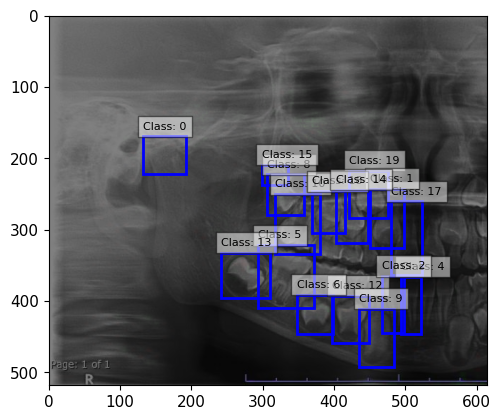

In [112]:
selected_bboxes_M7_1_neg = plot_bboxes_on_image_neg(image_path_M7_1, df_M7_1_filtered, grayscale_thresholded_M7_1_neg)

In [113]:
pd.DataFrame(selected_bboxes_M7_1_neg)

,xmin,ymin,xmax,ymax,confidence,class,name
0,293.854981,321.774820,372.020032,410.329357,0.934191,5,Lower First Molar
1,397.653076,392.299256,449.521447,458.949594,0.930489,12,Lower First Premolar
2,420.957694,217.097452,475.436619,284.053223,0.928607,19,Upper Canine
3,242.071352,332.193072,309.532200,395.292082,0.927893,13,Lower Second Molar
4,317.475634,250.097181,380.688933,333.645010,0.926933,10,Upper First Molar
5,347.964585,391.438146,398.115629,446.633227,0.918505,6,Lower Second Premolar
6,435.007672,410.775782,483.837079,492.884286,0.917339,9,Lower Canine
7,480.143575,260.182551,522.690808,363.207217,0.906484,17,Upper Central Incisor
8,306.333747,222.574219,358.414967,278.899441,0.903327,8,Upper Second Molar
9,450.625878,242.445625,497.538212,326.040323,0.894297,1,Upper Lateral Incisor


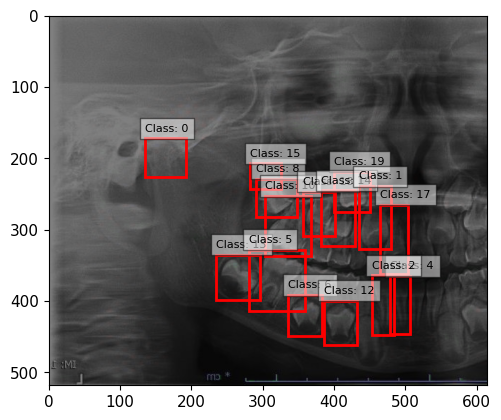

In [114]:
selected_bboxes_M7_2_pos = plot_bboxes_on_image_pos(image_path_M7_2, df_M7_2_filtered, grayscale_thresholded_M7_2_pos)

In [115]:
pd.DataFrame(selected_bboxes_M7_2_pos)

,xmin,ymin,xmax,ymax,confidence,class,name
0,234.558009,335.396653,296.791197,398.208616,0.947646,13,Lower Second Molar
1,280.022208,327.792275,359.737372,414.164058,0.943842,5,Lower First Molar
2,290.618320,228.791035,347.855781,282.153811,0.943234,8,Upper Second Molar
3,303.316706,252.989122,368.174905,336.172917,0.928148,10,Upper First Molar
4,335.715302,391.619199,383.579896,449.522035,0.910473,6,Lower Second Premolar
5,356.142131,246.532808,401.047289,308.169136,0.910411,18,Upper Second Premolar
6,464.666780,264.813925,503.149266,361.471659,0.907886,17,Upper Central Incisor
7,478.990835,365.045001,505.906869,445.553799,0.890104,4,Lower Central Incisor
8,399.958045,218.678756,450.471621,274.975881,0.879686,19,Upper Canine
9,385.520612,399.636131,432.402021,462.194269,0.879562,12,Lower First Premolar


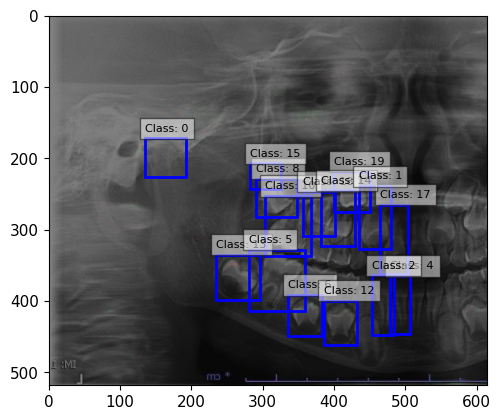

In [116]:
selected_bboxes_M7_2_neg = plot_bboxes_on_image_neg(image_path_M7_2, df_M7_2_filtered, grayscale_thresholded_M7_2_neg)

In [117]:
pd.DataFrame(selected_bboxes_M7_2_neg)

,xmin,ymin,xmax,ymax,confidence,class,name
0,234.558009,335.396653,296.791197,398.208616,0.947646,13,Lower Second Molar
1,280.022208,327.792275,359.737372,414.164058,0.943842,5,Lower First Molar
2,290.618320,228.791035,347.855781,282.153811,0.943234,8,Upper Second Molar
3,303.316706,252.989122,368.174905,336.172917,0.928148,10,Upper First Molar
4,335.715302,391.619199,383.579896,449.522035,0.910473,6,Lower Second Premolar
5,356.142131,246.532808,401.047289,308.169136,0.910411,18,Upper Second Premolar
6,464.666780,264.813925,503.149266,361.471659,0.907886,17,Upper Central Incisor
7,478.990835,365.045001,505.906869,445.553799,0.890104,4,Lower Central Incisor
8,399.958045,218.678756,450.471621,274.975881,0.879686,19,Upper Canine
9,385.520612,399.636131,432.402021,462.194269,0.879562,12,Lower First Premolar


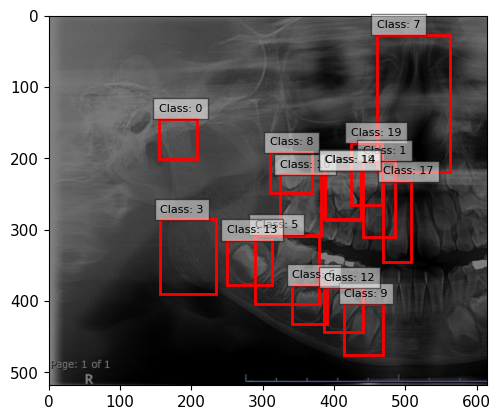

In [118]:
selected_bboxes_M7_3_pos = plot_bboxes_on_image_pos(image_path_M7_3, df_M7_3_filtered, grayscale_thresholded_M7_3_pos)

In [119]:
pd.DataFrame(selected_bboxes_M7_3_pos)

,xmin,ymin,xmax,ymax,confidence,class,name
0,289.112160,307.258626,379.494655,404.729830,0.946968,5,Lower First Molar
1,249.648611,314.625512,312.527686,377.532139,0.939947,13,Lower Second Molar
2,459.740314,26.689705,562.473521,219.244436,0.937075,7,Nasal
3,323.644357,222.517455,381.414144,308.828939,0.934619,10,Upper First Molar
4,341.190068,377.717946,389.751144,431.992081,0.923484,6,Lower Second Premolar
5,414.302118,403.784709,468.720292,476.096973,0.921907,9,Lower Canine
6,309.884339,191.410052,368.611620,248.547276,0.919569,8,Upper Second Molar
7,468.938594,232.054034,507.455335,344.890470,0.897466,17,Upper Central Incisor
8,156.436801,285.618935,235.089584,389.498103,0.895283,3,Mandibular angle
9,154.430869,144.306992,208.507298,200.841254,0.867622,0,Condyle


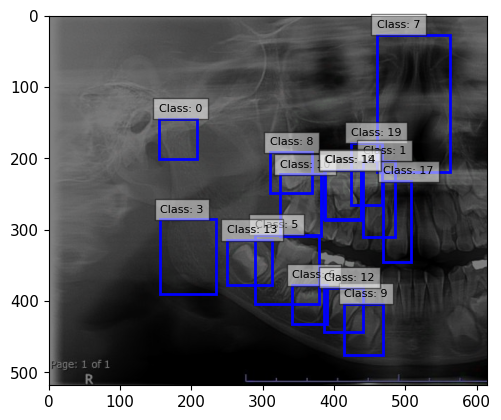

In [120]:
selected_bboxes_M7_3_neg = plot_bboxes_on_image_neg(image_path_M7_3, df_M7_3_filtered, grayscale_thresholded_M7_3_neg)

In [121]:
pd.DataFrame(selected_bboxes_M7_3_neg)

,xmin,ymin,xmax,ymax,confidence,class,name
0,289.112160,307.258626,379.494655,404.729830,0.946968,5,Lower First Molar
1,249.648611,314.625512,312.527686,377.532139,0.939947,13,Lower Second Molar
2,459.740314,26.689705,562.473521,219.244436,0.937075,7,Nasal
3,323.644357,222.517455,381.414144,308.828939,0.934619,10,Upper First Molar
4,341.190068,377.717946,389.751144,431.992081,0.923484,6,Lower Second Premolar
5,414.302118,403.784709,468.720292,476.096973,0.921907,9,Lower Canine
6,309.884339,191.410052,368.611620,248.547276,0.919569,8,Upper Second Molar
7,468.938594,232.054034,507.455335,344.890470,0.897466,17,Upper Central Incisor
8,156.436801,285.618935,235.089584,389.498103,0.895283,3,Mandibular angle
9,154.430869,144.306992,208.507298,200.841254,0.867622,0,Condyle


# paper 7 9 11 13 15

In [122]:
#เลือกรูป
sdf_test.reset_index()['Path_Name'][15]

'/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/F/Both/V67.jpg'

In [123]:
pd.set_option('display.max_colwidth', None)

In [124]:
#sdf_test[sdf_test['Age(year)']==15]
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/F/Both/FlipV79.jpg #10
# /content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/M/Both/FlipVV88.jpg #21
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/9Y/F/Both/W91.jpg #71
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/9Y/M/Both/FlipWW75.jpg #84
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/11Y/F/Both/FlipD89.jpg #122
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/11Y/M/Both/FlipDD100.jpg #128
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/13Y/F/Both/G94.jpg #159
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/13Y/M/Both/FlipGG129.jpg #175
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/15Y/F/Both/FlipB157.jpg #200
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/15Y/M/Lt/FlipB317.jpg #207

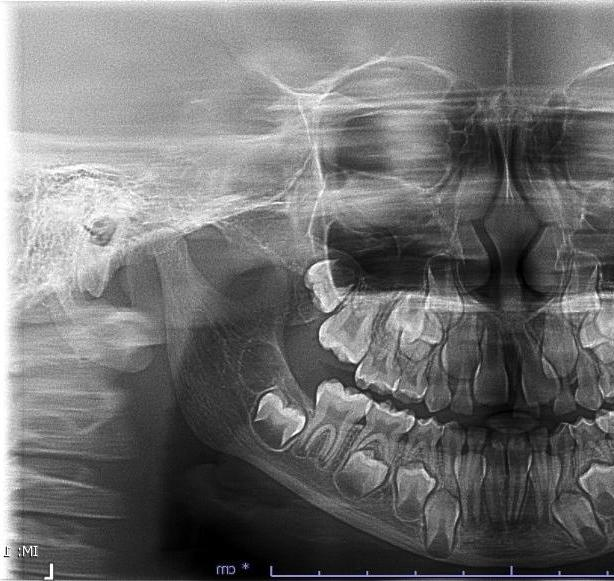

In [125]:
from PIL import Image
Image1 = Image.open('/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/F/Both/FlipV79.jpg')
Image1

In [126]:
shap_values_F7_1 = explainer_layer1.shap_values(background_test_array[[10]])
shap_values_M7_1 = explainer_layer1.shap_values(background_test_array[[21]])
shap_values_F9_1 = explainer_layer1.shap_values(background_test_array[[71]])
shap_values_M9_1 = explainer_layer1.shap_values(background_test_array[[84]])
shap_values_F11_1 = explainer_layer1.shap_values(background_test_array[[122]])
shap_values_M11_1 = explainer_layer1.shap_values(background_test_array[[128]])
shap_values_F13_1 = explainer_layer1.shap_values(background_test_array[[159]])
shap_values_M13_1 = explainer_layer1.shap_values(background_test_array[[175]])
shap_values_F15_1 = explainer_layer1.shap_values(background_test_array[[200]])
shap_values_M15_1 = explainer_layer1.shap_values(background_test_array[[207]])
%matplotlib inline
#shap.image_plot(shap_values_F7_1, background_test_array[[10]])

In [127]:
shap_values_F7_1_array = np.array(shap_values_F7_1)
shap_values_M7_1_array = np.array(shap_values_M7_1)
shap_values_F9_1_array = np.array(shap_values_F9_1)
shap_values_M9_1_array = np.array(shap_values_M9_1)
shap_values_F11_1_array = np.array(shap_values_F11_1)
shap_values_M11_1_array = np.array(shap_values_M11_1)
shap_values_F13_1_array = np.array(shap_values_F13_1)
shap_values_M13_1_array = np.array(shap_values_M13_1)
shap_values_F15_1_array = np.array(shap_values_F15_1)
shap_values_M15_1_array = np.array(shap_values_M15_1)

In [307]:
positive = np.where(shap_values >= 0, shap_values, 0)
negative = np.where(shap_values < 0, shap_values, 0)

TypeError: '>=' not supported between instances of 'dict' and 'int'

In [129]:
shap_values = {
    'F7_1': {'data': np.array(shap_values_F7_1)},
    'M7_1': {'data': np.array(shap_values_M7_1)},
    'F9_1': {'data': np.array(shap_values_F7_3)},
    'M9_1': {'data': np.array(shap_values_M7_1)},
    'F11_1': {'data': np.array(shap_values_M7_2)},
    'M11_1': {'data': np.array(shap_values_M7_3)},
    'F13_1': {'data': np.array(shap_values_M7_3)},
    'M13_1': {'data': np.array(shap_values_M7_3)},
    'F15_1': {'data': np.array(shap_values_M7_3)},
    'M15_1': {'data': np.array(shap_values_M7_3)}
}

In [133]:
processed_shap_values = {}

# Process each dataset to separate, normalize, and create grayscale images
for label, values in shap_values.items():
    data = values['data']

    # Separate positive and negative values, take the absolute of negatives
    positive = np.where(data >= 0, data, 0)
    negative_abs = np.abs(np.where(data < 0, data, 0))

    # Flatten arrays
    flattened_pos = positive.flatten()
    flattened_neg_abs = negative_abs.flatten()

    # Normalize
    normalized_pos = (flattened_pos - np.min(flattened_pos)) / (np.max(flattened_pos) - np.min(flattened_pos))
    normalized_neg_abs = (flattened_neg_abs - np.min(flattened_neg_abs)) / (np.max(flattened_neg_abs) - np.min(flattened_neg_abs))

    # Reshape back to the original shape
    reshaped_pos = normalized_pos.reshape(positive.shape)
    reshaped_neg_abs = normalized_neg_abs.reshape(negative_abs.shape)

    # Combine the channels into a single grayscale image and squeeze the first dimension
    grayscale_pos_1 = reshaped_pos/ 3.0
    grayscale_neg_abs_1 = reshaped_neg_abs/3.0

    grayscale_pos = np.mean(grayscale_pos_1, axis=4)
    grayscale_neg_abs = np.mean(grayscale_neg_abs_1, axis=4)

    grayscale_pos = grayscale_pos.squeeze()
    grayscale_neg_abs = grayscale_neg_abs.squeeze()

    # Store processed data in the new dictionary
    processed_shap_values[label] = {
        'positive': reshaped_pos,
        'negative_abs': reshaped_neg_abs,
        'grayscale_pos': grayscale_pos,
        'grayscale_neg_abs': grayscale_neg_abs
    }

In [134]:
grayscale_image_pos_F7_1 =  processed_shap_values['F7_1']['grayscale_pos']
grayscale_image_pos_F9_1 =  processed_shap_values['F9_1']['grayscale_pos']
grayscale_image_pos_F11_1 =  processed_shap_values['F11_1']['grayscale_pos']
grayscale_image_pos_F13_1 =  processed_shap_values['F13_1']['grayscale_pos']
grayscale_image_pos_F15_1 =  processed_shap_values['F15_1']['grayscale_pos']
grayscale_image_pos_M7_1 =  processed_shap_values['M7_1']['grayscale_pos']
grayscale_image_pos_M9_1 =  processed_shap_values['M9_1']['grayscale_pos']
grayscale_image_pos_M11_1 =  processed_shap_values['M11_1']['grayscale_pos']
grayscale_image_pos_M13_1 =  processed_shap_values['M13_1']['grayscale_pos']
grayscale_image_pos_M15_1 =  processed_shap_values['M15_1']['grayscale_pos']

In [135]:
grayscale_image_neg_M7_1 =  processed_shap_values['M7_1']['grayscale_neg_abs']
grayscale_image_neg_M9_1 =  processed_shap_values['M9_1']['grayscale_neg_abs']
grayscale_image_neg_M11_1 =  processed_shap_values['M11_1']['grayscale_neg_abs']
grayscale_image_neg_M13_1 =  processed_shap_values['M13_1']['grayscale_neg_abs']
grayscale_image_neg_M15_1 =  processed_shap_values['M15_1']['grayscale_neg_abs']
grayscale_image_neg_F7_1 =  processed_shap_values['F7_1']['grayscale_neg_abs']
grayscale_image_neg_F9_1 =  processed_shap_values['F9_1']['grayscale_neg_abs']
grayscale_image_neg_F11_1 =  processed_shap_values['F11_1']['grayscale_neg_abs']
grayscale_image_neg_F13_1 =  processed_shap_values['F13_1']['grayscale_neg_abs']
grayscale_image_neg_F15_1 =  processed_shap_values['F15_1']['grayscale_neg_abs']

## Percentile

In [136]:
for label in processed_shap_values.keys():
    # Access the grayscale positive image
    grayscale_image = processed_shap_values[label]['grayscale_pos']

    # Find the 95th percentile for the current grayscale image
    percentile_95 = np.percentile(grayscale_image, 95)

    # Threshold the image: set values below the 95th percentile to 0
    grayscale_pos_thresholded = np.where(grayscale_image < percentile_95, 0, grayscale_image)

    # Store the thresholded image back in the dictionary or in a new structure as needed
    processed_shap_values[label]['grayscale_pos_thresholded'] = grayscale_pos_thresholded

In [137]:
for label in processed_shap_values.keys():
    # Access the grayscale positive image
    grayscale_image = processed_shap_values[label]['grayscale_neg_abs']

    # Find the 95th percentile for the current grayscale image
    percentile_95 = np.percentile(grayscale_image, 95)

    # Threshold the image: set values below the 95th percentile to 0
    grayscale_neg_thresholded = np.where(grayscale_image < percentile_95, 0, grayscale_image)

    # Store the thresholded image back in the dictionary or in a new structure as needed
    processed_shap_values[label]['grayscale_neg_thresholded'] = grayscale_neg_thresholded

In [138]:
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/F/Both/FlipV79.jpg #10
# /content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/M/Both/FlipVV88.jpg #21
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/9Y/F/Both/W91.jpg #71
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/9Y/M/Both/FlipWW75.jpg #84
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/11Y/F/Both/FlipD89.jpg #122
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/11Y/M/Both/FlipDD100.jpg #128
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/13Y/F/Both/G94.jpg #159
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/13Y/M/Both/FlipGG129.jpg #175
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/15Y/F/Both/FlipB157.jpg #200
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/15Y/M/Lt/FlipB317.jpg #207

In [139]:
from PIL import Image

# Paths to your images
image_paths = {
    'F7_1': '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/F/Both/FlipV79.jpg',
    'M7_1': '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/M/Both/FlipVV88.jpg',
    'F9_1': '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/9Y/F/Both/W91.jpg',
    'M9_1': '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/9Y/M/Both/FlipWW75.jpg',
    'F11_1': '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/11Y/F/Both/FlipD89.jpg',
    'M11_1': '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/11Y/M/Both/FlipDD100.jpg',
    'F13_1': '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/13Y/F/Both/G94.jpg',
    'M13_1': '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/13Y/M/Both/FlipGG129.jpg',
    'F15_1': '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/15Y/F/Both/FlipB157.jpg',
    'M15_1': '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/15Y/M/Lt/FlipB317.jpg'
}

In [140]:
results_df = {}

# Loop through each image path, open the image, process it with yolo_model, and store the result
for label, path in image_paths.items():
    image = Image.open(path)
    results = yolo_model(image)
    results_df[label] = results.pandas().xyxyn[0]

In [141]:
results_F7_1 = results_df['F7_1']
results_M7_1 = results_df['M7_1']
results_F9_1 = results_df['F9_1']
results_M9_1 = results_df['M9_1']
results_F11_1 = results_df['F11_1']
results_M11_1 = results_df['M11_1']
results_F13_1 = results_df['F13_1']
results_M13_1 = results_df['M13_1']
results_F15_1 = results_df['F15_1']
results_M15_1 = results_df['M15_1']

In [142]:
import pandas as pd

def compute_iou(boxA, boxB):
    # Determine the coordinates of the intersection rectangle
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    # Compute the area of intersection
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)

    # Compute the area of both the prediction and ground-truth rectangles
    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)

    # Compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the interesection area
    iou = interArea / float(boxAArea + boxBArea - interArea)

    return iou

def nms_per_class(df, iou_threshold=0.5):
    # Initialize an empty DataFrame to store NMS results
    df_nms = pd.DataFrame()

    # Get unique class IDs
    class_ids = df['class'].unique()

    for class_id in class_ids:
        # Filter detections by class
        df_class = df[df['class'] == class_id].copy()

        # Apply NMS
        df_class_sorted = df_class.sort_values(by='confidence', ascending=False).reset_index(drop=True)
        suppressed_indices = set()

        for i in range(len(df_class_sorted)):
            if i in suppressed_indices:
                continue

            for j in range(i+1, len(df_class_sorted)):
                if j in suppressed_indices:
                    continue

                boxA = df_class_sorted.iloc[i][['xmin', 'ymin', 'xmax', 'ymax']]
                boxB = df_class_sorted.iloc[j][['xmin', 'ymin', 'xmax', 'ymax']]

                if compute_iou(boxA, boxB) > iou_threshold:
                    suppressed_indices.add(j)

        # Filter out suppressed detections
        df_nms_class = df_class_sorted.drop(index=list(suppressed_indices)).reset_index(drop=True)

        # Append results for this class to the main DataFrame
        df_nms = pd.concat([df_nms, df_nms_class], ignore_index=True)

    return df_nms

In [143]:
df_F7_1_filtered = nms_per_class(results_F7_1,iou_threshold=0.5)
df_M7_1_filtered = nms_per_class(results_M7_1,iou_threshold=0.5)
df_F9_1_filtered = nms_per_class(results_F9_1,iou_threshold=0.5)
df_M9_1_filtered = nms_per_class(results_M9_1,iou_threshold=0.5)
df_F11_1_filtered = nms_per_class(results_F11_1,iou_threshold=0.5)
df_M11_1_filtered = nms_per_class(results_M11_1,iou_threshold=0.5)
df_F13_1_filtered = nms_per_class(results_F13_1,iou_threshold=0.5)
df_M13_1_filtered = nms_per_class(results_M13_1,iou_threshold=0.5)
df_F15_1_filtered = nms_per_class(results_F15_1,iou_threshold=0.5)
df_M15_1_filtered = nms_per_class(results_M15_1,iou_threshold=0.5)

In [144]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd
from PIL import Image
import numpy as np

def plot_bboxes_on_image_pos(image_path, df, grayscale_image):
    selected_bboxes = []

    # Load the original image
    img = Image.open(image_path)
    img_array = np.array(img)

    # Get the image dimensions
    image_width, image_height = img.size

    # Create figure and axes
    fig, ax = plt.subplots()

    # Display the original image
    ax.imshow(img)

    # Overlay the grayscale image with transparency
    ax.imshow(grayscale_image, cmap='Reds', alpha=0.5, extent=[0, image_width, image_height, 0])

    # Iterate over rows in the DataFrame
    for index, row in df.iterrows():
        xmin, ymin, xmax, ymax = row['xmin'], row['ymin'], row['xmax'], row['ymax']
        confidence, class_label,class_name = row['confidence'], row['class'],row['name']

        # Convert coordinates to absolute values
        abs_xmin = xmin * image_width
        abs_ymin = ymin * image_height
        abs_width = (xmax - xmin) * image_width
        abs_height = (ymax - ymin) * image_height

        # Map bounding box to the grayscale image
        # Calculate the region of interest in the grayscale image
        roi_xmin = int(xmin * grayscale_image.shape[1])
        roi_ymin = int(ymin * grayscale_image.shape[0])
        roi_xmax = int(xmax * grayscale_image.shape[1])
        roi_ymax = int(ymax * grayscale_image.shape[0])

        # Extract the region of interest from the grayscale image
        roi = grayscale_image[roi_ymin:roi_ymax, roi_xmin:roi_xmax]

        # Calculate the percentage of nonzero pixels
        nonzero_percentage = np.count_nonzero(roi) / (roi.shape[0] * roi.shape[1])

        # If the percentage of nonzero pixels exceeds 10%, collect the bounding box
        if nonzero_percentage > 0.1:
            # Add bounding box information to the selected_bboxes list
            selected_bboxes.append({'xmin': abs_xmin, 'ymin': abs_ymin,'xmax': abs_xmin + abs_width, 'ymax': abs_ymin + abs_height,
                                    'confidence': confidence, 'class': class_label,'name':class_name})

            # Create a rectangle patch
            rect = patches.Rectangle(
                (abs_xmin, abs_ymin),
                abs_width,
                abs_height,
                linewidth=2,
                edgecolor='r',
                facecolor='none'  # Set facecolor to 'none' for an unfilled rectangle
            )

            # Add the rectangle to the axes
            ax.add_patch(rect)
            # Add confidence and class label as text
            text = f'Class: {class_label}'
            #\nConfidence: {confidence:.2f}'
            plt.text(abs_xmin, abs_ymin - 10, text, color='black', fontsize=8, bbox=dict(facecolor='white', alpha=0.5))


    # Show the plot
    plt.show()

    return selected_bboxes

In [145]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd
from PIL import Image
import numpy as np

def plot_bboxes_on_image_neg(image_path, df, grayscale_image):
    selected_bboxes = []

    # Load the original image
    img = Image.open(image_path)
    img_array = np.array(img)

    # Get the image dimensions
    image_width, image_height = img.size

    # Create figure and axes
    fig, ax = plt.subplots()

    # Display the original image
    ax.imshow(img)

    # Overlay the grayscale image with transparency
    ax.imshow(grayscale_image, cmap='Blues', alpha=0.5, extent=[0, image_width, image_height, 0])

    # Iterate over rows in the DataFrame
    for index, row in df.iterrows():
        xmin, ymin, xmax, ymax = row['xmin'], row['ymin'], row['xmax'], row['ymax']
        confidence, class_label,class_name = row['confidence'], row['class'],row['name']

        # Convert coordinates to absolute values
        abs_xmin = xmin * image_width
        abs_ymin = ymin * image_height
        abs_width = (xmax - xmin) * image_width
        abs_height = (ymax - ymin) * image_height

        # Map bounding box to the grayscale image
        # Calculate the region of interest in the grayscale image
        roi_xmin = int(xmin * grayscale_image.shape[1])
        roi_ymin = int(ymin * grayscale_image.shape[0])
        roi_xmax = int(xmax * grayscale_image.shape[1])
        roi_ymax = int(ymax * grayscale_image.shape[0])

        # Extract the region of interest from the grayscale image
        roi = grayscale_image[roi_ymin:roi_ymax, roi_xmin:roi_xmax]

        # Calculate the percentage of nonzero pixels
        nonzero_percentage = np.count_nonzero(roi) / (roi.shape[0] * roi.shape[1])

        # If the percentage of nonzero pixels exceeds 10%, collect the bounding box#เลือกกล่องที่มีค่า shap ในกล่องมากกว่า 10% ของทั้งหมด
        if nonzero_percentage > 0.1:
            # Add bounding box information to the selected_bboxes list
            selected_bboxes.append({'xmin': abs_xmin, 'ymin': abs_ymin,'xmax': abs_xmin + abs_width, 'ymax': abs_ymin + abs_height,
                                    'confidence': confidence, 'class': class_label,'name':class_name})

            # Create a rectangle patch
            rect = patches.Rectangle(
                (abs_xmin, abs_ymin),
                abs_width,
                abs_height,
                linewidth=2,
                edgecolor='b',
                facecolor='none'  # Set facecolor to 'none' for an unfilled rectangle
            )

            # Add the rectangle to the axes
            ax.add_patch(rect)
            # Add confidence and class label as text
            text = f'Class: {class_label}'
            #\nConfidence: {confidence:.2f}'
            plt.text(abs_xmin, abs_ymin - 10, text, color='black', fontsize=8, bbox=dict(facecolor='white', alpha=0.5))


    # Show the plot
    plt.show()

    return selected_bboxes

### 7

#### female

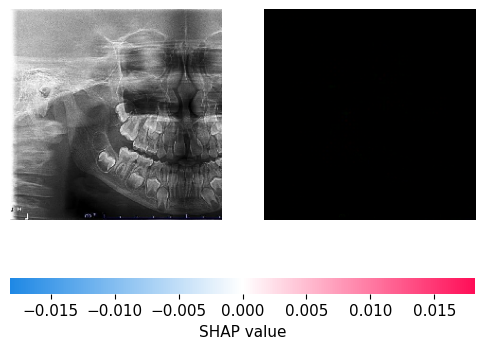

In [146]:
shap.image_plot(shap_values_F7_1, background_test_array[[10]])

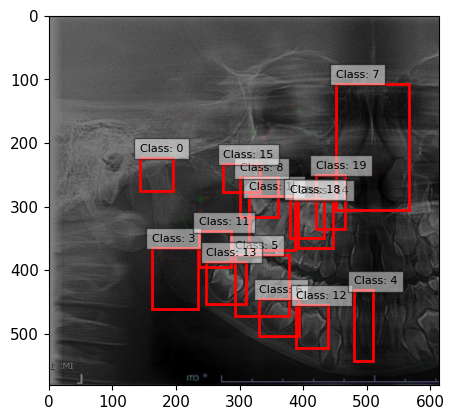

In [147]:
selected_bboxes_F7_1_pos = plot_bboxes_on_image_pos(image_paths['F7_1'], df_F7_1_filtered, processed_shap_values['F7_1']['grayscale_pos_thresholded'])

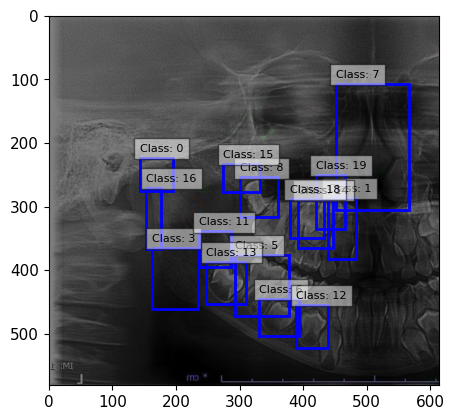

In [148]:
selected_bboxes_F7_1_neg = plot_bboxes_on_image_neg(image_paths['F7_1'], df_F7_1_filtered, processed_shap_values['F7_1']['grayscale_neg_thresholded'])

#### male

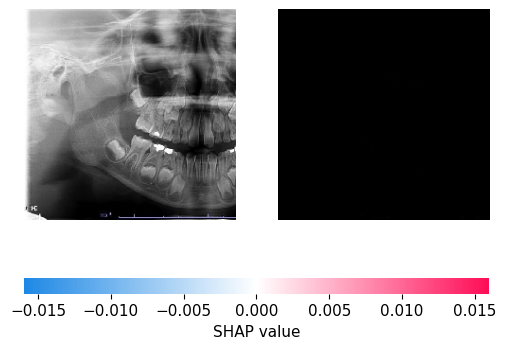

In [149]:
shap.image_plot(shap_values_M7_1, background_test_array[[21]])

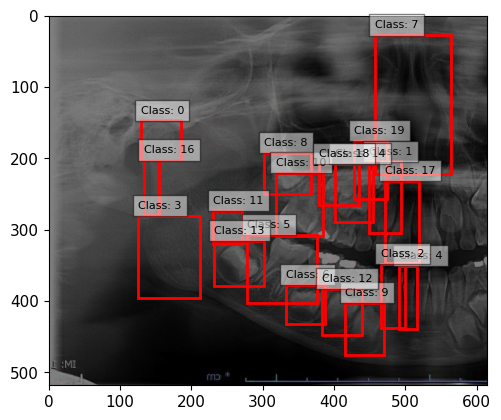

In [150]:
selected_bboxes_M7_1_pos = plot_bboxes_on_image_pos(image_paths['M7_1'], df_M7_1_filtered, processed_shap_values['M7_1']['grayscale_pos_thresholded'])
%matplotlib inline

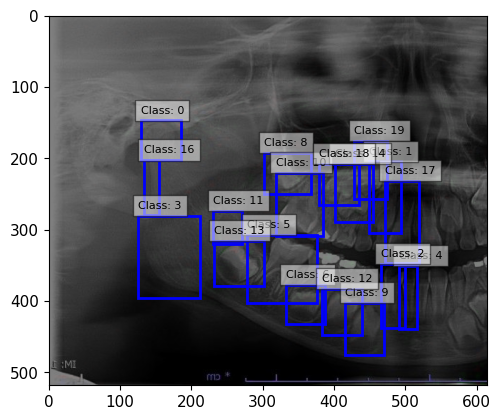

In [151]:
selected_bboxes_M7_1_neg = plot_bboxes_on_image_neg(image_paths['M7_1'], df_M7_1_filtered, processed_shap_values['M7_1']['grayscale_neg_thresholded'])

### 9

#### female

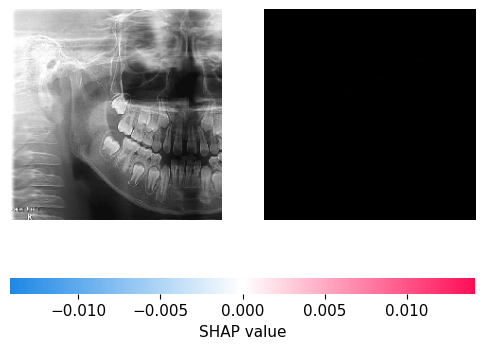

In [152]:
shap.image_plot(shap_values_F9_1, background_test_array[[71]])

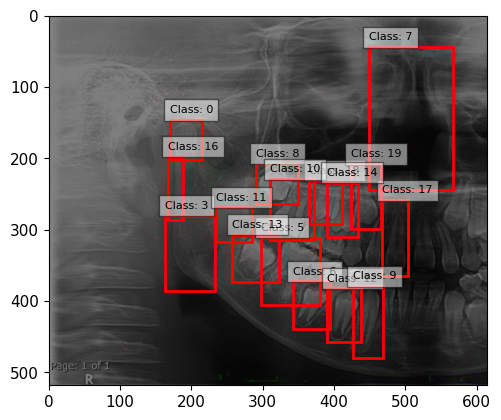

In [153]:
selected_bboxes_F9_1_pos = plot_bboxes_on_image_pos(image_paths['F9_1'], df_F9_1_filtered, processed_shap_values['F9_1']['grayscale_pos_thresholded'])

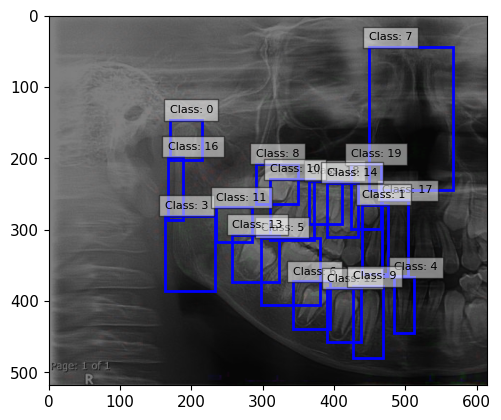

In [154]:
selected_bboxes_F9_1_neg = plot_bboxes_on_image_neg(image_paths['F9_1'], df_F9_1_filtered, processed_shap_values['F9_1']['grayscale_neg_thresholded'])

#### male

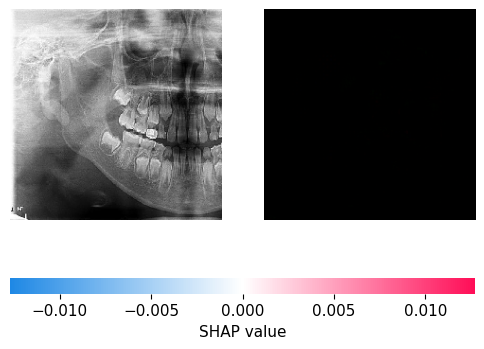

In [155]:
shap.image_plot(shap_values_M9_1, background_test_array[[84]])

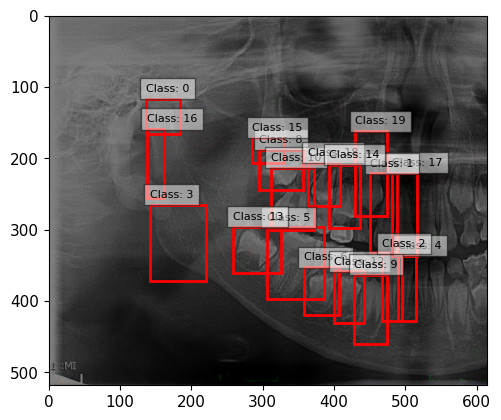

In [156]:
selected_bboxes_M9_1_pos = plot_bboxes_on_image_pos(image_paths['M9_1'], df_M9_1_filtered, processed_shap_values['M9_1']['grayscale_pos_thresholded'])

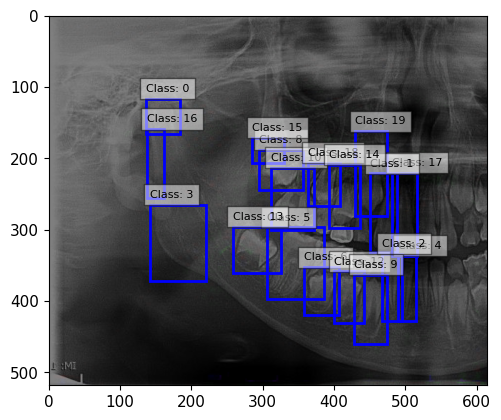

In [157]:
selected_bboxes_M9_1_neg = plot_bboxes_on_image_neg(image_paths['M9_1'], df_M9_1_filtered, processed_shap_values['M9_1']['grayscale_neg_thresholded'])

### 11

#### female

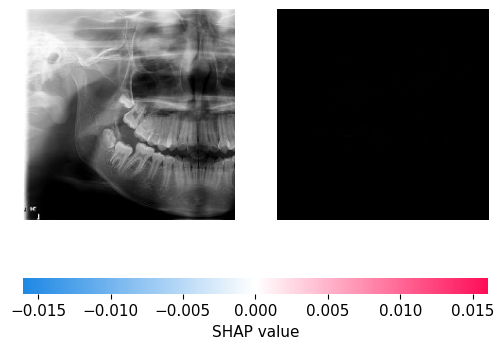

In [158]:
shap.image_plot(shap_values_F11_1, background_test_array[[122]])

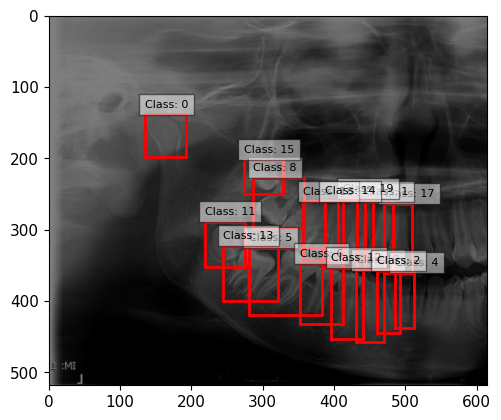

In [159]:
selected_bboxes_F11_1_pos = plot_bboxes_on_image_pos(image_paths['F11_1'], df_F11_1_filtered, processed_shap_values['F11_1']['grayscale_pos_thresholded'])

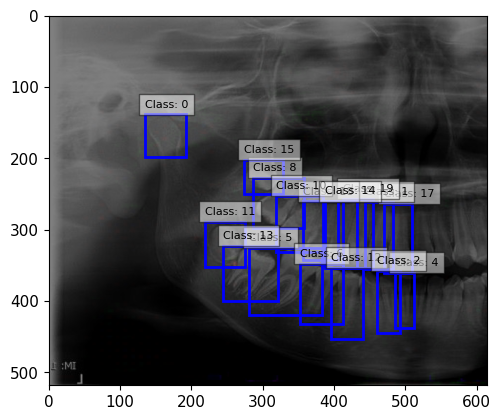

In [160]:
selected_bboxes_F11_1_neg = plot_bboxes_on_image_neg(image_paths['F11_1'], df_F11_1_filtered, processed_shap_values['F11_1']['grayscale_neg_thresholded'])

#### male

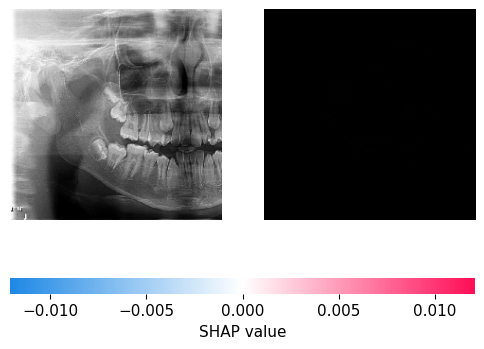

In [161]:
shap.image_plot(shap_values_M11_1, background_test_array[[128]])

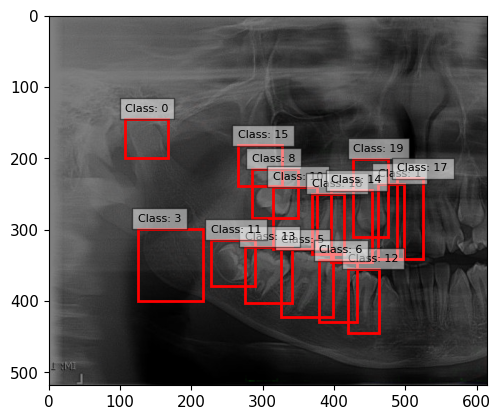

In [162]:
selected_bboxes_M11_1_pos = plot_bboxes_on_image_pos(image_paths['M11_1'], df_M11_1_filtered, processed_shap_values['M11_1']['grayscale_pos_thresholded'])

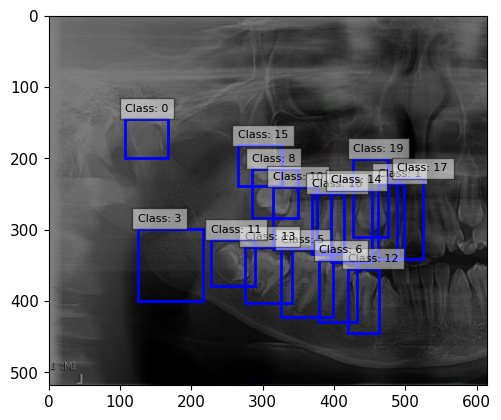

In [163]:
selected_bboxes_M11_1_neg = plot_bboxes_on_image_neg(image_paths['M11_1'], df_M11_1_filtered, processed_shap_values['M11_1']['grayscale_neg_thresholded'])

### 13

#### female

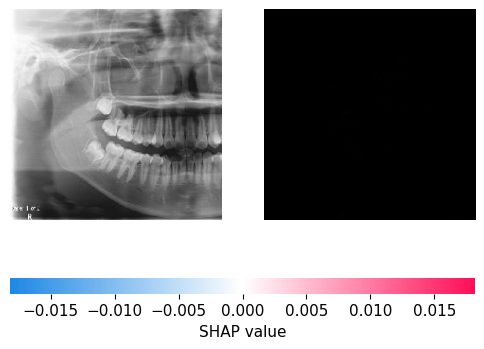

In [164]:
shap.image_plot(shap_values_F7_1, background_test_array[[159]])

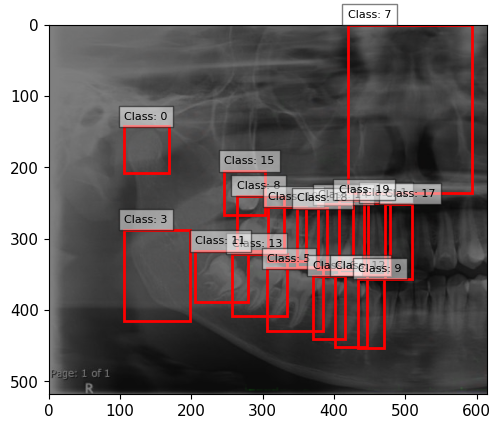

In [165]:
selected_bboxes_F13_1_pos = plot_bboxes_on_image_pos(image_paths['F13_1'], df_F13_1_filtered, processed_shap_values['F13_1']['grayscale_pos_thresholded'])

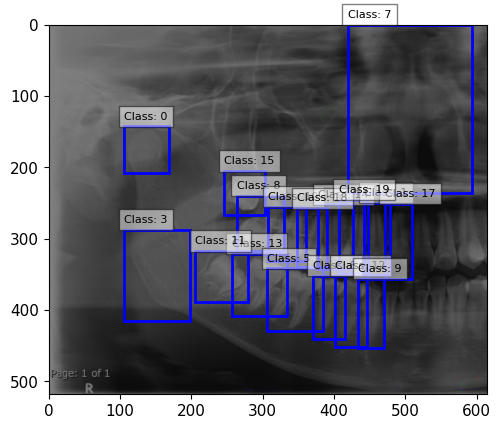

In [166]:
selected_bboxes_F13_1_neg = plot_bboxes_on_image_neg(image_paths['F13_1'], df_F13_1_filtered, processed_shap_values['F13_1']['grayscale_neg_thresholded'])

#### male

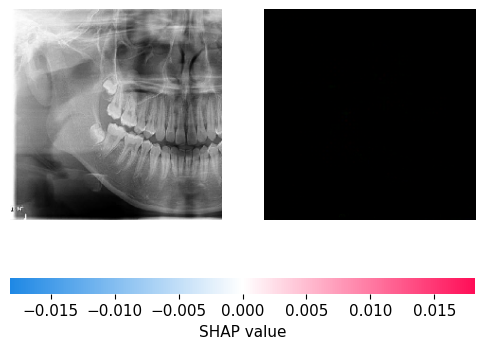

In [167]:
shap.image_plot(shap_values_F7_1, background_test_array[[175]])

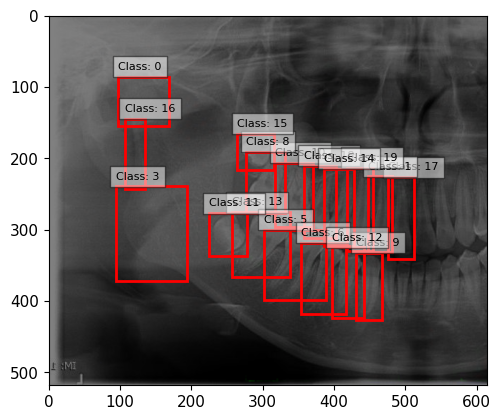

In [168]:
selected_bboxes_M13_1_pos = plot_bboxes_on_image_pos(image_paths['M13_1'], df_M13_1_filtered, processed_shap_values['M13_1']['grayscale_pos_thresholded'])

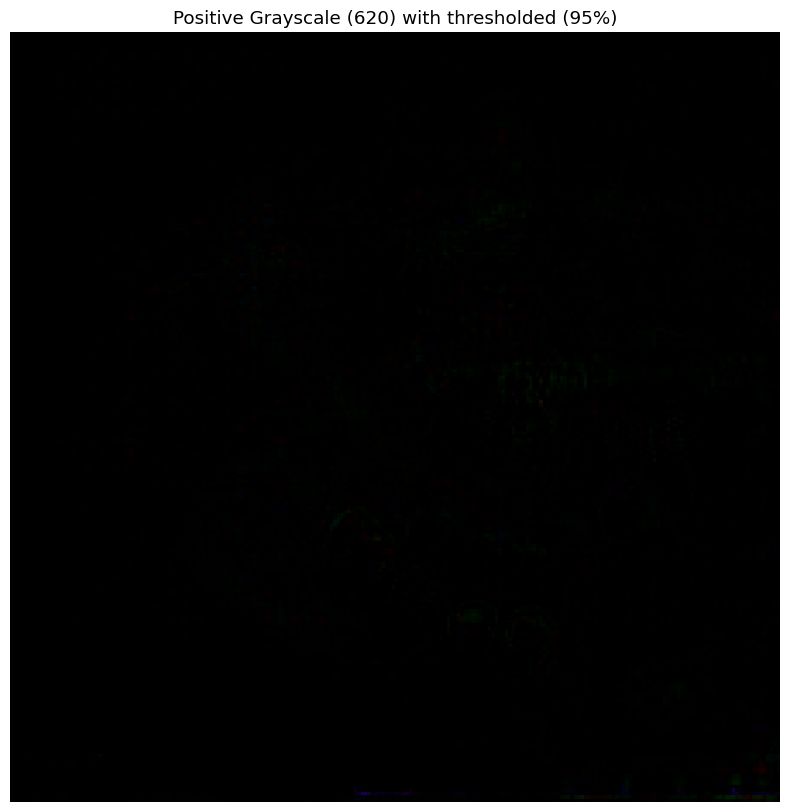

In [169]:
# # Plot the grayscale image
plt.figure(figsize=(15, 10))
plt.imshow(processed_shap_values['M13_1']['grayscale_neg_abs'], cmap='gray', interpolation='nearest')
plt.title('Positive Grayscale (620) with thresholded (95%)')
plt.axis('off')
plt.show()

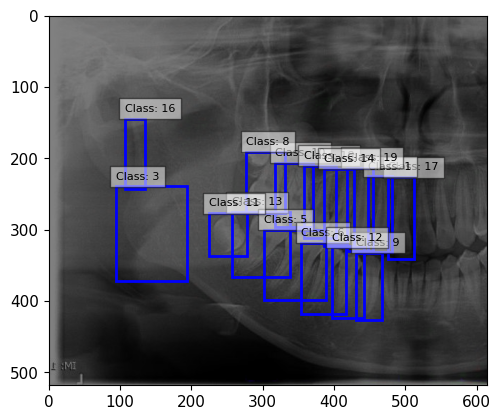

In [170]:
selected_bboxes_M13_1_neg = plot_bboxes_on_image_neg(image_paths['M13_1'], df_M13_1_filtered, processed_shap_values['M13_1']['grayscale_neg_thresholded'])

### 15

#### Female

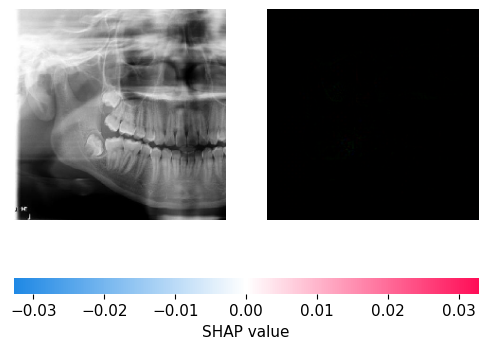

In [171]:
shap.image_plot(shap_values_F15_1, background_test_array[[200]])

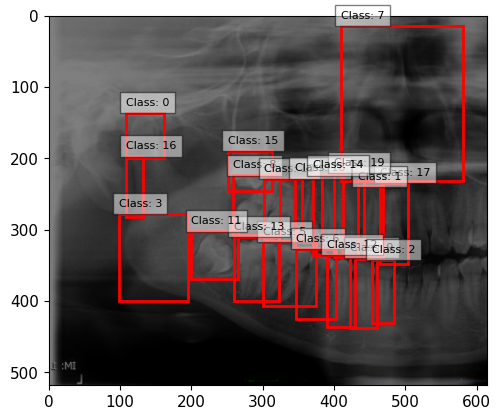

In [172]:
selected_bboxes_F15_1_pos = plot_bboxes_on_image_pos(image_paths['F15_1'], df_F15_1_filtered, processed_shap_values['F15_1']['grayscale_pos_thresholded'])

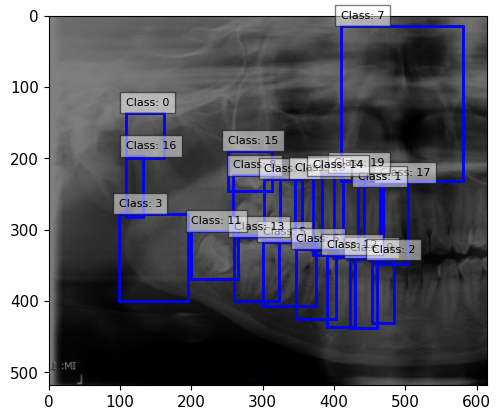

In [173]:
selected_bboxes_F15_1_neg = plot_bboxes_on_image_neg(image_paths['F15_1'], df_F15_1_filtered, processed_shap_values['F15_1']['grayscale_neg_thresholded'])

#### male

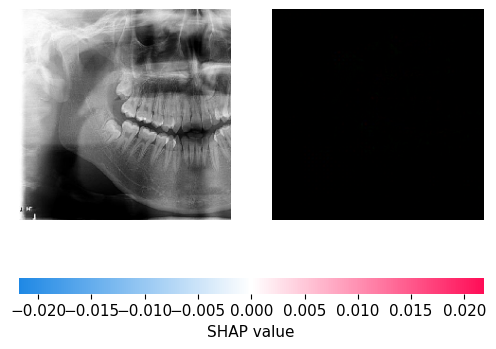

In [174]:
#shap_values_M15_1 = explainer_layer1.shap_values(background_test_array[[207]])
shap.image_plot(shap_values_M15_1, background_test_array[[207]])

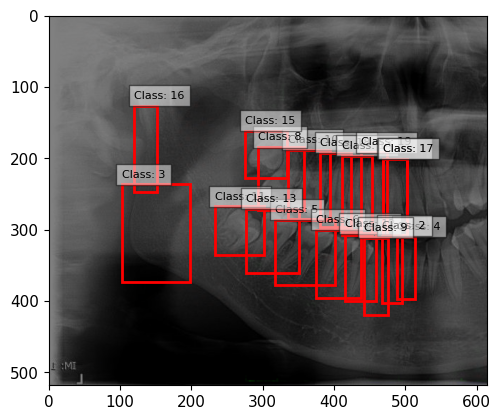

In [175]:
selected_bboxes_M15_1_pos = plot_bboxes_on_image_pos(image_paths['M15_1'], df_M15_1_filtered, processed_shap_values['M15_1']['grayscale_pos_thresholded'])

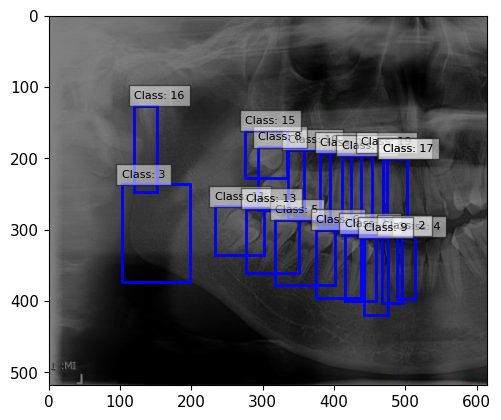

In [176]:
selected_bboxes_M15_1_neg = plot_bboxes_on_image_neg(image_paths['M15_1'], df_M15_1_filtered, processed_shap_values['M15_1']['grayscale_neg_thresholded'])

# ลอง

In [177]:
shap_values_F7_1 = explainer_layer1.shap_values(background_test_array[[10]])
shap_values_M7_1 = explainer_layer1.shap_values(background_test_array[[21]])
shap_values_F9_1 = explainer_layer1.shap_values(background_test_array[[71]])
shap_values_M9_1 = explainer_layer1.shap_values(background_test_array[[84]])
shap_values_F11_1 = explainer_layer1.shap_values(background_test_array[[122]])
shap_values_M11_1 = explainer_layer1.shap_values(background_test_array[[128]])
shap_values_F13_1 = explainer_layer1.shap_values(background_test_array[[159]])
shap_values_M13_1 = explainer_layer1.shap_values(background_test_array[[175]])
shap_values_F15_1 = explainer_layer1.shap_values(background_test_array[[200]])
shap_values_M15_1 = explainer_layer1.shap_values(background_test_array[[207]])
%matplotlib inline
#shap.image_plot(shap_values_F7_1, background_test_array[[10]])

In [178]:
data= [np.array(shap_values_M9_1)]
image_array = data[0]
positive =np.where(image_array >= 0, image_array, 0)
negative = np.where(image_array < 0, image_array, 0)
negative_aps =  np.abs(negative)

flattened_array_pos = positive.flatten()
flattened_array_neg = negative_aps.flatten()

normalized_array_pos = (flattened_array_pos - np.min(flattened_array_pos)) / (np.max(flattened_array_pos) - np.min(flattened_array_pos))
normalized_array_neg = (flattened_array_neg - np.min(flattened_array_neg)) / (np.max(flattened_array_neg) - np.min(flattened_array_neg))

normalized_positive = normalized_array_pos.reshape(positive.shape)
normalized_neg = normalized_array_neg.reshape(negative_aps.shape)


grayscale_image_pos = normalized_positive/ 3.0
grayscale_image_neg = normalized_neg/ 3.0

grayscale_image_positive = np.mean(grayscale_image_pos, axis=4)
grayscale_image_negative = np.mean(grayscale_image_neg, axis=4)

grayscale_image_positive = grayscale_image_positive.squeeze()
grayscale_image_negative = grayscale_image_negative.squeeze()

In [179]:
percentile_95_pos = np.percentile(grayscale_image_positive, 95)
percentile_95_neg = np.percentile(grayscale_image_negative, 95)

grayscale_pos_thresholded = grayscale_image_positive
grayscale_neg_thresholded = grayscale_image_negative


grayscale_pos_thresholded[grayscale_pos_thresholded < percentile_95_pos] = 0
grayscale_neg_thresholded[grayscale_neg_thresholded < percentile_95_neg] = 0

In [180]:
df_F7_1_filtered = nms_per_class(results_F7_1,iou_threshold=0.5)
df_M7_1_filtered = nms_per_class(results_M7_1,iou_threshold=0.5)
df_F9_1_filtered = nms_per_class(results_F9_1,iou_threshold=0.5)
df_M9_1_filtered = nms_per_class(results_M9_1,iou_threshold=0.5)
df_F11_1_filtered = nms_per_class(results_F11_1,iou_threshold=0.5)
df_M11_1_filtered = nms_per_class(results_M11_1,iou_threshold=0.5)
df_F13_1_filtered = nms_per_class(results_F13_1,iou_threshold=0.5)
df_M13_1_filtered = nms_per_class(results_M13_1,iou_threshold=0.5)
df_F15_1_filtered = nms_per_class(results_F15_1,iou_threshold=0.5)
df_M15_1_filtered = nms_per_class(results_M15_1,iou_threshold=0.5)

In [181]:
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/F/Both/FlipV79.jpg #10
# /content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/M/Both/FlipVV88.jpg #21
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/9Y/F/Both/W91.jpg #71
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/9Y/M/Both/FlipWW75.jpg #84
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/11Y/F/Both/FlipD89.jpg #122
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/11Y/M/Both/FlipDD100.jpg #128
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/13Y/F/Both/G94.jpg #159
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/13Y/M/Both/FlipGG129.jpg #175
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/15Y/F/Both/FlipB157.jpg #200
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/15Y/M/Lt/FlipB317.jpg #207

In [182]:
image_path1 = '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/F/Both/FlipV79.jpg'

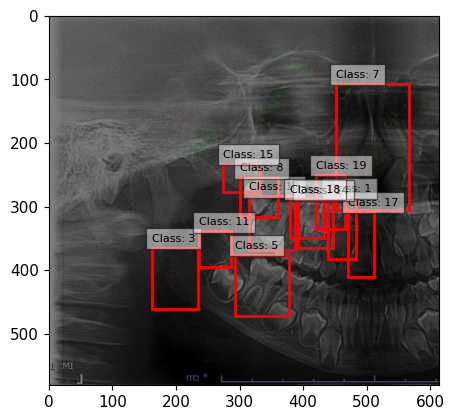

In [183]:
selected_bboxes_F7_1_pos = plot_bboxes_on_image_pos(image_path1,df_F7_1_filtered, grayscale_pos_thresholded)

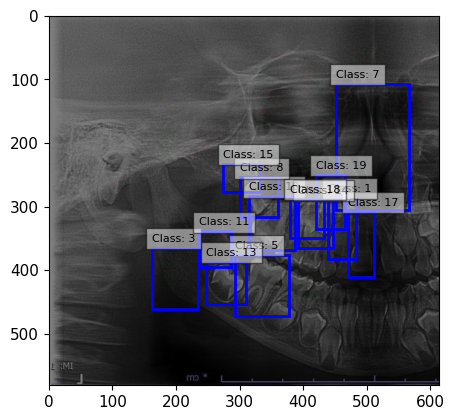

In [184]:
selected_bboxes_F7_1_neg = plot_bboxes_on_image_neg(image_path1,df_F7_1_filtered, grayscale_neg_thresholded)

In [185]:
image_path2 = '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/M/Both/FlipVV88.jpg'

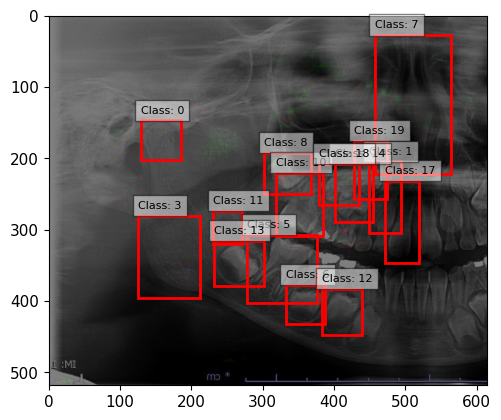

In [186]:
selected_bboxes_M7_1_pos = plot_bboxes_on_image_pos(image_path2,df_M7_1_filtered, grayscale_pos_thresholded)

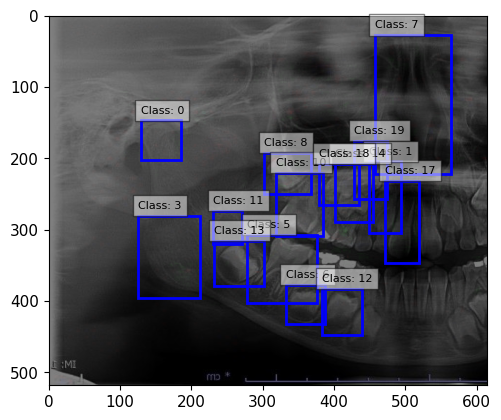

In [187]:
selected_bboxes_M7_1_neg = plot_bboxes_on_image_neg(image_path2,df_M7_1_filtered, grayscale_neg_thresholded)

In [188]:
image_path3 = '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/9Y/F/Both/W91.jpg'

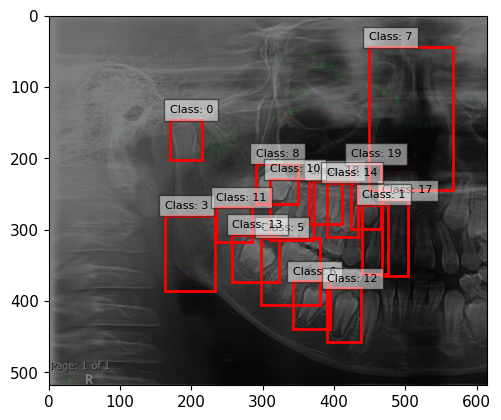

In [189]:
selected_bboxes_F9_1_pos = plot_bboxes_on_image_pos(image_path3,df_F9_1_filtered, grayscale_pos_thresholded)

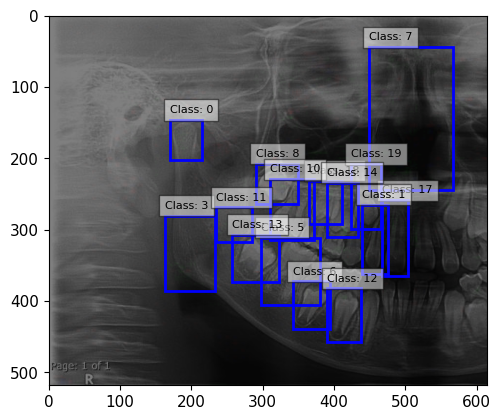

In [190]:
selected_bboxes_F9_1_neg = plot_bboxes_on_image_neg(image_path3,df_F9_1_filtered, grayscale_neg_thresholded)

In [191]:
image_path4 = '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/9Y/M/Both/FlipWW75.jpg'

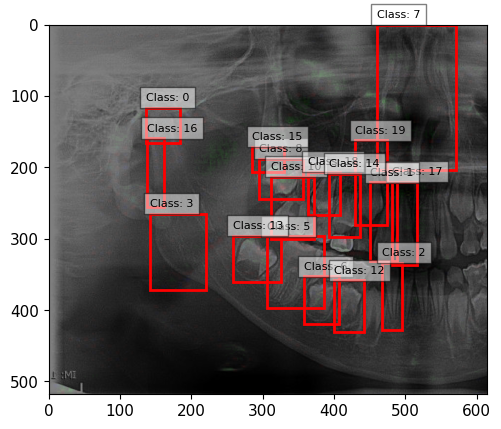

In [192]:
selected_bboxes_M9_1_pos = plot_bboxes_on_image_pos(image_path4,df_M9_1_filtered, grayscale_pos_thresholded)

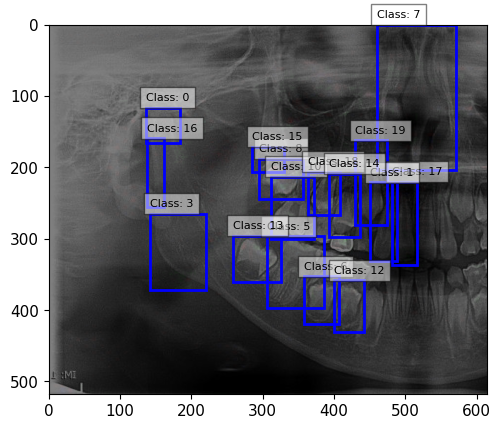

In [193]:
selected_bboxes_M9_1_neg = plot_bboxes_on_image_neg(image_path4,df_M9_1_filtered, grayscale_neg_thresholded)

## 15

In [194]:
#เลือกรูป
sdf_test.reset_index()['Path_Name'][15]

'/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/F/Both/V67.jpg'

In [195]:
from PIL import Image
image_path_Y23_1 = '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/F/Both/V67.jpg'

ImageY23_1 = Image.open('/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/F/Both/V67.jpg')

In [196]:
#ภาพ1
resultsY23_1 = yolo_model(ImageY23_1)
df_Y23_1 = resultsY23_1.pandas().xyxyn[0]

In [197]:
df_Y23_1_filtered = nms_per_class(df_Y23_1,iou_threshold=0.5)

In [198]:
shap_values_layer1 = explainer_layer2.shap_values(background_test_array[[15]])

In [199]:
data= [np.array(shap_values_layer1)]
image_array = data[0]
positive =np.where(image_array >= 0, image_array, 0)
negative = np.where(image_array < 0, image_array, 0)
negative_aps =  np.abs(negative)

flattened_array_pos = positive.flatten()
flattened_array_neg = negative_aps.flatten()

normalized_array_pos = (flattened_array_pos - np.min(flattened_array_pos)) / (np.max(flattened_array_pos) - np.min(flattened_array_pos))
normalized_array_neg = (flattened_array_neg - np.min(flattened_array_neg)) / (np.max(flattened_array_neg) - np.min(flattened_array_neg))

normalized_positive = normalized_array_pos.reshape(positive.shape)
normalized_neg = normalized_array_neg.reshape(negative_aps.shape)


grayscale_image_pos = normalized_positive/ 3.0
grayscale_image_neg = normalized_neg/ 3.0

grayscale_image_positive = np.mean(grayscale_image_pos, axis=4)
grayscale_image_negative = np.mean(grayscale_image_neg, axis=4)

grayscale_image_positive = grayscale_image_positive.squeeze()
grayscale_image_negative = grayscale_image_negative.squeeze()

In [200]:
percentile_95_pos = np.percentile(grayscale_image_positive, 95)
percentile_95_neg = np.percentile(grayscale_image_negative, 95)

grayscale_pos_thresholded = grayscale_image_positive
grayscale_neg_thresholded = grayscale_image_negative


grayscale_pos_thresholded[grayscale_pos_thresholded < percentile_95_pos] = 0
grayscale_neg_thresholded[grayscale_neg_thresholded < percentile_95_neg] = 0

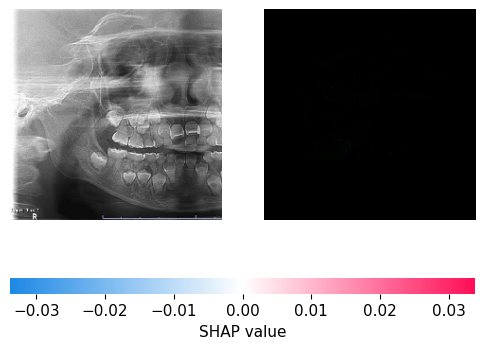

In [201]:
shap.image_plot(shap_values_F15_1, background_test_array[[15]])

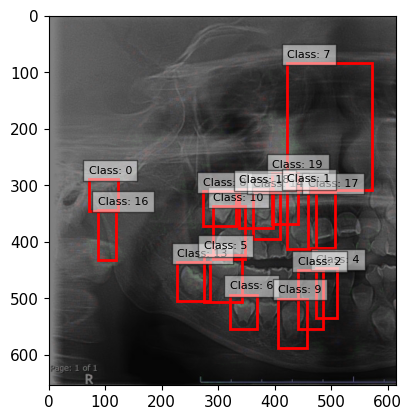

In [202]:
selected_bboxes_F7_1_pos = plot_bboxes_on_image_pos(image_path_Y23_1,df_Y23_1_filtered, grayscale_pos_thresholded)
%matplotlib inline

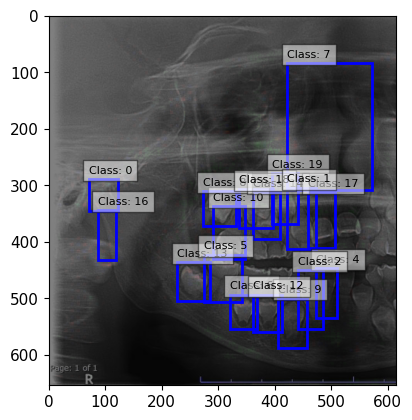

In [203]:
selected_bboxes_F7_1_neg = plot_bboxes_on_image_neg(image_path_Y23_1,df_Y23_1_filtered, grayscale_neg_thresholded)

In [204]:
#sdf_test[sdf_test['Age(year)']==15]
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/F/Both/FlipV79.jpg #10
# /content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/M/Both/FlipVV88.jpg #21
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/9Y/F/Both/W91.jpg #71
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/9Y/M/Both/FlipWW75.jpg #84
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/11Y/F/Both/FlipD89.jpg #122
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/11Y/M/Both/FlipDD100.jpg #128
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/13Y/F/Both/G94.jpg #159
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/13Y/M/Both/FlipGG129.jpg #175
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/15Y/F/Both/FlipB157.jpg #200
#/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/15Y/M/Lt/FlipB317.jpg #207

## 77

In [205]:
#เลือกรูป
sdf_test.reset_index()['Path_Name'][77]

'/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/9Y/F/Both/W88.jpg'

In [206]:
from PIL import Image
image_path_Y23_1 = '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/9Y/F/Both/W88.jpg'

ImageY23_1 = Image.open('/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/9Y/F/Both/W88.jpg')

In [207]:
#ภาพ1
resultsY23_1 = yolo_model(ImageY23_1)
df_Y23_1 = resultsY23_1.pandas().xyxyn[0]

In [208]:
df_Y23_1_filtered = nms_per_class(df_Y23_1,iou_threshold=0.5)

In [209]:
shap_values_layer1 = explainer_layer2.shap_values(background_test_array[[77]])

In [210]:
data= [np.array(shap_values_layer1)]
image_array = data[0]
positive =np.where(image_array >= 0, image_array, 0)
negative = np.where(image_array < 0, image_array, 0)
negative_aps =  np.abs(negative)

flattened_array_pos = positive.flatten()
flattened_array_neg = negative_aps.flatten()

normalized_array_pos = (flattened_array_pos - np.min(flattened_array_pos)) / (np.max(flattened_array_pos) - np.min(flattened_array_pos))
normalized_array_neg = (flattened_array_neg - np.min(flattened_array_neg)) / (np.max(flattened_array_neg) - np.min(flattened_array_neg))

normalized_positive = normalized_array_pos.reshape(positive.shape)
normalized_neg = normalized_array_neg.reshape(negative_aps.shape)


grayscale_image_pos = normalized_positive/ 3.0
grayscale_image_neg = normalized_neg/ 3.0

grayscale_image_positive = np.mean(grayscale_image_pos, axis=4)
grayscale_image_negative = np.mean(grayscale_image_neg, axis=4)

grayscale_image_positive = grayscale_image_positive.squeeze()
grayscale_image_negative = grayscale_image_negative.squeeze()

In [211]:
percentile_95_pos = np.percentile(grayscale_image_positive, 95)
percentile_95_neg = np.percentile(grayscale_image_negative, 95)

grayscale_pos_thresholded = grayscale_image_positive
grayscale_neg_thresholded = grayscale_image_negative


grayscale_pos_thresholded[grayscale_pos_thresholded < percentile_95_pos] = 0
grayscale_neg_thresholded[grayscale_neg_thresholded < percentile_95_neg] = 0

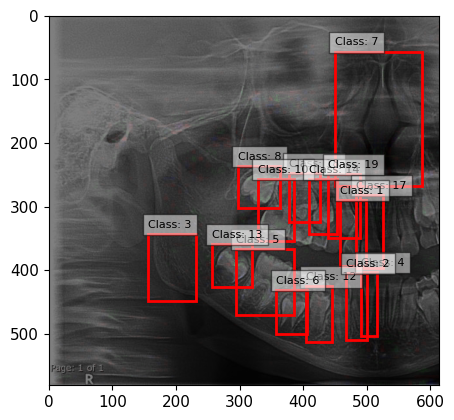

In [212]:
selected_bboxes_F7_1_pos = plot_bboxes_on_image_pos(image_path_Y23_1,df_Y23_1_filtered, grayscale_pos_thresholded)
%matplotlib inline

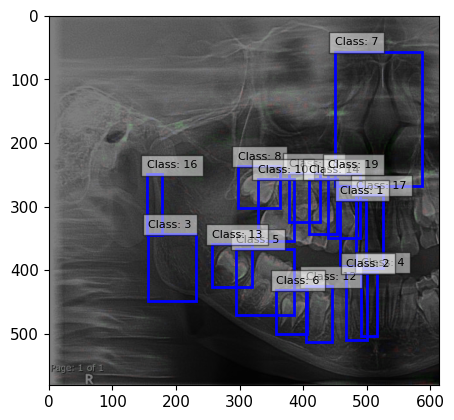

In [213]:
selected_bboxes_F7_1_neg = plot_bboxes_on_image_neg(image_path_Y23_1,df_Y23_1_filtered, grayscale_neg_thresholded)

## 126

In [214]:
#เลือกรูป
sdf_test.reset_index()['Path_Name'][126]

'/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/11Y/F/Lt/FlipD80.jpg'

In [215]:
from PIL import Image
image_path_Y23_1 = '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/11Y/F/Lt/FlipD80.jpg'

ImageY23_1 = Image.open('/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/11Y/F/Lt/FlipD80.jpg')

In [216]:
#ภาพ1
resultsY23_1 = yolo_model(ImageY23_1)
df_Y23_1 = resultsY23_1.pandas().xyxyn[0]
df_Y23_1

,xmin,ymin,xmax,ymax,confidence,class,name
0,0.401995,0.527614,0.517948,0.693379,0.926549,13,Lower Second Molar
1,0.469307,0.579106,0.598357,0.766932,0.920516,5,Lower First Molar
2,0.516611,0.401013,0.613609,0.560707,0.913655,10,Upper First Molar
3,0.565212,0.613003,0.651271,0.782956,0.896651,6,Lower Second Premolar
4,0.768459,0.437378,0.830813,0.644184,0.891016,17,Upper Central Incisor
5,0.681971,0.642507,0.745119,0.823260,0.888147,9,Lower Canine
6,0.726648,0.435681,0.782014,0.630105,0.886869,1,Upper Lateral Incisor
7,0.347205,0.518807,0.429754,0.644146,0.882555,11,Lower Third Molar
8,0.624888,0.633722,0.698207,0.816020,0.880299,12,Lower First Premolar
9,0.586862,0.406535,0.661336,0.580385,0.878388,18,Upper Second Premolar


In [217]:
df_Y23_1_filtered = nms_per_class(df_Y23_1,iou_threshold=0.5)
df_Y23_1_filtered

,xmin,ymin,xmax,ymax,confidence,class,name
0,0.401995,0.527614,0.517948,0.693379,0.926549,13,Lower Second Molar
1,0.469307,0.579106,0.598357,0.766932,0.920516,5,Lower First Molar
2,0.516611,0.401013,0.613609,0.560707,0.913655,10,Upper First Molar
3,0.565212,0.613003,0.651271,0.782956,0.896651,6,Lower Second Premolar
4,0.768459,0.437378,0.830813,0.644184,0.891016,17,Upper Central Incisor
5,0.681971,0.642507,0.745119,0.823260,0.888147,9,Lower Canine
6,0.726648,0.435681,0.782014,0.630105,0.886869,1,Upper Lateral Incisor
7,0.347205,0.518807,0.429754,0.644146,0.882555,11,Lower Third Molar
8,0.624888,0.633722,0.698207,0.816020,0.880299,12,Lower First Premolar
9,0.586862,0.406535,0.661336,0.580385,0.878388,18,Upper Second Premolar


In [218]:
shap_values_layer1 = explainer_layer2.shap_values(background_test_array[[126]])

In [219]:
data= [np.array(shap_values_layer1)]
image_array = data[0]
positive =np.where(image_array >= 0, image_array, 0)
negative = np.where(image_array < 0, image_array, 0)
negative_aps =  np.abs(negative)

flattened_array_pos = positive.flatten()
flattened_array_neg = negative_aps.flatten()

normalized_array_pos = (flattened_array_pos - np.min(flattened_array_pos)) / (np.max(flattened_array_pos) - np.min(flattened_array_pos))
normalized_array_neg = (flattened_array_neg - np.min(flattened_array_neg)) / (np.max(flattened_array_neg) - np.min(flattened_array_neg))

normalized_positive = normalized_array_pos.reshape(positive.shape)
normalized_neg = normalized_array_neg.reshape(negative_aps.shape)


grayscale_image_pos = normalized_positive/ 3.0
grayscale_image_neg = normalized_neg/ 3.0

grayscale_image_positive = np.mean(grayscale_image_pos, axis=4)
grayscale_image_negative = np.mean(grayscale_image_neg, axis=4)

grayscale_image_positive = grayscale_image_positive.squeeze()
grayscale_image_negative = grayscale_image_negative.squeeze()

In [220]:
percentile_95_pos = np.percentile(grayscale_image_positive, 95)
percentile_95_neg = np.percentile(grayscale_image_negative, 95)

grayscale_pos_thresholded = grayscale_image_positive
grayscale_neg_thresholded = grayscale_image_negative


grayscale_pos_thresholded[grayscale_pos_thresholded < percentile_95_pos] = 0
grayscale_neg_thresholded[grayscale_neg_thresholded < percentile_95_neg] = 0

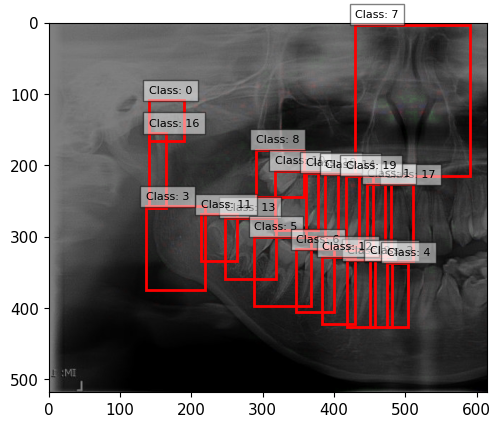

In [221]:
selected_bboxes_F7_1_pos = plot_bboxes_on_image_pos(image_path_Y23_1,df_Y23_1_filtered, grayscale_pos_thresholded)
%matplotlib inline

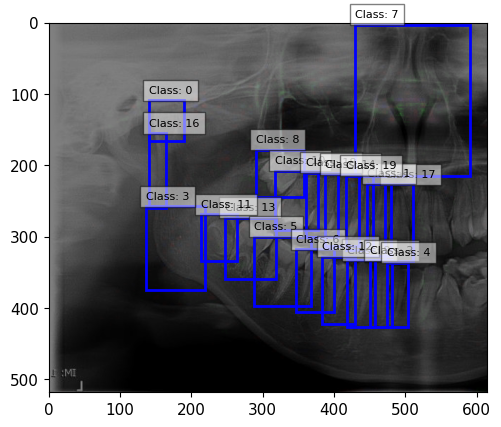

In [222]:
selected_bboxes_F7_1_neg = plot_bboxes_on_image_neg(image_path_Y23_1,df_Y23_1_filtered, grayscale_neg_thresholded)

## 162

In [223]:
#เลือกรูป
sdf_test.reset_index()['Path_Name'][162]

'/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/13Y/F/Both/G83.jpg'

In [224]:
from PIL import Image
image_path_Y23_1 = '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/13Y/F/Both/G83.jpg'

ImageY23_1 = Image.open('/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/13Y/F/Both/G83.jpg')

In [225]:
#ภาพ1
resultsY23_1 = yolo_model(ImageY23_1)
df_Y23_1 = resultsY23_1.pandas().xyxyn[0]

In [226]:
df_Y23_1_filtered = nms_per_class(df_Y23_1,iou_threshold=0.5)

In [227]:
shap_values_layer1 = explainer_layer2.shap_values(background_test_array[[162]])

In [228]:
data= [np.array(shap_values_layer1)]
image_array = data[0]
positive =np.where(image_array >= 0, image_array, 0)
negative = np.where(image_array < 0, image_array, 0)
negative_aps =  np.abs(negative)

flattened_array_pos = positive.flatten()
flattened_array_neg = negative_aps.flatten()

normalized_array_pos = (flattened_array_pos - np.min(flattened_array_pos)) / (np.max(flattened_array_pos) - np.min(flattened_array_pos))
normalized_array_neg = (flattened_array_neg - np.min(flattened_array_neg)) / (np.max(flattened_array_neg) - np.min(flattened_array_neg))

normalized_positive = normalized_array_pos.reshape(positive.shape)
normalized_neg = normalized_array_neg.reshape(negative_aps.shape)


grayscale_image_pos = normalized_positive/ 3.0
grayscale_image_neg = normalized_neg/ 3.0

grayscale_image_positive = np.mean(grayscale_image_pos, axis=4)
grayscale_image_negative = np.mean(grayscale_image_neg, axis=4)

grayscale_image_positive = grayscale_image_positive.squeeze()
grayscale_image_negative = grayscale_image_negative.squeeze()

In [229]:
percentile_95_pos = np.percentile(grayscale_image_positive, 95)
percentile_95_neg = np.percentile(grayscale_image_negative, 95)

grayscale_pos_thresholded = grayscale_image_positive
grayscale_neg_thresholded = grayscale_image_negative


grayscale_pos_thresholded[grayscale_pos_thresholded < percentile_95_pos] = 0
grayscale_neg_thresholded[grayscale_neg_thresholded < percentile_95_neg] = 0

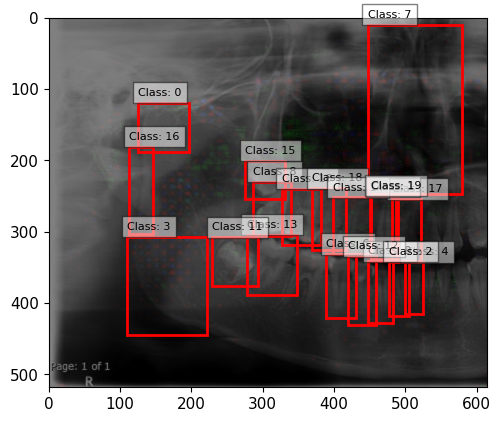

In [230]:
selected_bboxes_F7_1_pos = plot_bboxes_on_image_pos(image_path_Y23_1,df_Y23_1_filtered, grayscale_pos_thresholded)
%matplotlib inline

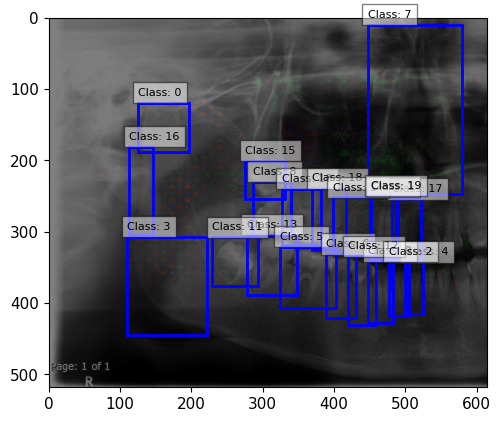

In [231]:
selected_bboxes_F7_1_neg = plot_bboxes_on_image_neg(image_path_Y23_1,df_Y23_1_filtered, grayscale_neg_thresholded)

## 205

In [232]:
#เลือกรูป
sdf_test.reset_index()['Path_Name'][205]

'/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/15Y/M/Both/FlipB300.jpg'

In [233]:
from PIL import Image
image_path_Y23_1 = '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/9Y/F/Both/W88.jpg'

ImageY23_1 = Image.open('/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/9Y/F/Both/W88.jpg')

In [234]:
#ภาพ1
resultsY23_1 = yolo_model(ImageY23_1)
df_Y23_1 = resultsY23_1.pandas().xyxyn[0]

In [235]:
df_Y23_1_filtered = nms_per_class(df_Y23_1,iou_threshold=0.5)

In [236]:
shap_values_layer1 = explainer_layer2.shap_values(background_test_array[[205]])

In [237]:
data= [np.array(shap_values_layer1)]
image_array = data[0]
positive =np.where(image_array >= 0, image_array, 0)
negative = np.where(image_array < 0, image_array, 0)
negative_aps =  np.abs(negative)

flattened_array_pos = positive.flatten()
flattened_array_neg = negative_aps.flatten()

normalized_array_pos = (flattened_array_pos - np.min(flattened_array_pos)) / (np.max(flattened_array_pos) - np.min(flattened_array_pos))
normalized_array_neg = (flattened_array_neg - np.min(flattened_array_neg)) / (np.max(flattened_array_neg) - np.min(flattened_array_neg))

normalized_positive = normalized_array_pos.reshape(positive.shape)
normalized_neg = normalized_array_neg.reshape(negative_aps.shape)


grayscale_image_pos = normalized_positive/ 3.0
grayscale_image_neg = normalized_neg/ 3.0

grayscale_image_positive = np.mean(grayscale_image_pos, axis=4)
grayscale_image_negative = np.mean(grayscale_image_neg, axis=4)

grayscale_image_positive = grayscale_image_positive.squeeze()
grayscale_image_negative = grayscale_image_negative.squeeze()

In [238]:
percentile_95_pos = np.percentile(grayscale_image_positive, 95)
percentile_95_neg = np.percentile(grayscale_image_negative, 95)

grayscale_pos_thresholded = grayscale_image_positive
grayscale_neg_thresholded = grayscale_image_negative


grayscale_pos_thresholded[grayscale_pos_thresholded < percentile_95_pos] = 0
grayscale_neg_thresholded[grayscale_neg_thresholded < percentile_95_neg] = 0

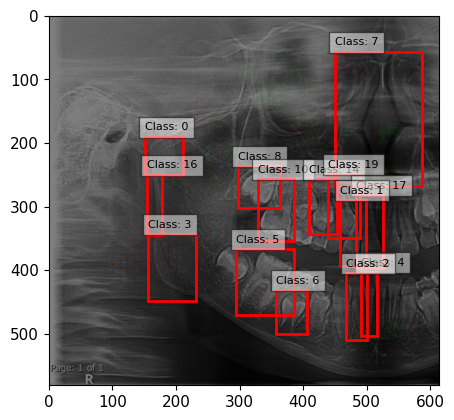

In [239]:
selected_bboxes_F7_1_pos = plot_bboxes_on_image_pos(image_path_Y23_1,df_Y23_1_filtered, grayscale_pos_thresholded)
%matplotlib inline

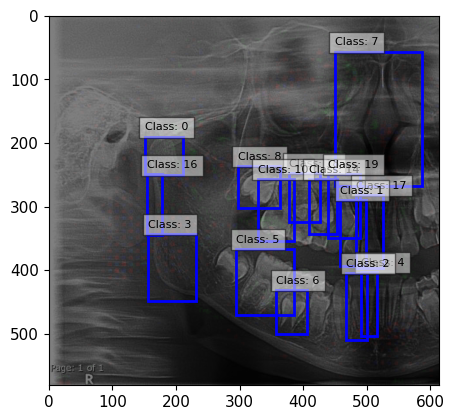

In [240]:
selected_bboxes_F7_1_neg = plot_bboxes_on_image_neg(image_path_Y23_1,df_Y23_1_filtered, grayscale_neg_thresholded)

## ส่วนใหม่

In [241]:
import numpy as np

# Assuming your data is stored in a variable named 'data'
data= [np.array(shap_values_F15_1)]

# Extract the array from the list
image_array = data[0]

# Separate positive and negative values for each channel
positive =np.where(image_array >= 0, image_array, 0)
negative = np.where(image_array < 0, image_array, 0)

In [242]:
positive

array([[[[[          0],
          [ 0.00080293],
          [ 9.0225e-05]],

         [[          0],
          [ 0.00075447],
          [  0.0002072]],

         [[          0],
          [  0.0011461],
          [ 6.7422e-05]],

         ...,

         [[ 0.00046551],
          [ 0.00028657],
          [          0]],

         [[ 0.00045484],
          [          0],
          [          0]],

         [[ 0.00038402],
          [ 2.9005e-05],
          [          0]]],


        [[[          0],
          [ 0.00089946],
          [ 0.00023038]],

         [[          0],
          [ 0.00033197],
          [ 0.00022516]],

         [[          0],
          [          0],
          [ 0.00025957]],

         ...,

         [[ 0.00052121],
          [ 0.00029123],
          [          0]],

         [[ 0.00068513],
          [          0],
          [          0]],

         [[ 0.00047938],
          [          0],
          [          0]]],


        [[[          0],
          [  0.00

In [243]:
negative

array([[[[[-0.00069972],
          [          0],
          [          0]],

         [[ -0.0010877],
          [          0],
          [          0]],

         [[  -0.001302],
          [          0],
          [          0]],

         ...,

         [[          0],
          [          0],
          [-0.00016939]],

         [[          0],
          [-0.00012054],
          [-0.00036826]],

         [[          0],
          [          0],
          [-0.00028736]]],


        [[[-0.00095598],
          [          0],
          [          0]],

         [[-0.00067847],
          [          0],
          [          0]],

         [[-0.00041943],
          [-0.00014065],
          [          0]],

         ...,

         [[          0],
          [          0],
          [-0.00024351]],

         [[          0],
          [-0.00011753],
          [-0.00055551]],

         [[          0],
          [-0.00015541],
          [-0.00046721]]],


        [[[ -0.0014537],
          [      

In [244]:
negative_aps =  np.abs(negative)
negative_aps.shape

(1, 224, 224, 3, 1)

In [245]:
import numpy as np

# Assuming shap_values_layer1 is your NumPy array with shape (1, 224, 224, 3)
# Flatten the array for normalization and then reshape back to the original shape
flattened_array = positive.flatten()

# Min-Max normalization to scale between 0 and 1
normalized_array = (flattened_array - np.min(flattened_array)) / (np.max(flattened_array) - np.min(flattened_array))

# Reshape back to the original shape
normalized_positive = normalized_array.reshape(positive.shape)

In [246]:
# Combine the three channel images into a single grayscale image
grayscale_image_pos = normalized_positive/ 3.0

In [247]:
import numpy as np

# Assuming shap_values_layer1 is your NumPy array with shape (1,1, 224, 224, 3)
# Calculate the mean across the color channels (axis=3)
grayscale_image = np.mean(grayscale_image_pos, axis=4)

# Now, grayscale_image has shape (1, 224, 224)
# Remove the first dimension to get a shape of (224, 224) for plotting
grayscale_image = grayscale_image.squeeze()

# Now grayscale_image is ready for plotting and has shape (224, 224)

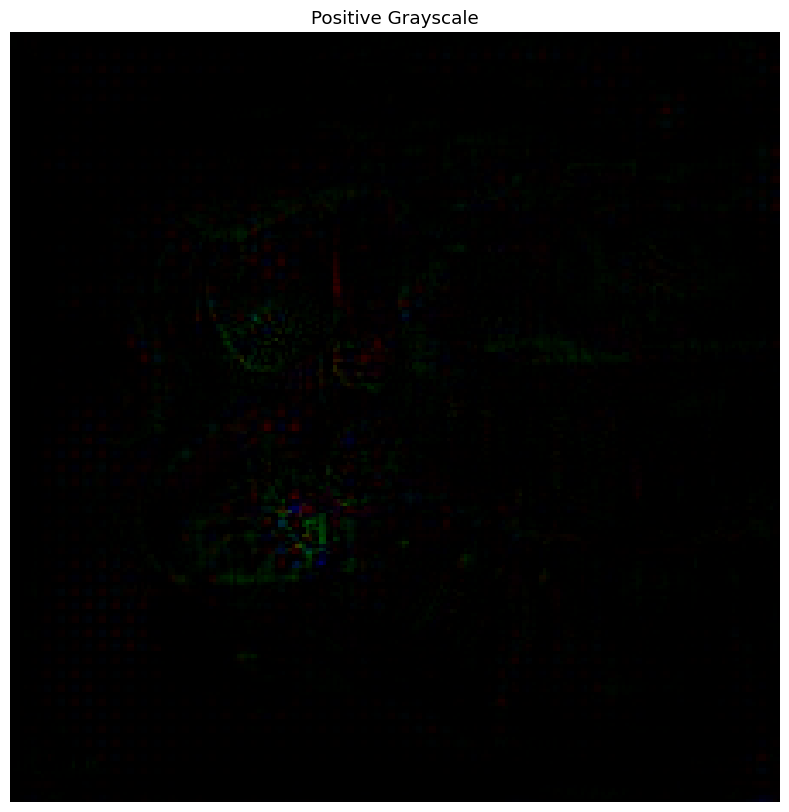

In [248]:
# # Plot the grayscale image
%matplotlib inline
plt.figure(figsize=(15, 10))
plt.imshow(grayscale_image, cmap='gray', interpolation='nearest')
plt.title('Positive Grayscale')
plt.axis('off')
plt.show()

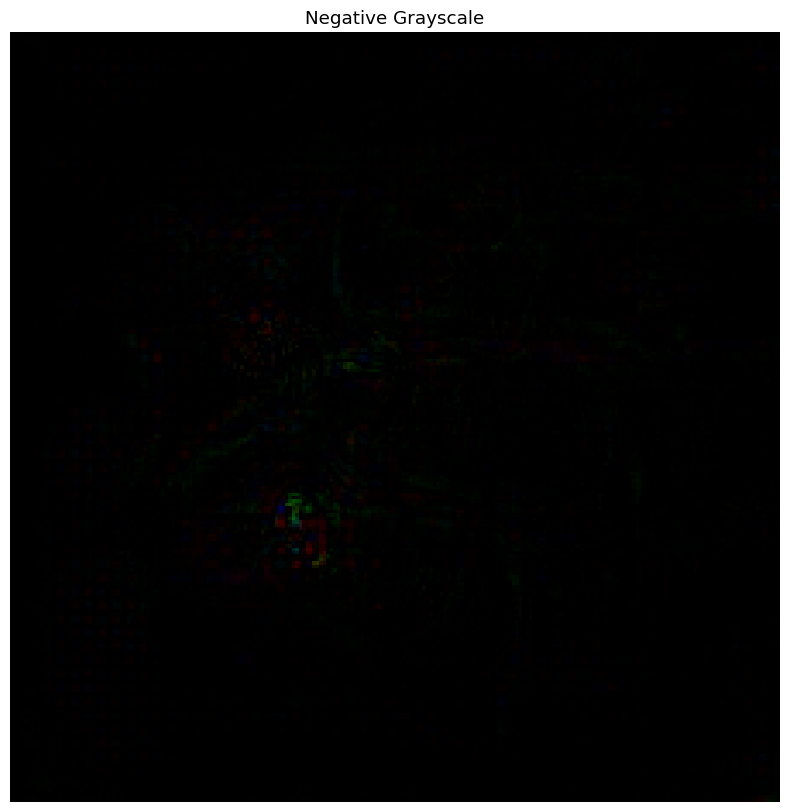

In [249]:
import numpy as np

# Assuming shap_values_layer1 is your NumPy array with shape (1, 224, 224, 3)
# Flatten the array for normalization and then reshape back to the original shape
flattened_array = negative_aps.flatten()

# Min-Max normalization to scale between 0 and 1
normalized_array = (flattened_array - np.min(flattened_array)) / (np.max(flattened_array) - np.min(flattened_array))

# Reshape back to the original shape
normalized_neg = normalized_array.reshape(negative_aps.shape)

# Combine the three channel images into a single grayscale image
grayscale_image_neg = normalized_neg/ 3.0


# Assuming shap_values_layer1 is your NumPy array with shape (1,1, 224, 224, 3)
# Calculate the mean across the color channels (axis=3)
grayscale_image_negative = np.mean(grayscale_image_neg, axis=4)

# Now, grayscale_image has shape (1, 224, 224)
# Remove the first dimension to get a shape of (224, 224) for plotting
grayscale_image_negative = grayscale_image_negative.squeeze()

# Now grayscale_image is ready for plotting and has shape (224, 224)

# # Plot the grayscale image
plt.figure(figsize=(15, 10))
plt.imshow(grayscale_image_negative, cmap='gray', interpolation='nearest')
plt.title('Negative Grayscale')
plt.axis('off')
plt.show()

In [250]:
import numpy as np

# Assuming the normalized array is already flattened and has a shape that can be reshaped into (224, 224)
# For demonstration, let's create a dummy array that represents a flattened version of the grayscale image
# This would normally be your flattened_array or a specific channel if it's a color image

# Find the 95th percentile
percentile_95 = np.percentile(grayscale_image_negative, 95)

percentile_95

0.013387213422301196

In [251]:
import numpy as np

# Assuming the normalized array is already flattened and has a shape that can be reshaped into (224, 224)
# For demonstration, let's create a dummy array that represents a flattened version of the grayscale image
# This would normally be your flattened_array or a specific channel if it's a color image

# Find the 95th percentile
percentile_95 = np.percentile(grayscale_image_negative, 95)

# Assuming grayscale_image_negative is your array
grayscale_neg_thresholded = grayscale_image_negative

# Replace values less than 0.0152 with 0
grayscale_neg_thresholded[grayscale_neg_thresholded < percentile_95] = 0

# Print the modified array
print(grayscale_neg_thresholded)

[[[          0           0           0]
  [          0           0           0]
  [          0           0           0]
  ...
  [          0           0           0]
  [          0           0           0]
  [          0           0           0]]

 [[          0           0           0]
  [          0           0           0]
  [          0           0           0]
  ...
  [          0           0           0]
  [          0           0           0]
  [          0           0           0]]

 [[          0           0           0]
  [          0           0           0]
  [          0           0           0]
  ...
  [          0           0           0]
  [          0           0           0]
  [          0           0           0]]

 ...

 [[          0           0           0]
  [          0           0           0]
  [          0           0           0]
  ...
  [          0           0           0]
  [          0    0.016264           0]
  [          0           0           0]]

 [

In [252]:
import numpy as np

# Assuming grayscale_image_negative is your array
grayscale_neg_thresholded = grayscale_image_negative

# Replace values less than 0.0152 with 0
grayscale_neg_thresholded[grayscale_neg_thresholded < percentile_95] = 0

# Print the modified array
print(grayscale_neg_thresholded)


[[[          0           0           0]
  [          0           0           0]
  [          0           0           0]
  ...
  [          0           0           0]
  [          0           0           0]
  [          0           0           0]]

 [[          0           0           0]
  [          0           0           0]
  [          0           0           0]
  ...
  [          0           0           0]
  [          0           0           0]
  [          0           0           0]]

 [[          0           0           0]
  [          0           0           0]
  [          0           0           0]
  ...
  [          0           0           0]
  [          0           0           0]
  [          0           0           0]]

 ...

 [[          0           0           0]
  [          0           0           0]
  [          0           0           0]
  ...
  [          0           0           0]
  [          0    0.016264           0]
  [          0           0           0]]

 [

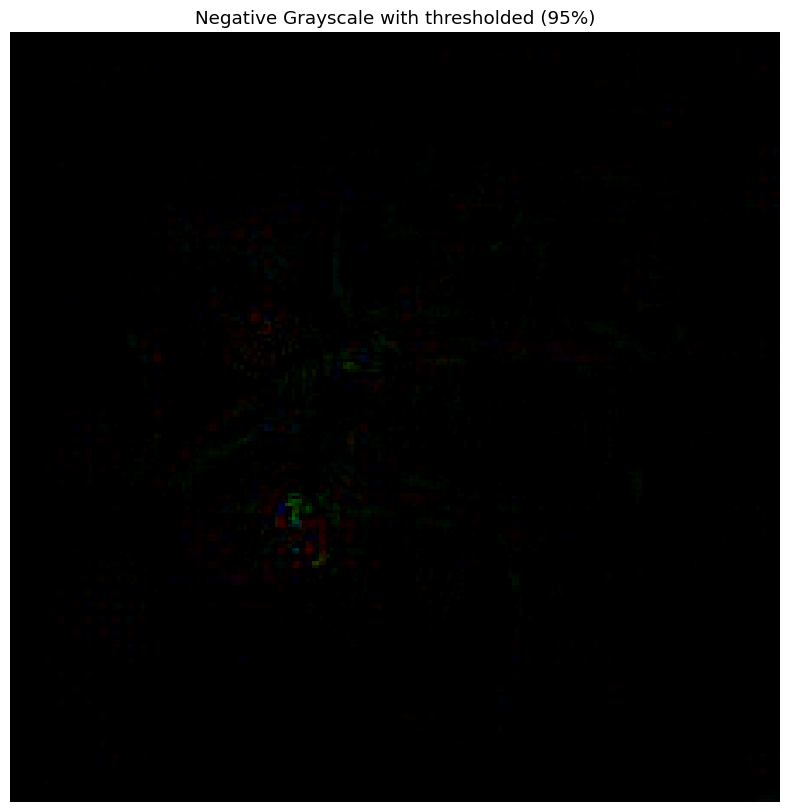

In [253]:
# # Plot the grayscale image
plt.figure(figsize=(15, 10))
plt.imshow(grayscale_neg_thresholded, cmap='gray', interpolation='nearest')
plt.title('Negative Grayscale with thresholded (95%)')
plt.axis('off')
plt.show()

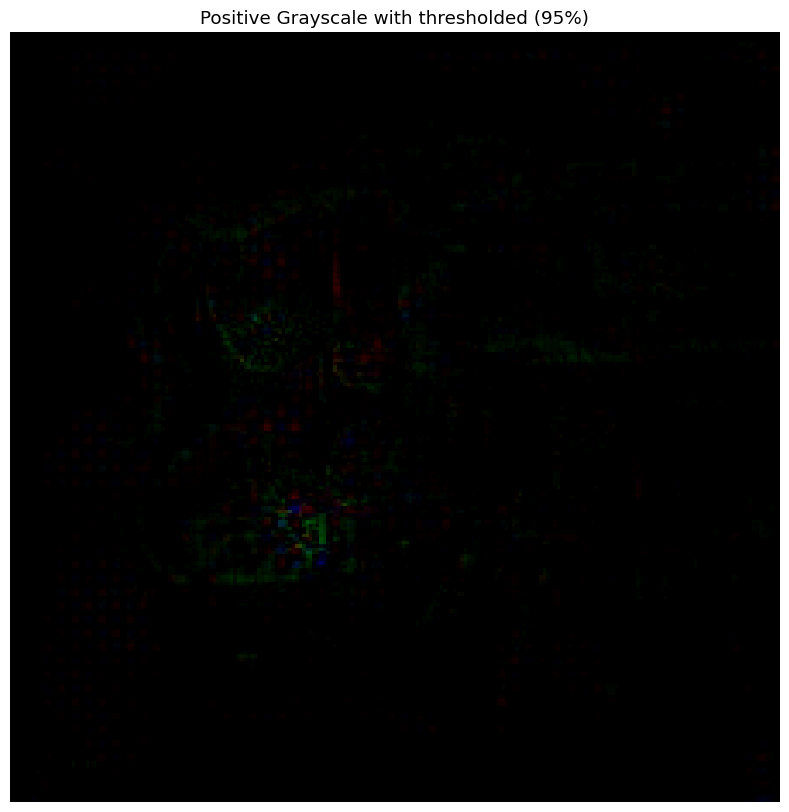

In [254]:
import numpy as np

# Assuming the normalized array is already flattened and has a shape that can be reshaped into (224, 224)
# For demonstration, let's create a dummy array that represents a flattened version of the grayscale image
# This would normally be your flattened_array or a specific channel if it's a color image

# Find the 95th percentile
percentile_95_pos = np.percentile(grayscale_image, 95)

percentile_95_pos

import numpy as np

# Assuming grayscale_image_negative is your array
grayscale_pos_thresholded = grayscale_image

# Replace values less than 0.0152 with 0
grayscale_pos_thresholded[grayscale_pos_thresholded < percentile_95_pos] = 0

# # Plot the grayscale image
plt.figure(figsize=(15, 10))
plt.imshow(grayscale_pos_thresholded, cmap='gray', interpolation='nearest')
plt.title('Positive Grayscale with thresholded (95%)')
plt.axis('off')
plt.show()


In [255]:
image_paths['F15_1']

'/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/15Y/F/Both/FlipB157.jpg'

In [256]:
df_F7_1_filtered = nms_per_class(results_F7_1,iou_threshold=0.5)
df_M7_1_filtered = nms_per_class(results_M7_1,iou_threshold=0.5)
df_F9_1_filtered = nms_per_class(results_F9_1,iou_threshold=0.5)
df_M9_1_filtered = nms_per_class(results_M9_1,iou_threshold=0.5)
df_F11_1_filtered = nms_per_class(results_F11_1,iou_threshold=0.5)
df_M11_1_filtered = nms_per_class(results_M11_1,iou_threshold=0.5)
df_F13_1_filtered = nms_per_class(results_F13_1,iou_threshold=0.5)
df_M13_1_filtered = nms_per_class(results_M13_1,iou_threshold=0.5)
df_F15_1_filtered = nms_per_class(results_F15_1,iou_threshold=0.5)
df_M15_1_filtered = nms_per_class(results_M15_1,iou_threshold=0.5)

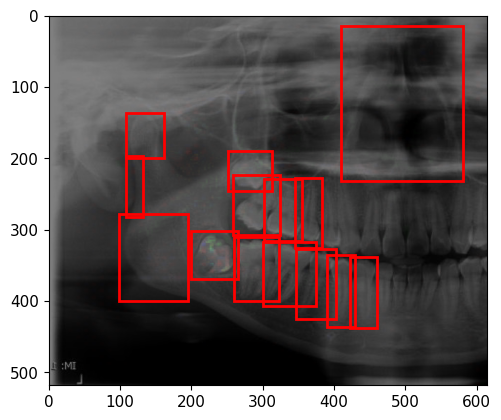

In [309]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd
from PIL import Image
import numpy as np

def plot_bboxes_on_image(image_path, df, grayscale_image):
    # Load the original image
    img = Image.open(image_path)
    img_array = np.array(img)

    # Get the image dimensions
    image_width, image_height = img.size

    # Create figure and axes
    fig, ax = plt.subplots()

    # Display the original image
    ax.imshow(img)

    # Overlay the grayscale image with transparency
    ax.imshow(grayscale_image, cmap='Reds', alpha=0.5, extent=[0, image_width, image_height, 0])

    # Iterate over rows in the DataFrame
    for index, row in df.iterrows():
        xmin, ymin, xmax, ymax = row['xmin'], row['ymin'], row['xmax'], row['ymax']
        confidence, name = row['confidence'], row['name']

        # Convert coordinates to absolute values
        abs_xmin = xmin * image_width
        abs_ymin = ymin * image_height
        abs_width = (xmax - xmin) * image_width
        abs_height = (ymax - ymin) * image_height

        # Map bounding box to the grayscale image
        # Calculate the region of interest in the grayscale image
        roi_xmin = int(xmin * grayscale_image.shape[1])
        roi_ymin = int(ymin * grayscale_image.shape[0])
        roi_xmax = int(xmax * grayscale_image.shape[1])
        roi_ymax = int(ymax * grayscale_image.shape[0])

        # Extract the region of interest from the grayscale image
        roi = grayscale_image[roi_ymin:roi_ymax, roi_xmin:roi_xmax]

        # Calculate the percentage of nonzero pixels
        nonzero_percentage = np.count_nonzero(roi) / (roi.shape[0] * roi.shape[1])

        # If the percentage of nonzero pixels exceeds 10%, plot the bounding box
        if nonzero_percentage > 0.1:
            # Create a rectangle patch
            rect = patches.Rectangle(
                (abs_xmin, abs_ymin),
                abs_width,
                abs_height,
                linewidth=2,
                edgecolor='r',
                facecolor='none'  # Set facecolor to 'none' for an unfilled rectangle
            )

            # Add the rectangle to the axes
            ax.add_patch(rect)

            # Add confidence and class label as text
            #text = f'Class: {name}\nConfidence: {confidence:.2f}'
            #plt.text(abs_xmin, abs_ymin - 10, text, color='r', fontsize=8, bbox=dict(facecolor='white', alpha=0.5))

    # Show the plot
    plt.show()

# Set your image path and DataFrame (df)
image_path = '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/15Y/F/Both/FlipB157.jpg'
# Assuming df is your DataFrame containing bounding box coordinates, confidence, and class labels

plot_bboxes_on_image(image_path, df_F15_1_filtered, grayscale_neg_thresholded)


### mean

In [310]:
import pandas as pd
import numpy as np

def calculate_mean_shap_above_threshold(df, percentile_threshold=90):

    filtered_df = df[df['nonzero_percentage'] > 10]

    # คำนวณค่า percentile ของค่า SHAP
    threshold_value = np.percentile(filtered_df['shap_value'], percentile_threshold)

    # กรองเฉพาะค่าที่มากกว่าค่า percentile
    high_shap_values = filtered_df[filtered_df['shap_value'] > threshold_value]['shap_value']

    # คำนวณค่าเฉลี่ยของค่า SHAP ที่มากกว่าค่า percentile
    mean_shap = high_shap_values.mean()

    return mean_shap

data = {
    'shap_value': np.random.normal(loc=0, scale=1, size=100),
    'nonzero_percentage': np.random.uniform(low=0, high=100, size=100)
}
df = pd.DataFrame(data)

mean_shap_value = calculate_mean_shap_above_threshold(df)
print("Mean SHAP value above 90th percentile:", mean_shap_value)


Mean SHAP value above 90th percentile: 1.6147123482840877


### a

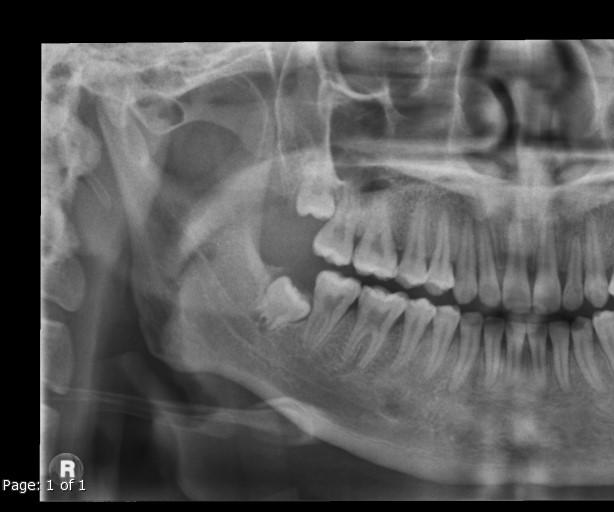

In [258]:
from IPython.display import Image, display

image_path = "/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Normal/19Y/M/Both/L87.jpg"
display(Image(filename=image_path))

In [259]:
DATA_PATH = "/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Normal"
os.chdir(DATA_PATH)

In [260]:
# Get unique age values
unique_ages = sdf_test['Age(year)'].unique()

# Iterate through unique ages and calculate shape for 'M' gender
for age in unique_ages:
    shape = sdf_test[(sdf_test['Age(year)'] == age) & (sdf_test['Gender'] == 'M')].shape
    print(f"Age {age}: {shape}")

Age 7: (17, 13)
Age 8: (15, 13)
Age 9: (17, 13)
Age 10: (8, 13)
Age 11: (10, 13)
Age 12: (10, 13)
Age 13: (15, 13)
Age 14: (3, 13)
Age 15: (4, 13)
Age 16: (5, 13)
Age 17: (9, 13)
Age 18: (3, 13)
Age 19: (7, 13)
Age 20: (4, 13)
Age 21: (9, 13)
Age 22: (3, 13)
Age 23: (1, 13)
Age 25: (1, 13)


In [261]:
# Get unique age values
unique_ages = sdf_test['Age(year)'].unique()

# Iterate through unique ages and calculate shape for 'M' gender
for age in unique_ages:
    shape = sdf_test[(sdf_test['Age(year)'] == age) & (sdf_test['Gender'] == 'F')].shape
    print(f"Age {age}: {shape}")

Age 7: (18, 13)
Age 8: (19, 13)
Age 9: (15, 13)
Age 10: (10, 13)
Age 11: (9, 13)
Age 12: (10, 13)
Age 13: (9, 13)
Age 14: (13, 13)
Age 15: (7, 13)
Age 16: (6, 13)
Age 17: (8, 13)
Age 18: (8, 13)
Age 19: (4, 13)
Age 20: (3, 13)
Age 21: (7, 13)
Age 22: (3, 13)
Age 23: (0, 13)
Age 25: (1, 13)


In [262]:
# Get unique age values
unique_ages = sdf_test['Age(year)'].unique()

# Iterate through unique ages and calculate shape for 'M' gender
for age in unique_ages:
    shape = sdf_test[(sdf_test['Age(year)'] == age)].shape
    print(f"Age {age}: {shape}")

Age 7: (35, 13)
Age 8: (34, 13)
Age 9: (32, 13)
Age 10: (18, 13)
Age 11: (19, 13)
Age 12: (20, 13)
Age 13: (24, 13)
Age 14: (16, 13)
Age 15: (11, 13)
Age 16: (11, 13)
Age 17: (17, 13)
Age 18: (11, 13)
Age 19: (11, 13)
Age 20: (7, 13)
Age 21: (16, 13)
Age 22: (6, 13)
Age 23: (1, 13)
Age 25: (2, 13)


In [263]:
sdf_test.loc[113, 'Path_Name']

'/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/9Y/F/Both/FlipW86.jpg'

# a

###อายุ

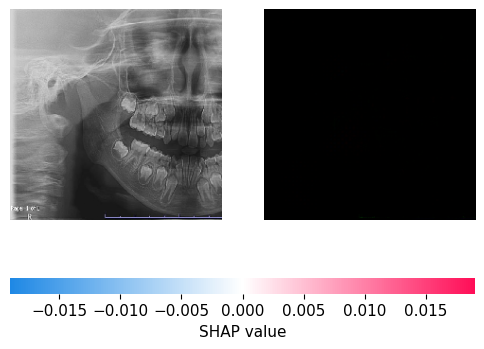

In [264]:
shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[0]])
shap.image_plot(shap_values_layer1, background_test_array[[0]])

In [265]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(0, 11):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [266]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(11, 21):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [267]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(21, 31):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [268]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(31, 41):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [269]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(41, 51):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [270]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(51, 61):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [271]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(61, 71):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [272]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(71, 81):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [273]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(81, 91):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [274]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(91, 101):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [275]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(101, 111):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [276]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(111, 121):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [277]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(121, 131):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [278]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(131, 141):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [279]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(141, 151):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [280]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(151, 161):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [281]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(161, 171):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [282]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(171, 181):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [283]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(181, 191):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [284]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(191, 201):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [285]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(201, 211):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [286]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(211, 221):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [287]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(221, 231):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [288]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(231, 241):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [289]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(241, 251):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [290]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(251, 261):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [291]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(261, 271):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [292]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(271, 281):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [304]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(281, 291):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [305]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(291, 301):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


IndexError: index 291 is out of bounds for axis 0 with size 291

####300

In [298]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(301, 311):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


IndexError: index 301 is out of bounds for axis 0 with size 291

In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(311, 321):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(321, 331):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(331, 341):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(341, 351):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(351, 361):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(361, 371):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(371, 381):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(381, 391):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(391, 401):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


####400

In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(401, 411):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(411, 421):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(421, 431):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(431, 441):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(441, 451):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(451, 461):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(461, 471):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(471, 481):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(481, 491):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(491, 501):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


####500

In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(501, 511):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(511, 521):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(521, 531):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(531, 541):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(541, 551):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(551, 561):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(561, 571):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(571, 581):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(581, 591):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(591, 601):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


####600

In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(601, 611):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(611, 621):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(621, 631):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(631, 641):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(641, 651):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(651, 661):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(661, 671):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(671, 681):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(681, 691):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Assuming explainer_layer1 and background_test_array are defined

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(691, 701):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


####700

In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(701, 711):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(711, 721):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(721, 731):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(731, 741):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(741, 751):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(751, 761):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(761, 771):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(771, 781):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(781, 791):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(791, 801):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


####800

In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(801, 811):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(811, 821):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(821, 831):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(831, 841):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(841, 851):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(851, 861):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(861, 871):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(871, 881):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(881, 891):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(891, 901):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


####900

In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(901, 911):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(911, 921):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(921, 931):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(931, 941):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(941, 951):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(951, 961):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(961, 971):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(971, 981):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(981, 991):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(991, 1001):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


####1000

In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1001, 1011):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1011, 1021):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1021, 1031):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1031, 1041):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1041, 1051):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1051, 1061):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1061, 1071):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1071, 1081):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1081, 1091):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1091, 1101):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


####1100

In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1101, 1111):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1111, 1121):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1121, 1131):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1131, 1141):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1141, 1151):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1151, 1161):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1161, 1171):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1171, 1181):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1181, 1191):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1191, 1201):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


####1200

In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1201, 1211):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1211, 1221):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1221, 1231):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1231, 1241):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1241, 1251):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1251, 1261):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1261, 1271):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1271, 1281):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1281, 1291):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1291, 1301):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


####1300

In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1301, 1311):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1311, 1321):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1321, 1331):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1331, 1341):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1341, 1351):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1351, 1361):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1361, 1371):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1371, 1381):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1381, 1391):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1391, 1401):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


####1400

In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1401, 1411):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1411, 1421):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1421, 1431):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1431, 1441):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1441, 1451):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1451, 1461):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1461, 1471):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1471, 1481):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1481, 1491):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1491, 1501):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


####1500

In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1501, 1511):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1511, 1521):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1521, 1531):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1531, 1541):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1541, 1551):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()


In [ ]:
import shap
import os
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/gdrive')

# Create a folder to store images
if not os.path.exists("/content/gdrive/My Drive/shap_images"):
    os.makedirs("/content/gdrive/My Drive/shap_images")

for i in range(1551, 1561):
    shap_values_layer1 = explainer_layer1.shap_values(background_test_array[[i]])

    # Plot the SHAP values
    shap.image_plot(shap_values_layer1, background_test_array[[i]], show=False)

    # Save the figure
    image_path = f"/content/gdrive/My Drive/shap_images/shap_image_{i}.png"
    plt.savefig(image_path, bbox_inches='tight')

    # Close the figure to prevent overlapping
    plt.close()
